[Group 1 Galaxies](#1)
[Group 2 Galaxies](#2)
[Group 3 Galaxies](#3)
[Group 4 Galaxies](#4)
[Group 5 Galaxies](#5)
[Group 6 Galaxies](#6)

### This code provides the prdictions, feature ranking and a plot of true vs predicted values of galaxy sizes  independent datasets divided by 6 galaxy morphologies: 

### Groups 1, 2, 3, 4, 5 and 6 (ellipticals)

In [1]:
import time
import numpy as np
import pandas as pd

import galsim #install with conda install -c conda_forge galsim

import matplotlib.pyplot as plt
from matplotlib import pyplot
import matplotlib.cm as cm
import matplotlib.colors as norm
from matplotlib.gridspec import SubplotSpec
import seaborn as sns

from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn import svm
from sklearn.svm import SVR

from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import cross_validate, KFold, StratifiedKFold
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score
from sklearn.inspection import permutation_importance
from sklearn.pipeline import make_pipeline #This allows one to build different steps together
from sklearn.preprocessing import StandardScaler, RobustScaler

from tqdm import tqdm 

from pysr import PySRRegressor


In [2]:
import target_predicting_ML_functions_and_feature_ranking as functions
import RF_target_predicting_and_learning_curves_functions as tp_lc_functions

#### <font color='violet'> ML modelling with 33 galaxy and halo features; df from v5 used here


#### Read the normalized 31-feature dataset (see explanations in related doc 'TNG-SAM 33-feature analysis')

In [3]:
df_normalized_31 = pd.read_csv('Halo Mass Normalized Dataset w 31 features.csv')

#### Add the column 'BulgeMstar_ratio' defined as Bulge mass / Stellar mass, to be used as a proxy for galaxy morphology

In [4]:
df_normalized_31.loc[:, 'BulgeMstar_ratio'] = df_normalized_31.loc[:,'GalpropNormMbulge']/df_normalized_31.loc[:, 'GalpropNormMstar']


In [5]:
df_normalized_31.shape

(35390, 33)

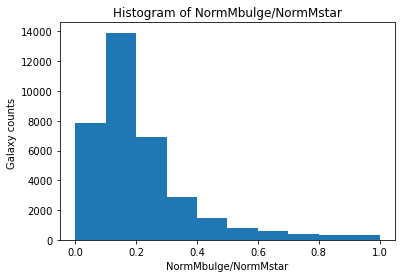

In [6]:
plt.hist(df_normalized_31['BulgeMstar_ratio'])
plt.title('Histogram of NormMbulge/NormMstar')
plt.xlabel('NormMbulge/NormMstar')
plt.ylabel('Galaxy counts ')
# plt.savefig('Histogram of GalpropNormMbulgebyNormMstar.jpg', dpi=500)

plt.show()

#### Define the 6 morphology groups by increasing Mbulge/Mstar ratio

In [7]:
# 7,865 galaxies in df_1
df_1 = df_normalized_31.loc[df_normalized_31.loc[:, 'BulgeMstar_ratio']<=0.10] 

# 13,921 galaxies in df_2
df_2 = df_normalized_31.loc[(df_normalized_31.BulgeMstar_ratio > 0.10) & (df_normalized_31.BulgeMstar_ratio <= 0.20)] 

# 6,880 galaxies in df_3
df_3 = df_normalized_31.loc[(df_normalized_31.BulgeMstar_ratio > 0.20) & (df_normalized_31.BulgeMstar_ratio <= 0.30)] 

# 2,858 galaxies in df_4
df_4 = df_normalized_31.loc[(df_normalized_31.BulgeMstar_ratio > 0.30) & (df_normalized_31.BulgeMstar_ratio <= 0.40)] 

# 1,444 galaxies in df_5
df_5 = df_normalized_31.loc[(df_normalized_31.BulgeMstar_ratio > 0.40) & (df_normalized_31.BulgeMstar_ratio <= 0.50)] 

# 2,422 galaxies in df_6
df_6 = df_normalized_31.loc[df_normalized_31.loc[:, 'BulgeMstar_ratio']>0.50] 


## <font color='purple'> <a id =0> </a> <br> All morphologies

In [32]:
X_all = df_normalized_31.drop(columns=['GalpropNormHalfRadius', 'BulgeMstar_ratio'])


y_all = df_normalized_31.loc[:,'GalpropNormHalfRadius']

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9144 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
RF Accuracy: 0.92 (+/- 0.01)


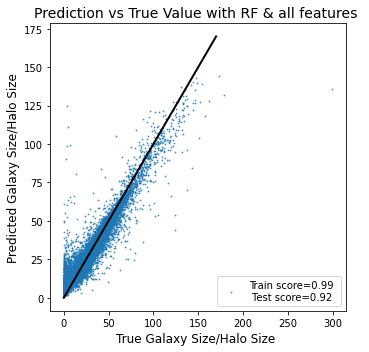

Elapsed time to compute the importances: 0.464 seconds
Elapsed time to compute the importances: 92.568 seconds


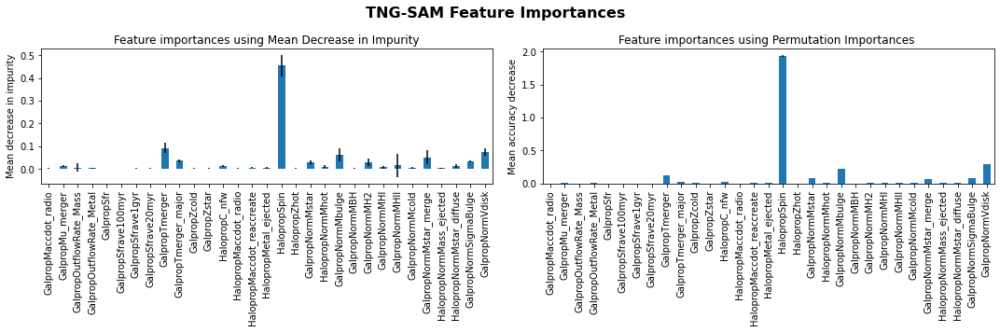

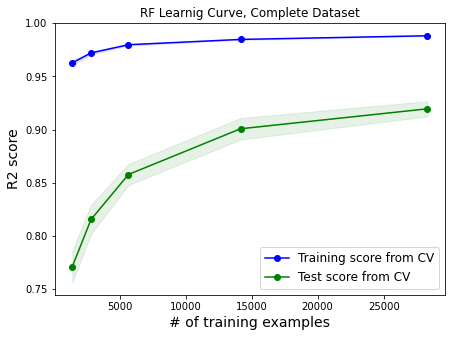

Elapsed time to run RF func and Learning Curves on the complete dataset: 1283.603 seconds


In [33]:
# this code takes ~20min to run on the complete dataset galaxies with ~35,000 entries
start_time = time.time()

RF_results_lc_all = tp_lc_functions.target_predicting_RF_function(X_all, y_all, 'RF Learnig Curve, Complete Dataset')

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func and Learning Curves on the complete dataset: {elapsed_time:.3f} seconds")

In [34]:
lc_all = RF_results_lc_all[4]

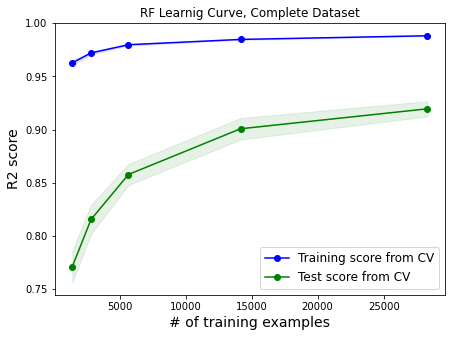

In [35]:
lc_all

In [36]:
# lc_all.savefig('RF Complete Dataset Learning Curve.jpeg', dpi=500)


## <font color='purple'> <a id =1> </a> <br> Group 1 Galaxies: B/Mstar <= 0.1

In [13]:
X_1 = df_1.drop(columns=['GalpropNormHalfRadius', 'BulgeMstar_ratio'])


y_1 = df_1.loc[:,'GalpropNormHalfRadius']

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9850 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 100}
RF Accuracy: 0.99 (+/- 0.00)


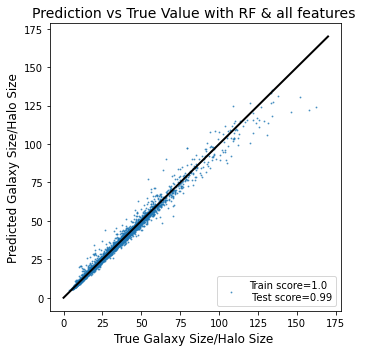

Elapsed time to compute the importances: 0.031 seconds
Elapsed time to compute the importances: 6.411 seconds


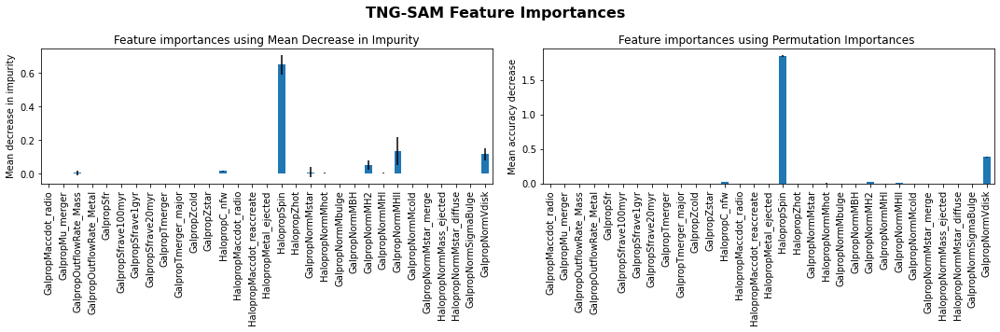

  0%|                                                    | 0/31 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/31 [00:00<00:21,  1.38it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 2/31 [00:02<00:32,  1.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▎                                       | 3/31 [00:03<00:30,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 4/31 [00:04<00:29,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 5/31 [00:05<00:28,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▌                                   | 6/31 [00:06<00:28,  1.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|█████████▉                                  | 7/31 [00:07<00:28,  1.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▎                                | 8/31 [00:08<00:26,  1.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 9/31 [00:10<00:24,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▊                             | 10/31 [00:10<00:20,  1.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                           | 11/31 [00:11<00:20,  1.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▋                          | 12/31 [00:13<00:20,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████                         | 13/31 [00:14<00:20,  1.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▍                       | 14/31 [00:14<00:16,  1.02it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 15/31 [00:16<00:16,  1.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 16/31 [00:17<00:15,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▌                   | 17/31 [00:18<00:15,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 18/31 [00:19<00:14,  1.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 19/31 [00:20<00:13,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▋               | 20/31 [00:21<00:11,  1.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 21/31 [00:22<00:10,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▌            | 22/31 [00:23<00:08,  1.11it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▉           | 23/31 [00:24<00:08,  1.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▎         | 24/31 [00:25<00:07,  1.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 25/31 [00:26<00:06,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 26/31 [00:28<00:05,  1.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 27/31 [00:29<00:04,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▊    | 28/31 [00:30<00:03,  1.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▏  | 29/31 [00:31<00:02,  1.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 30/31 [00:32<00:01,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 31/31 [00:33<00:00,  1.07s/it]


1. iteration: 
	 1 HalopropSpin 0.7003232421335875


  0%|                                                    | 0/30 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/30 [00:01<00:56,  1.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 2/30 [00:03<00:55,  1.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 3/30 [00:05<00:50,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 4/30 [00:07<00:49,  1.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 5/30 [00:09<00:50,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 6/30 [00:11<00:48,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▎                                 | 7/30 [00:13<00:46,  2.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 8/30 [00:15<00:44,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 9/30 [00:17<00:41,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▎                            | 10/30 [00:19<00:36,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▊                           | 11/30 [00:21<00:36,  1.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 12/30 [00:23<00:33,  1.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 13/30 [00:25<00:32,  1.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████                       | 14/30 [00:26<00:30,  1.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 15/30 [00:28<00:28,  1.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▉                    | 16/30 [00:30<00:27,  1.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 17/30 [00:33<00:26,  2.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 18/30 [00:35<00:23,  1.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 19/30 [00:37<00:22,  2.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 20/30 [00:39<00:20,  2.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 21/30 [00:41<00:18,  2.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 22/30 [00:43<00:16,  2.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.030, test=-0.005) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.025, test=-0.009) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.026, test=-0.008) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.025, test=-0.010) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.041, test=-0.010) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.035, test=-0.002) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.106, test=-0.016) total time=   0.2s
[CV 2/3

[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.038, test=-0.015) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.026, test=-0.009) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.031, test=-0.001) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.033, test=-0.007) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.130, test=-0.022) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.447, test=-0.220) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.322, test=0.240) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n

 77%|████████████████████████████████▉          | 23/30 [00:45<00:14,  2.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.020, test=0.007) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.023, test=0.009) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.031, test=-0.000) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.036, test=-0.008) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.127, test=-0.026) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.132, test=-0.027) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.435, test=-0.229) total time=   0.1s
[CV 2/3] 

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.017, test=0.001) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.066, test=-0.056) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.071, test=-0.067) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.131, test=0.094) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.538, test=-0.153) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.553, test=-0.161) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.172, test=0.103) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n

 80%|██████████████████████████████████▍        | 24/30 [00:47<00:12,  2.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.019, test=0.000) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.029, test=-0.003) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.041, test=-0.010) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.031, test=-0.002) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.120, test=-0.028) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.467, test=-0.284) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.310, test=0.273) total time=   0.2s
[CV 3/3] E

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.481, test=-0.014) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.055, test=0.050) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.057, test=0.052) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.057, test=0.047) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.282, test=0.262) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.378, test=0.158) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.399, test=0.164) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimato

[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.314, test=0.084) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.316, test=0.101) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.199, test=0.139) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.200, test=0.158) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.560, test=-0.072) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.573, test=-0.041) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.158, test=0.090) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estim

 83%|███████████████████████████████████▊       | 25/30 [00:49<00:10,  2.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 26/30 [00:51<00:08,  2.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 27/30 [00:53<00:06,  2.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 28/30 [00:55<00:04,  2.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 29/30 [00:57<00:01,  1.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 30/30 [00:59<00:00,  1.98s/it]


2. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359


  0%|                                                    | 0/29 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▌                                          | 1/29 [00:02<01:21,  2.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███                                         | 2/29 [00:05<01:12,  2.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▌                                       | 3/29 [00:08<01:15,  2.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 4/29 [00:11<01:13,  2.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▌                                    | 5/29 [00:14<01:12,  3.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████                                   | 6/29 [00:17<01:10,  3.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 7/29 [00:21<01:08,  3.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 8/29 [00:24<01:05,  3.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▋                              | 9/29 [00:27<01:01,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 34%|██████████████▊                            | 10/29 [00:29<00:55,  2.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▎                          | 11/29 [00:32<00:53,  2.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▊                         | 12/29 [00:35<00:50,  2.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▎                       | 13/29 [00:38<00:46,  2.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 14/29 [00:41<00:43,  2.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 15/29 [00:44<00:40,  2.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 16/29 [00:47<00:38,  2.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▏                 | 17/29 [00:50<00:35,  2.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▋                | 18/29 [00:53<00:31,  2.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 66%|████████████████████████████▏              | 19/29 [00:56<00:29,  2.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▋             | 20/29 [00:59<00:26,  2.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████▏           | 21/29 [01:01<00:23,  2.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▌          | 22/29 [01:04<00:20,  2.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 23/29 [01:07<00:16,  2.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 24/29 [01:10<00:14,  2.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████      | 25/29 [01:13<00:11,  2.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.948, test=0.868) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.944, test=0.889) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.965, test=0.867) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.897, test=0.887) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.873) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.941, test=0.884) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.943, test=0.874) total time=   0.6s
[CV 1/3] END b

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.959, test=0.881) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.846, test=0.820) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.900, test=0.827) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.906, test=0.809) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.905, test=0.817) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.905, test=0.881) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.902, test=0.884) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimato

 90%|██████████████████████████████████████▌    | 26/29 [01:16<00:08,  2.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████   | 27/29 [01:19<00:05,  2.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 28/29 [01:21<00:02,  2.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.944, test=0.872) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.943, test=0.874) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.961, test=0.870) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.843, test=0.831) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.849, test=0.822) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.909, test=0.813) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.901, test=0.885) total time=   0.1s
[CV 2/3] END bo

100%|███████████████████████████████████████████| 29/29 [01:25<00:00,  2.93s/it]


3. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761


  0%|                                                    | 0/28 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.958, test=0.878) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.961, test=0.869) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.847, test=0.819) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.908, test=0.812) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.941, test=0.806) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.902, test=0.894) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.945, test=0.887) total time=   0.3s
[CV 2/3] EN

  4%|█▌                                          | 1/28 [00:03<01:41,  3.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.961, test=0.871) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.848, test=0.821) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.903, test=0.831) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.944, test=0.802) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.903, test=0.894) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.946, test=0.878) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.948, test=0.881) total time=   0.3s
[CV 3/3] EN

  7%|███▏                                        | 2/28 [00:07<01:36,  3.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 3/28 [00:10<01:27,  3.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 4/28 [00:14<01:29,  3.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.957, test=0.882) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.966, test=0.867) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.897, test=0.887) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.946, test=0.875) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.959, test=0.881) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.847, test=0.819) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.902, test=0.815) total time=   0.1s
[CV 2/3] 

 18%|███████▊                                    | 5/28 [00:18<01:28,  3.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.938, test=0.802) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.943, test=0.801) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.903, test=0.894) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.962, test=0.872) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.961, test=0.881) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.718, test=0.743) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.816, test=0.685) total time=   0.1s
[CV 2/3] 

 21%|█████████▍                                  | 6/28 [00:22<01:25,  3.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 7/28 [00:26<01:20,  3.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 8/28 [00:30<01:17,  3.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████▏                             | 9/28 [00:33<01:08,  3.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▎                           | 10/28 [00:36<01:02,  3.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▉                          | 11/28 [00:40<01:01,  3.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▍                        | 12/28 [00:43<00:56,  3.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▉                       | 13/28 [00:47<00:53,  3.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 14/28 [00:50<00:48,  3.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████                    | 15/28 [00:54<00:46,  3.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 16/28 [00:58<00:44,  3.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████                 | 17/28 [01:02<00:42,  3.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▋               | 18/28 [01:06<00:37,  3.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 19/28 [01:09<00:32,  3.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 20/28 [01:13<00:29,  3.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 21/28 [01:17<00:26,  3.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▊         | 22/28 [01:21<00:22,  3.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▎       | 23/28 [01:24<00:18,  3.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 24/28 [01:28<00:14,  3.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 25/28 [01:32<00:11,  3.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▉   | 26/28 [01:36<00:07,  3.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 27/28 [01:40<00:03,  3.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 28/28 [01:43<00:00,  3.69s/it]


4. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723


  0%|                                                    | 0/27 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/27 [00:05<02:12,  5.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▎                                        | 2/27 [00:10<02:07,  5.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 3/27 [00:15<02:04,  5.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.994, test=0.975) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.994, test=0.977) total time=   1.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.975, test=0.967) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.994, test=0.976) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.993, test=0.981) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.961) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.994, test=0.975) total time=   0.2s
[CV 2/3]

 15%|██████▌                                     | 4/27 [00:20<01:56,  5.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▏                                   | 5/27 [00:24<01:43,  4.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 6/27 [00:29<01:39,  4.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.973, test=0.970) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.993, test=0.975) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.994, test=0.976) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.960) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.979) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.984) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.995, test=0.975) total time=   0.8s
[CV 3/3]

 26%|███████████▍                                | 7/27 [00:34<01:35,  4.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.994, test=0.979) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.975, test=0.963) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.993, test=0.978) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.982) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.980) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.973, test=0.968) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.993, test=0.982) total time=   0.2s
[CV 3/3] END b

[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.967) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.993, test=0.983) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.981) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.973, test=0.971) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.974) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.984) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.960) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estim

 30%|█████████████                               | 8/27 [00:38<01:31,  4.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.994, test=0.976) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.973, test=0.970) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.961) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.994, test=0.979) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.994, test=0.985) total time=   1.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.973, test=0.969) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.994, test=0.978) total time=   0.8s
[CV 3/3] E

 33%|██████████████▋                             | 9/27 [00:43<01:26,  4.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▉                           | 10/27 [00:48<01:19,  4.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▌                         | 11/27 [00:52<01:11,  4.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.994, test=0.983) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.967) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.981) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.984) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.974, test=0.967) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.974) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.993, test=0.984) total time=   0.5s
[CV 1/

 44%|███████████████████                        | 12/27 [00:56<01:08,  4.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.993, test=0.981) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.995, test=0.974) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.971, test=0.969) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.977) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.971) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.993, test=0.983) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.978) total time=   0.6s
[CV 3/3] 

[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.974, test=0.961) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.979) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.966) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.993, test=0.978) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.980) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.975, test=0.971) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.994, test=0.983) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estima

 48%|████████████████████▋                      | 13/27 [01:01<01:05,  4.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 14/27 [01:06<01:01,  4.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 15/27 [01:11<00:57,  4.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 16/27 [01:16<00:52,  4.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████                | 17/27 [01:20<00:45,  4.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 18/27 [01:25<00:42,  4.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████▎            | 19/27 [01:30<00:38,  4.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 20/27 [01:35<00:34,  4.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 21/27 [01:40<00:29,  4.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|███████████████████████████████████        | 22/27 [01:45<00:24,  4.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▋      | 23/27 [01:50<00:19,  4.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 24/27 [01:55<00:14,  4.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▊   | 25/27 [02:00<00:09,  4.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 26/27 [02:05<00:04,  4.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 27/27 [02:10<00:00,  4.83s/it]


5. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314


  0%|                                                    | 0/26 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/26 [00:05<02:19,  5.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▍                                        | 2/26 [00:09<01:52,  4.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████                                       | 3/26 [00:15<01:59,  5.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▊                                     | 4/26 [00:21<01:58,  5.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 5/26 [00:26<01:54,  5.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▏                                 | 6/26 [00:32<01:50,  5.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▊                                | 7/26 [00:37<01:39,  5.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▌                              | 8/26 [00:42<01:36,  5.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▏                            | 9/26 [00:47<01:30,  5.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                          | 10/26 [00:53<01:26,  5.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▏                        | 11/26 [00:59<01:22,  5.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▊                       | 12/26 [01:04<01:17,  5.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.986) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.983) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.967) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.994, test=0.987) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.995, test=0.981) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.984) total time=   1.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.965) total time=   0.1s
[CV 2/3] 

 50%|█████████████████████▌                     | 13/26 [01:09<01:08,  5.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████▏                   | 14/26 [01:15<01:05,  5.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▊                  | 15/26 [01:20<01:00,  5.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▍                | 16/26 [01:26<00:55,  5.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.984) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.979) total time=   1.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.974, test=0.960) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.987) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.981) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.974, test=0.964) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.982) total time=   0.5s
[CV 1/3]

[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.981) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.987) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.972, test=0.961) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.969) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.981) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.983) total time=   1.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.969) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estima

 65%|████████████████████████████               | 17/26 [01:31<00:47,  5.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.966) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.981) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.995, test=0.987) total time=   1.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.968) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.994, test=0.984) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.982) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.975, test=0.964) total time=   0.1s
[CV 3/3] EN

[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.968) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.995, test=0.984) total time=   1.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.966) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.995, test=0.983) total time=   1.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.966) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.994, test=0.980) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.981) total time=   1.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimat

 69%|█████████████████████████████▊             | 18/26 [01:37<00:44,  5.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▍           | 19/26 [01:43<00:39,  5.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.983) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.984) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.970) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.985) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.982) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.975, test=0.967) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.986) total time=   0.2s
[CV 2/3] END

 77%|█████████████████████████████████          | 20/26 [01:49<00:34,  5.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.983) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.994, test=0.986) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.995, test=0.983) total time=   1.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.973, test=0.965) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.994, test=0.983) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.994, test=0.983) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.983) total time=   0.7s
[CV 1/3] END b

 81%|██████████████████████████████████▋        | 21/26 [01:55<00:29,  5.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.969) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.994, test=0.986) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.986) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.983) total time=   1.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.975, test=0.965) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.975, test=0.968) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.983) total time=   0.3s
[CV 1/3] EN

 85%|████████████████████████████████████▍      | 22/26 [02:01<00:23,  5.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|██████████████████████████████████████     | 23/26 [02:07<00:17,  5.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▋   | 24/26 [02:13<00:11,  5.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 25/26 [02:19<00:05,  5.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 26/26 [02:25<00:00,  5.58s/it]


6. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412


  0%|                                                    | 0/25 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/25 [00:06<02:41,  6.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▌                                        | 2/25 [00:13<02:36,  6.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▎                                      | 3/25 [00:20<02:28,  6.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 4/25 [00:26<02:21,  6.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 5/25 [00:33<02:13,  6.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 6/25 [00:40<02:05,  6.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▎                               | 7/25 [00:46<01:58,  6.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 8/25 [00:53<01:51,  6.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▊                            | 9/25 [00:59<01:46,  6.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 10/25 [01:06<01:39,  6.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|██████████████████▉                        | 11/25 [01:12<01:31,  6.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 12/25 [01:19<01:26,  6.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 13/25 [01:26<01:21,  6.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████                   | 14/25 [01:33<01:13,  6.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 15/25 [01:40<01:06,  6.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▌               | 16/25 [01:47<01:02,  6.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 17/25 [01:54<00:56,  7.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|██████████████████████████████▉            | 18/25 [02:01<00:48,  6.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▋          | 19/25 [02:08<00:42,  7.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 20/25 [02:15<00:35,  7.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 21/25 [02:21<00:26,  6.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.967) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.986) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   1.5s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.967) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.985) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.983) total time=   0.4s
[CV 2/3] EN

 88%|█████████████████████████████████████▊     | 22/25 [02:28<00:20,  6.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▌   | 23/25 [02:35<00:13,  6.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 24/25 [02:42<00:06,  6.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 25/25 [02:49<00:00,  6.80s/it]


7. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936


  0%|                                                    | 0/24 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/24 [00:07<02:54,  7.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.988) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.968) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.983) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.987) total time=   1.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.968) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.984) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.988) total time=   0.7s
[CV 2/3] END bo

  8%|███▋                                        | 2/24 [00:15<02:46,  7.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.984) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.987) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.968) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.985) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.985) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.975, test=0.969) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.974) total time=   0.9s
[CV 2/3] END b

 12%|█████▌                                      | 3/24 [00:22<02:38,  7.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.971) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.987) total time=   1.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.968) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.989) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.989) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.967) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.988) total time=   0.3s
[CV 2/3] END bo

[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.987) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.984) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   1.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.973) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.987) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.974) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimat

 17%|███████▎                                    | 4/24 [00:30<02:30,  7.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.968) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.984) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.987) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   1.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.974) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.989) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.984) total time=   0.4s
[CV 2/3] EN

[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.985) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   1.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.972) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.989) total time=   1.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.963) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.985) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.989) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estima

 21%|█████████▏                                  | 5/24 [00:37<02:23,  7.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 6/24 [00:43<02:07,  7.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.986) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   1.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.971) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.972) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.988) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.985) total time=   1.7s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.977, test=0.967) total time=   0.2s
[CV 1/3] END

 29%|████████████▊                               | 7/24 [00:51<02:02,  7.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 8/24 [00:58<01:54,  7.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 9/24 [01:04<01:43,  6.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|█████████████████▉                         | 10/24 [01:12<01:39,  7.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▋                       | 11/24 [01:19<01:33,  7.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 12/24 [01:27<01:27,  7.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████▎                   | 13/24 [01:34<01:21,  7.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|█████████████████████████                  | 14/24 [01:42<01:14,  7.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 15/24 [01:50<01:07,  7.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 16/24 [01:57<01:00,  7.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▍            | 17/24 [02:05<00:52,  7.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 18/24 [02:13<00:46,  7.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 19/24 [02:20<00:38,  7.63s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 20/24 [02:28<00:30,  7.63s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 21/24 [02:34<00:21,  7.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▍   | 22/24 [02:42<00:15,  7.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 23/24 [02:50<00:07,  7.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 24/24 [02:58<00:00,  7.42s/it]


8. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845


  0%|                                                    | 0/23 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▉                                          | 1/23 [00:08<03:04,  8.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|███▊                                        | 2/23 [00:16<02:57,  8.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 3/23 [00:25<02:48,  8.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▋                                    | 4/23 [00:32<02:29,  7.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▌                                  | 5/23 [00:39<02:15,  7.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 6/23 [00:45<02:00,  7.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▍                              | 7/23 [00:53<01:59,  7.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                            | 8/23 [01:01<01:55,  7.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.984) total time=   2.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.979, test=0.969) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.988) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.989) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.977, test=0.963) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.974) total time=   1.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.986) total time=   0.4s
[CV 1/3] EN

 39%|█████████████████▏                          | 9/23 [01:10<01:50,  7.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 10/23 [01:17<01:39,  7.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▌                      | 11/23 [01:25<01:34,  7.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▍                    | 12/23 [01:32<01:23,  7.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 13/23 [01:41<01:19,  7.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.990) total time=   1.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.966) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.975, test=0.968) total time=   1.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.986) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.985) total time=   1.9s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.966) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.984) total time=   0.4s
[CV 1/3] EN

[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.973) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.980) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.981) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.986) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   1.9s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.964) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.988) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimato

 61%|██████████████████████████▏                | 14/23 [01:49<01:12,  8.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 15/23 [01:58<01:05,  8.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.986) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.969) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.985) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.990) total time=   2.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.969) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.970) total time=   1.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.988) total time=   0.6s
[CV 1/3] END 

 70%|█████████████████████████████▉             | 16/23 [02:06<00:57,  8.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.986) total time=   1.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.979, test=0.972) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.987) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.989) total time=   2.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.971) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.988) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.995, test=0.988) total time=   0.9s
[CV 3/3] END b

 74%|███████████████████████████████▊           | 17/23 [02:15<00:50,  8.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▋         | 18/23 [02:23<00:41,  8.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   1.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.971) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.981) total time=   1.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.969) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.987) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.988) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.968) total time=   0.2s
[CV 3/3] END

 83%|███████████████████████████████████▌       | 19/23 [02:32<00:33,  8.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 20/23 [02:40<00:25,  8.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.979, test=0.964) total time=   1.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   1.9s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.971) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.987) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   1.9s
[CV 2/3

 91%|███████████████████████████████████████▎   | 21/23 [02:49<00:16,  8.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 22/23 [02:57<00:08,  8.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 23/23 [03:04<00:00,  8.02s/it]


9. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774


  0%|                                                    | 0/22 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/22 [00:09<03:11,  9.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|████                                        | 2/22 [00:18<03:04,  9.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 3/22 [00:27<02:56,  9.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|████████                                    | 4/22 [00:35<02:35,  8.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████                                  | 5/22 [00:44<02:30,  8.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|████████████                                | 6/22 [00:53<02:23,  8.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 7/22 [01:03<02:15,  9.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|████████████████                            | 8/22 [01:11<02:05,  8.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 9/22 [01:21<01:58,  9.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▌                       | 10/22 [01:30<01:49,  9.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 11/22 [01:39<01:40,  9.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▍                   | 12/22 [01:48<01:31,  9.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 13/22 [01:58<01:22,  9.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▎               | 14/22 [02:07<01:13,  9.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▎             | 15/22 [02:16<01:04,  9.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▎           | 16/22 [02:25<00:55,  9.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▏         | 17/22 [02:33<00:44,  8.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▏       | 18/22 [02:43<00:35,  8.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████▏     | 19/22 [02:52<00:27,  9.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.972) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.987) total time=   2.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.990) total time=   2.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.979, test=0.969) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.988) total time=   2.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.961) total time=   0.2s
[CV 2/3] END 

 91%|███████████████████████████████████████    | 20/22 [03:01<00:18,  9.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|█████████████████████████████████████████  | 21/22 [03:11<00:09,  9.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 22/22 [03:20<00:00,  9.11s/it]


10. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134


  0%|                                                    | 0/21 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/21 [00:10<03:20, 10.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▏                                       | 2/21 [00:20<03:10, 10.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.987) total time=   2.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   1.9s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.979, test=0.972) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   2.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.975) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.990) total time=   1.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.990) total time=   1.4s
[CV 1/3] E

 14%|██████▎                                     | 3/21 [00:30<03:01, 10.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 4/21 [00:38<02:39,  9.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.987) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.987) total time=   1.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.977, test=0.972) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.975, test=0.963) total time=   1.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.986) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.990) total time=   2.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.967) total time=   0.2s
[CV 1/3] EN

 24%|██████████▍                                 | 5/21 [00:48<02:34,  9.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 6/21 [00:58<02:27,  9.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.975) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.985) total time=   2.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.973) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.988) total time=   1.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.988) total time=   1.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.973) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.986) total time=   0.5s
[CV 2/3] END bo

 33%|██████████████▋                             | 7/21 [01:08<02:18,  9.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.982) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.988) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.965) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.984) total time=   1.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.988) total time=   1.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.971) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.990) total time=   1.2s
[CV 2/3] END

 38%|████████████████▊                           | 8/21 [01:18<02:07,  9.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▊                         | 9/21 [01:28<01:59,  9.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.979, test=0.966) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.985) total time=   2.4s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.984) total time=   2.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.970) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.982) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.988) total time=   2.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.972) total time=   0.3s
[CV 1/3] END b

 48%|████████████████████▍                      | 10/21 [01:38<01:49,  9.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▌                    | 11/21 [01:47<01:34,  9.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 12/21 [01:57<01:27,  9.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▌                | 13/21 [02:07<01:18,  9.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 14/21 [02:17<01:09,  9.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.985) total time=   2.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.963) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.982) total time=   1.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.989) total time=   1.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.977, test=0.966) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.986) total time=   0.5s
[CV 1/3] END 

 71%|██████████████████████████████▋            | 15/21 [02:27<01:00, 10.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▊          | 16/21 [02:37<00:50, 10.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▊        | 17/21 [02:48<00:40, 10.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 18/21 [02:58<00:30, 10.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▉    | 19/21 [03:08<00:20, 10.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▉  | 20/21 [03:18<00:10, 10.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 21/21 [03:28<00:00,  9.94s/it]


11. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134
	 11 GalpropNormMHII 0.9885799308399967


  0%|                                                    | 0/20 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██▏                                         | 1/20 [00:10<03:27, 10.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 2/20 [00:21<03:16, 10.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 3/20 [00:32<03:06, 10.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 4/20 [00:41<02:43, 10.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 5/20 [00:53<02:37, 10.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 6/20 [01:04<02:29, 10.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▍                            | 7/20 [01:15<02:20, 10.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 8/20 [01:25<02:09, 10.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▊                        | 9/20 [01:35<01:53, 10.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 10/20 [01:46<01:46, 10.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 11/20 [01:57<01:37, 10.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.965) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.982) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.986) total time=   1.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.990) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.977, test=0.967) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.987) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.984) total time=   1.3s
[CV 1/3] END boo

 60%|█████████████████████████▊                 | 12/20 [02:08<01:27, 10.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▉               | 13/20 [02:20<01:17, 11.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 14/20 [02:31<01:06, 11.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 15/20 [02:42<00:55, 11.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 16/20 [02:53<00:44, 11.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   2.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.975, test=0.965) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.980, test=0.971) total time=   1.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   2.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.970) total time=   1.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.983) total time=   0.7s
[CV 3/3

 85%|████████████████████████████████████▌      | 17/20 [03:05<00:33, 11.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 18/20 [03:14<00:21, 10.68s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▊  | 19/20 [03:26<00:10, 10.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 20/20 [03:37<00:00, 10.88s/it]


12. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134
	 11 GalpropNormMHII 0.9885799308399967
	 12 GalpropZcold 0.9873707810865723


  0%|                                                    | 0/19 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.982) total time=   1.5s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.969) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.969) total time=   1.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.982) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.987) total time=   2.8s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.968) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.985) total time=   0.5s
[CV 2/3] EN

  5%|██▎                                         | 1/19 [00:12<03:39, 12.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.988) total time=   1.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.984) total time=   1.6s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.977, test=0.967) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.969) total time=   1.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.988) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   2.8s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.963) total time=   0.8s
[CV 3/3] EN

 11%|████▋                                       | 2/19 [00:24<03:26, 12.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.990) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.985) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.967) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.987) total time=   1.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.984) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.974) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.985) total time=   2.6s
[CV 3/3] EN

 16%|██████▉                                     | 3/19 [00:36<03:15, 12.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.981) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.986) total time=   2.7s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.970) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.987) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.984) total time=   2.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.974) total time=   1.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.988) total time=   0.6s
[CV 3/3] 

 21%|█████████▎                                  | 4/19 [00:48<03:02, 12.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.964) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.988) total time=   2.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.967) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.983) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   2.7s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.964) total time=   0.8s
[CV 3/3] END

 26%|███████████▌                                | 5/19 [01:00<02:50, 12.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▉                              | 6/19 [01:12<02:38, 12.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|████████████████▏                           | 7/19 [01:25<02:25, 12.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▌                         | 8/19 [01:36<02:12, 12.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▊                       | 9/19 [01:48<02:00, 12.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▋                    | 10/19 [02:01<01:48, 12.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.979, test=0.970) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.985) total time=   2.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.972) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.987) total time=   2.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   2.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.969) total time=   1.6s
[CV 1/3] END

 58%|████████████████████████▉                  | 11/19 [02:13<01:36, 12.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 12/19 [02:25<01:24, 12.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▍             | 13/19 [02:37<01:12, 12.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▋           | 14/19 [02:49<01:00, 12.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▉         | 15/19 [03:02<00:48, 12.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████▏      | 16/19 [03:14<00:36, 12.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 17/19 [03:26<00:24, 12.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▋  | 18/19 [03:38<00:12, 12.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 19/19 [03:50<00:00, 12.15s/it]


13. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134
	 11 GalpropNormMHII 0.9885799308399967
	 12 GalpropZcold 0.9873707810865723
	 13 GalpropMaccdot_radio 0.9874115535038492


  0%|                                                    | 0/18 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▍                                         | 1/18 [00:12<03:40, 13.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 2/18 [00:25<03:27, 12.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 3/18 [00:38<03:14, 12.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 4/18 [00:52<03:03, 13.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 5/18 [01:03<02:39, 12.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 6/18 [01:16<02:31, 12.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████                           | 7/18 [01:28<02:18, 12.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.986) total time=   2.8s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.965) total time=   1.7s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.989) total time=   1.7s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.966) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.981) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.982) total time=   1.5s
[CV 2/3] END

 44%|███████████████████▌                        | 8/18 [01:41<02:07, 12.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 9/18 [01:54<01:54, 12.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 10/18 [02:07<01:42, 12.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 11/18 [02:20<01:30, 12.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.968) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.989) total time=   1.4s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.985) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   3.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.979, test=0.969) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.988) total time=   1.5s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   0.7s
[CV 2/3] EN

 67%|████████████████████████████▋              | 12/18 [02:33<01:17, 12.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████            | 13/18 [02:44<01:01, 12.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 14/18 [02:58<00:50, 12.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 15/18 [03:09<00:36, 12.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 16/18 [03:22<00:24, 12.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▌  | 17/18 [03:33<00:12, 12.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.989) total time=   1.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.989) total time=   1.9s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.969, test=0.961) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.975, test=0.964) total time=   1.9s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.990) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   3.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.973, test=0.957) total time=   0.9s
[CV 2/3] EN

100%|███████████████████████████████████████████| 18/18 [03:46<00:00, 12.60s/it]


14. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134
	 11 GalpropNormMHII 0.9885799308399967
	 12 GalpropZcold 0.9873707810865723
	 13 GalpropMaccdot_radio 0.9874115535038492
	 14 GalpropZstar 0.9872577323790838


  0%|                                                    | 0/17 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▌                                         | 1/17 [00:11<03:06, 11.63s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.983) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.989) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   3.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.973, test=0.965) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.986) total time=   1.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.987) total time=   2.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.975, test=0.971) total time=   0.3s
[CV 3/3] EN

[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.988) total time=   3.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.974, test=0.965) total time=   2.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.983) total time=   1.9s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.969, test=0.951) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.981) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.986) total time=   1.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estim

 12%|█████▏                                      | 2/17 [00:26<03:19, 13.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 3/17 [00:40<03:10, 13.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▎                                 | 4/17 [00:53<02:58, 13.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▉                               | 5/17 [01:07<02:45, 13.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.984) total time=   3.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.973, test=0.965) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.986) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.987) total time=   3.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.983) total time=   2.9s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.972) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.986) total time=   0.6s
[CV 2/3] EN

 35%|███████████████▌                            | 6/17 [01:21<02:31, 13.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.984) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.986) total time=   3.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.974, test=0.967) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   3.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.965, test=0.953) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.988) total time=   1.6s
[CV 1/3] END

 41%|██████████████████                          | 7/17 [01:35<02:17, 13.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▋                       | 8/17 [01:49<02:04, 13.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▎                    | 9/17 [02:03<01:50, 13.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   3.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.972, test=0.960) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.983) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.989) total time=   3.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.972, test=0.965) total time=   1.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.988) total time=   3.3s
[CV 2/3] E

 59%|█████████████████████████▎                 | 10/17 [02:14<01:32, 13.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▊               | 11/17 [02:29<01:21, 13.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▎            | 12/17 [02:43<01:08, 13.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▉          | 13/17 [02:54<00:52, 13.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▍       | 14/17 [03:09<00:40, 13.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▉     | 15/17 [03:23<00:27, 13.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▍  | 16/17 [03:37<00:13, 13.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 17/17 [03:51<00:00, 13.62s/it]


15. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134
	 11 GalpropNormMHII 0.9885799308399967
	 12 GalpropZcold 0.9873707810865723
	 13 GalpropMaccdot_radio 0.9874115535038492
	 14 GalpropZstar 0.9872577323790838
	 15 HalopropZhot 0.987021747017215


  0%|                                                    | 0/16 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 1/16 [00:14<03:42, 14.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 2/16 [00:29<03:28, 14.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▎                                   | 3/16 [00:44<03:13, 14.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 4/16 [00:59<02:58, 14.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▊                              | 5/16 [01:14<02:43, 14.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 6/16 [01:29<02:28, 14.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▎                        | 7/16 [01:43<02:12, 14.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 8/16 [01:58<01:57, 14.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.985) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.986) total time=   3.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.969) total time=   2.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.986) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.982) total time=   2.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.971, test=0.967) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.973, test=0.969) total time=   2.1s
[CV 2/3]

 56%|████████████████████████▊                   | 9/16 [02:10<01:37, 13.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 10/16 [02:25<01:26, 14.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▌             | 11/16 [02:41<01:13, 14.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 12/16 [02:56<00:59, 14.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   3.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   3.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.973, test=0.961) total time=   2.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.988) total time=   3.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.974, test=0.965) total time=   1.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.986) total time=   1.8s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   0.9s
[CV 2/3] E

 81%|██████████████████████████████████▉        | 13/16 [03:11<00:44, 14.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 14/16 [03:23<00:28, 14.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▎  | 15/16 [03:39<00:14, 14.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 16/16 [03:54<00:00, 14.67s/it]


16. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134
	 11 GalpropNormMHII 0.9885799308399967
	 12 GalpropZcold 0.9873707810865723
	 13 GalpropMaccdot_radio 0.9874115535038492
	 14 GalpropZstar 0.9872577323790838
	 15 HalopropZhot 0.987021747017215
	 16 GalpropSfr 0.9869914166277005


  0%|                                                    | 0/15 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 1/15 [00:16<03:50, 16.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.974, test=0.969) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.975, test=0.959) total time=   2.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.986) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   4.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.962, test=0.958) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.981) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.982) total time=   1.9s
[CV 1/3] END 

 13%|█████▊                                      | 2/15 [00:32<03:33, 16.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.970, test=0.965) total time=   2.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.982) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.988) total time=   4.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.972, test=0.965) total time=   2.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.982) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.988) total time=   2.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.970, test=0.960) total time=   2.3s
[CV 3/3

 20%|████████▊                                   | 3/15 [00:48<03:15, 16.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 4/15 [01:05<03:01, 16.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 5/15 [01:21<02:42, 16.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 6/15 [01:37<02:24, 16.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▌                       | 7/15 [01:53<02:07, 15.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.983) total time=   2.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.964, test=0.951) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.968) total time=   2.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.986) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.984) total time=   4.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.969, test=0.959) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.986) total time=   0.8s
[CV 2/3] EN

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.969) total time=   2.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.987) total time=   4.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.965) total time=   2.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.982) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.989) total time=   2.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.972, test=0.965) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_est

 53%|███████████████████████▍                    | 8/15 [02:09<01:51, 15.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.974, test=0.963) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   4.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.986) total time=   3.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.971, test=0.962) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.983) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.985) total time=   3.9s
[CV 3/3] END 

 60%|██████████████████████████▍                 | 9/15 [02:22<01:31, 15.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 10/15 [02:36<01:13, 14.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 11/15 [02:52<01:00, 15.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 12/15 [03:08<00:46, 15.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.970, test=0.962) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.985) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.986) total time=   2.0s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.986) total time=   2.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.973, test=0.960) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.971) total time=   2.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.983) total time=   1.0s
[CV 1/3] END b

 87%|█████████████████████████████████████▎     | 13/15 [03:24<00:31, 15.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 14/15 [03:40<00:15, 15.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 15/15 [03:56<00:00, 15.75s/it]

17. iteration: 
	 1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134
	 11 GalpropNormMHII 0.9885799308399967
	 12 GalpropZcold 0.9873707810865723
	 13 GalpropMaccdot_radio 0.9874115535038492
	 14 GalpropZstar 0.9872577323790838
	 15 HalopropZhot 0.987021747017215
	 16 GalpropSfr 0.9869914166277005
	 17 GalpropNormSigmaBulge 0.9876977706329201


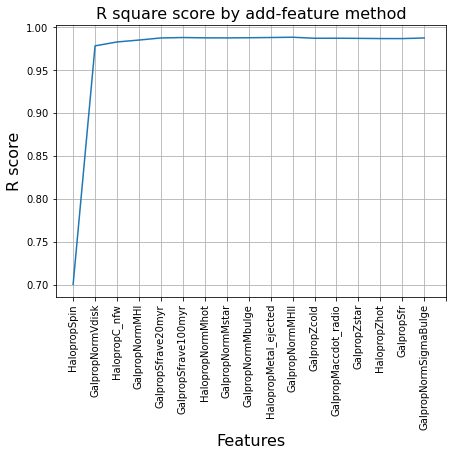

Elapsed time to run RF func on Group 1: 3039.224 seconds
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.978) total time=   2.9s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.966) total time=   1.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.984) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.986) total time=   4.7s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.974, test=0.958) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.981) total time=   2.3s
[CV 2/3] END boots

[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.988) total time=   4.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.959) total time=   2.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.989) total time=   4.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.969) total time=   2.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.986) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.985) total time=   2.8s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.973, test=0.963) total time=   1.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estima

[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.985) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.985) total time=   2.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.987) total time=   2.8s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.971, test=0.960) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.959) total time=   2.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.996, test=0.990) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.986) total time=   4.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estima

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.987) total time=   2.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.968) total time=   1.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.986) total time=   2.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.987) total time=   2.6s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.962) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.972, test=0.966) total time=   2.5s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.989) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estim

[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.984) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.987) total time=   2.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.976, test=0.965) total time=   2.5s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.988) total time=   4.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.967) total time=   1.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.996, test=0.982) total time=   2.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.988) total time=   1.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_est

[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.997, test=0.988) total time=   2.7s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.974, test=0.967) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.982) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.985) total time=   4.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.971, test=0.963) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.975, test=0.965) total time=   2.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.997, test=0.987) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estima

In [10]:
# this code takes ~50min to run when the dataset is Group 1 galaxies with ~8,000 entries
start_time = time.time()

RF_results_1 = functions.target_predicting_RF_function(X=X_1, y=y_1)

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func on Group 1: {elapsed_time:.3f} seconds")

#### The most important features for Group 1 galaxies are:  
     1 HalopropSpin 0.7003232421335875
	 2 GalpropNormVdisk 0.9785048424485359
	 3 HalopropC_nfw 0.9830552712011761
	 4 GalpropNormMHI 0.985278595928723
	 5 GalpropSfrave20myr 0.9877379020879314
	 6 GalpropSfrave100myr 0.9882255429350412
	 7 HalopropNormMhot 0.9878522353573936
	 8 GalpropNormMstar 0.9877892029156845
	 9 GalpropNormMbulge 0.9879750255757774
	 10 HalopropMetal_ejected 0.9882490709785134
	 11 GalpropNormMHII 0.9885799308399967
	 12 GalpropZcold 0.9873707810865723
	 13 GalpropMaccdot_radio 0.9874115535038492
	 14 GalpropZstar 0.9872577323790838
	 15 HalopropZhot 0.987021747017215
	 16 GalpropSfr 0.9869914166277005
	 17 GalpropNormSigmaBulge 0.9876977706329201

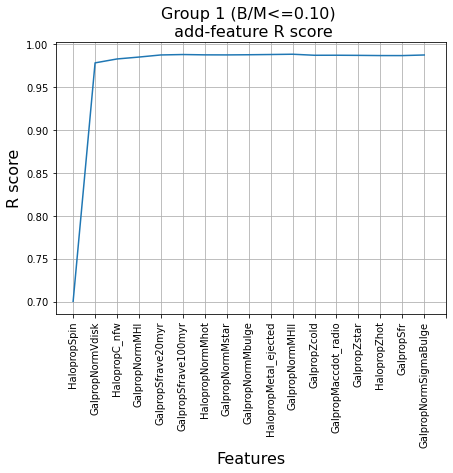

In [12]:
group1_fig_add_feature=RF_results_1[4].plot(x='features', y='r_sq_score', rot=90, figsize=(7,5), use_index=True,
                    legend=False, grid=True, 
                    xticks=range(0,18))
group1_fig_add_feature.set_title(label= 'Group 1 (B/M<=0.10) \n add-feature R score',fontsize=16)
group1_fig_add_feature.set_xlabel('Features',fontsize=16)
group1_fig_add_feature.set_ylabel('R score',fontsize=16)

# group1_fig_add_feature.get_figure().savefig('Group 1 R score by add-feature method.jpg', dpi=500)

plt.show()

In [13]:
# RF_results_1[4].to_csv('Group 1 Max r scores by add column method.csv', index=False)

group1 = pd.read_csv('Group 1 Max r scores by add column method.csv')

group1_fig = RF_results_1[1]
# group1_fig.savefig('Group 1 RF Prediction_vs_True.jpeg', dpi=500)
plt.show()

group1_fig_builtin_imp = RF_results_1[2]
# group1_fig_builtin_imp.savefig('Group 1 Built-in Feature Ranking.jpeg', dpi=500)
plt.show()

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9856 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
RF Accuracy: 0.99 (+/- 0.00)


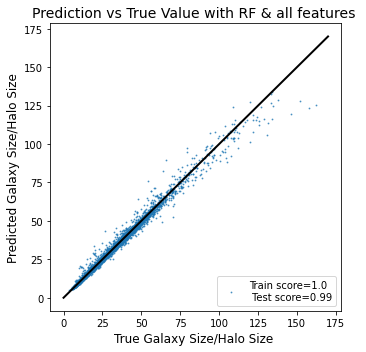

Elapsed time to compute the importances: 0.101 seconds
Elapsed time to compute the importances: 10.547 seconds


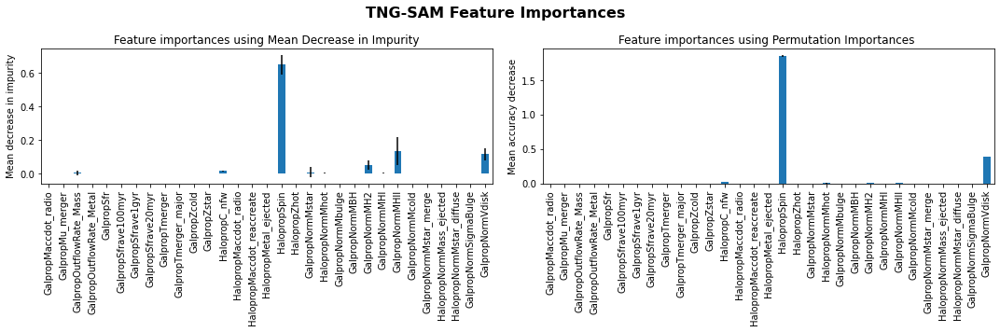

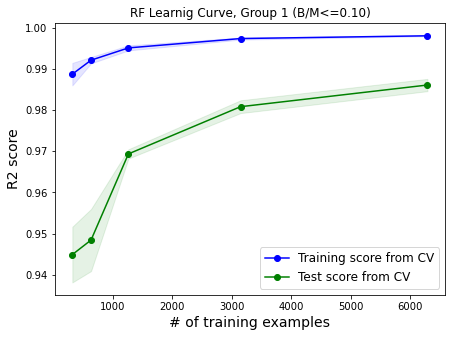

Elapsed time to run RF func and Learning Curves on Group 1 (B/M<=0.10): 196.088 seconds


In [14]:
# this code takes ~3min to run when the dataset is Group 1 galaxies with ~8,000 entries
start_time = time.time()

RF_lc_1 = tp_lc_functions.target_predicting_RF_function(X_1, y_1, 'RF Learnig Curve, Group 1 (B/M<=0.10)')

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func and Learning Curves on Group 1 (B/M<=0.10): {elapsed_time:.3f} seconds")

In [15]:
lc_1 = RF_lc_1[4]

In [17]:
# lc_1.savefig('RF Group 1 Learning Curve.jpeg', dpi=500)

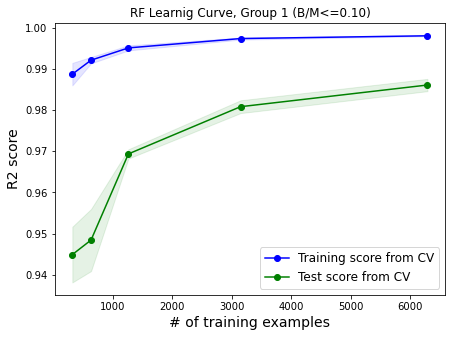

In [16]:
lc_1

--------------------

## <font color='purple'> <a id =2> </a> <br>Group 2 Galaxies: 0.1 < B/Mstar <=0.2

In [18]:
X_2 = df_2.drop(columns=['GalpropNormHalfRadius', 'BulgeMstar_ratio'])


y_2 = df_2.loc[:,'GalpropNormHalfRadius']

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9768 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 4, 'n_estimators': 100}
RF Accuracy: 0.98 (+/- 0.03)


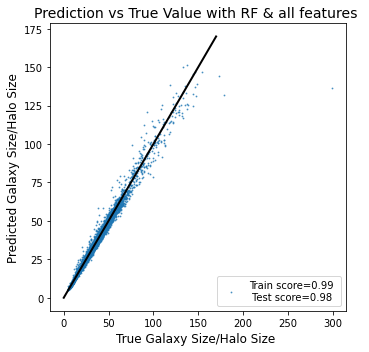

Elapsed time to compute the importances: 0.011 seconds
Elapsed time to compute the importances: 9.822 seconds


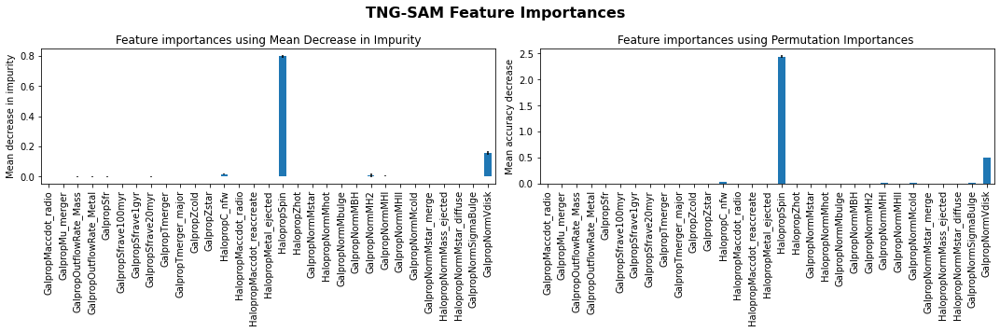

  0%|                                                    | 0/31 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/31 [00:01<00:30,  1.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 2/31 [00:03<00:58,  2.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▎                                       | 3/31 [00:06<01:00,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 4/31 [00:08<01:00,  2.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 5/31 [00:10<00:58,  2.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▌                                   | 6/31 [00:13<00:58,  2.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|█████████▉                                  | 7/31 [00:15<00:55,  2.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▎                                | 8/31 [00:17<00:52,  2.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 9/31 [00:20<00:50,  2.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▊                             | 10/31 [00:21<00:45,  2.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                           | 11/31 [00:24<00:45,  2.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▋                          | 12/31 [00:26<00:44,  2.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████                         | 13/31 [00:29<00:44,  2.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▍                       | 14/31 [00:30<00:33,  1.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 15/31 [00:33<00:35,  2.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 16/31 [00:35<00:34,  2.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▌                   | 17/31 [00:37<00:31,  2.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 18/31 [00:40<00:30,  2.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 19/31 [00:42<00:27,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▋               | 20/31 [00:44<00:24,  2.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 21/31 [00:46<00:22,  2.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▌            | 22/31 [00:47<00:15,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▉           | 23/31 [00:49<00:14,  1.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▎         | 24/31 [00:51<00:13,  1.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 25/31 [00:54<00:12,  2.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 26/31 [00:56<00:10,  2.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 27/31 [00:58<00:08,  2.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▊    | 28/31 [01:00<00:06,  2.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▏  | 29/31 [01:02<00:04,  2.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 30/31 [01:05<00:02,  2.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 31/31 [01:06<00:00,  2.14s/it]


1. iteration: 
	 1 HalopropSpin 0.7203194243666542


  0%|                                                    | 0/30 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/30 [00:03<01:50,  3.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 2/30 [00:07<01:48,  3.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 3/30 [00:11<01:38,  3.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 4/30 [00:15<01:37,  3.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 5/30 [00:19<01:39,  3.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 6/30 [00:23<01:33,  3.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▎                                 | 7/30 [00:27<01:29,  3.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 8/30 [00:31<01:28,  4.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 9/30 [00:35<01:22,  3.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▎                            | 10/30 [00:38<01:13,  3.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▊                           | 11/30 [00:42<01:11,  3.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 12/30 [00:46<01:08,  3.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 13/30 [00:50<01:07,  3.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████                       | 14/30 [00:54<01:03,  4.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 15/30 [00:58<00:58,  3.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▉                    | 16/30 [01:02<00:55,  3.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 17/30 [01:06<00:54,  4.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 18/30 [01:10<00:48,  4.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 19/30 [01:15<00:46,  4.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 20/30 [01:18<00:40,  4.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 21/30 [01:23<00:36,  4.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 22/30 [01:27<00:32,  4.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|████████████████████████████████▉          | 23/30 [01:31<00:29,  4.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 24/30 [01:36<00:25,  4.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 25/30 [01:39<00:20,  4.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 26/30 [01:43<00:15,  3.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 27/30 [01:47<00:12,  4.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 28/30 [01:51<00:07,  3.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 29/30 [01:55<00:03,  3.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 30/30 [01:58<00:00,  3.96s/it]


2. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568


  0%|                                                    | 0/29 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▌                                          | 1/29 [00:05<02:37,  5.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███                                         | 2/29 [00:11<02:32,  5.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▌                                       | 3/29 [00:17<02:28,  5.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 4/29 [00:22<02:23,  5.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▌                                    | 5/29 [00:28<02:19,  5.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████                                   | 6/29 [00:34<02:14,  5.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 7/29 [00:40<02:08,  5.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 8/29 [00:44<01:52,  5.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▋                              | 9/29 [00:50<01:46,  5.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 34%|██████████████▊                            | 10/29 [00:54<01:38,  5.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▎                          | 11/29 [01:00<01:35,  5.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▊                         | 12/29 [01:04<01:25,  5.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▎                       | 13/29 [01:10<01:21,  5.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 14/29 [01:16<01:19,  5.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 15/29 [01:22<01:17,  5.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 16/29 [01:27<01:09,  5.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▏                 | 17/29 [01:32<01:06,  5.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▋                | 18/29 [01:37<00:58,  5.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 66%|████████████████████████████▏              | 19/29 [01:43<00:55,  5.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▋             | 20/29 [01:49<00:50,  5.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████▏           | 21/29 [01:54<00:43,  5.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▌          | 22/29 [01:59<00:36,  5.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 23/29 [02:05<00:32,  5.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 24/29 [02:10<00:26,  5.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████      | 25/29 [02:15<00:21,  5.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▌    | 26/29 [02:20<00:15,  5.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████   | 27/29 [02:26<00:10,  5.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 28/29 [02:32<00:05,  5.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 29/29 [02:37<00:00,  5.44s/it]


3. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618


  0%|                                                    | 0/28 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▌                                          | 1/28 [00:07<03:12,  7.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▏                                        | 2/28 [00:14<03:09,  7.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 3/28 [00:22<03:04,  7.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 4/28 [00:29<02:56,  7.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 5/28 [00:36<02:47,  7.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▍                                  | 6/28 [00:44<02:44,  7.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 7/28 [00:51<02:36,  7.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 8/28 [00:59<02:30,  7.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████▏                             | 9/28 [01:06<02:21,  7.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▎                           | 10/28 [01:13<02:08,  7.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▉                          | 11/28 [01:20<02:01,  7.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▍                        | 12/28 [01:27<01:54,  7.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▉                       | 13/28 [01:34<01:46,  7.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 14/28 [01:41<01:39,  7.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████                    | 15/28 [01:48<01:32,  7.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 16/28 [01:55<01:25,  7.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████                 | 17/28 [02:02<01:15,  6.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▋               | 18/28 [02:09<01:09,  6.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 19/28 [02:15<01:00,  6.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 20/28 [02:22<00:55,  6.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 21/28 [02:29<00:48,  6.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▊         | 22/28 [02:36<00:41,  6.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▎       | 23/28 [02:42<00:33,  6.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 24/28 [02:49<00:26,  6.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 25/28 [02:56<00:20,  6.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▉   | 26/28 [03:03<00:13,  6.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 27/28 [03:10<00:07,  7.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 28/28 [03:18<00:00,  7.10s/it]


4. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179


  0%|                                                    | 0/27 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/27 [00:09<04:01,  9.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▎                                        | 2/27 [00:17<03:31,  8.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 3/27 [00:26<03:33,  8.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 4/27 [00:36<03:30,  9.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▏                                   | 5/27 [00:45<03:25,  9.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 6/27 [00:55<03:16,  9.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 7/27 [01:03<02:58,  8.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████                               | 8/27 [01:12<02:53,  9.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 9/27 [01:20<02:36,  8.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▉                           | 10/27 [01:29<02:27,  8.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▌                         | 11/27 [01:38<02:22,  8.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████                        | 12/27 [01:48<02:16,  9.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 13/27 [01:57<02:08,  9.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 14/27 [02:04<01:49,  8.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 15/27 [02:12<01:39,  8.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 16/27 [02:22<01:36,  8.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████                | 17/27 [02:30<01:25,  8.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 18/27 [02:39<01:19,  8.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████▎            | 19/27 [02:49<01:12,  9.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 20/27 [02:56<00:58,  8.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 21/27 [03:05<00:52,  8.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|███████████████████████████████████        | 22/27 [03:14<00:44,  8.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▋      | 23/27 [03:24<00:36,  9.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 24/27 [03:33<00:27,  9.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▊   | 25/27 [03:43<00:18,  9.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 26/27 [03:52<00:09,  9.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 27/27 [04:00<00:00,  8.92s/it]


5. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219


  0%|                                                    | 0/26 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/26 [00:07<03:18,  7.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▍                                        | 2/26 [00:17<03:29,  8.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████                                       | 3/26 [00:26<03:26,  8.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▊                                     | 4/26 [00:37<03:36,  9.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 5/26 [00:48<03:36, 10.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▏                                 | 6/26 [01:00<03:32, 10.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▊                                | 7/26 [01:11<03:25, 10.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▌                              | 8/26 [01:20<03:05, 10.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▏                            | 9/26 [01:31<02:59, 10.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                          | 10/26 [01:41<02:48, 10.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▏                        | 11/26 [01:51<02:31, 10.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▊                       | 12/26 [02:02<02:26, 10.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 13/26 [02:13<02:18, 10.63s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████▏                   | 14/26 [02:24<02:09, 10.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.021, test=0.000) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.033, test=-0.009) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.027, test=-0.010) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.021, test=-0.006) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.099, test=-0.015) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.271, test=0.195) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.362, test=0.148) total time=   0.3s
[CV 3/3] END

 58%|████████████████████████▊                  | 15/26 [02:35<01:59, 10.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.018, test=0.001) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.017, test=0.003) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.036, test=-0.014) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.020, test=-0.010) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.026, test=-0.002) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.464, test=-0.262) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.474, test=-0.258) total time=   0.7s
[CV 2/3

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.017, test=0.002) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.027, test=-0.010) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.034, test=-0.017) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.035, test=-0.013) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.026, test=-0.001) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.084, test=-0.021) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.478, test=-0.254) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n

 62%|██████████████████████████▍                | 16/26 [02:46<01:49, 10.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 17/26 [02:58<01:39, 11.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.029, test=-0.004) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.033, test=-0.008) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.029, test=-0.014) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.026, test=-0.002) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.068, test=-0.027) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.096, test=-0.015) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.475, test=-0.251) total time=   0.7s
[CV 

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.046, test=0.061) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.064, test=0.041) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.224, test=0.192) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.303, test=0.144) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.462, test=-0.004) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.442, test=0.056) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.227, test=0.195) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estim

 69%|█████████████████████████████▊             | 18/26 [03:09<01:28, 11.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.020, test=0.001) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.031, test=-0.011) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.028, test=-0.012) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.031, test=-0.004) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.024, test=-0.003) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.100, test=-0.018) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.096, test=-0.013) total time=   0.7s
[CV 1/3] E

 73%|███████████████████████████████▍           | 19/26 [03:20<01:17, 11.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████          | 20/26 [03:31<01:06, 11.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.022, test=-0.002) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.031, test=-0.004) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.029, test=-0.014) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.032, test=-0.006) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.020, test=-0.007) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.076, test=-0.022) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.464, test=-0.270) total time=   0.3s
[CV 2

[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.986, test=0.978) total time=   2.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.957, test=0.955) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.990, test=0.955) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.986, test=0.981) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.991, test=0.978) total time=   1.5s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.960, test=0.945) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.985, test=0.977) total time=   1.9s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimator

[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.523, test=-0.200) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.091, test=0.054) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.175, test=0.040) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.518, test=-0.220) total time=   1.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.737, test=0.719) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.773, test=0.712) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.775, test=0.706) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_est

 81%|██████████████████████████████████▋        | 21/26 [03:42<00:55, 11.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.022, test=-0.001) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.031, test=-0.007) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.029, test=-0.013) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.024, test=-0.002) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.471, test=-0.270) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.486, test=-0.251) total time=   1.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.261, test=0.212) total time=   0.5s
[

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.767, test=0.752) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.802, test=0.734) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.803, test=0.754) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.868, test=0.718) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.735, test=0.731) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.744, test=0.715) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.894, test=0.687) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimat

 85%|████████████████████████████████████▍      | 22/26 [03:53<00:44, 11.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|██████████████████████████████████████     | 23/26 [04:04<00:33, 11.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▋   | 24/26 [04:16<00:22, 11.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 25/26 [04:27<00:11, 11.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 26/26 [04:38<00:00, 10.71s/it]


6. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331


  0%|                                                    | 0/25 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/25 [00:12<05:03, 12.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▌                                        | 2/25 [00:25<04:54, 12.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▎                                      | 3/25 [00:38<04:42, 12.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 4/25 [00:49<04:11, 11.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 5/25 [01:01<04:05, 12.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 6/25 [01:14<03:57, 12.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▎                               | 7/25 [01:27<03:47, 12.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 8/25 [01:40<03:36, 12.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▊                            | 9/25 [01:51<03:12, 12.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 10/25 [02:03<03:01, 12.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|██████████████████▉                        | 11/25 [02:16<02:52, 12.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 12/25 [02:28<02:41, 12.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 13/25 [02:41<02:29, 12.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████                   | 14/25 [02:54<02:18, 12.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 15/25 [03:07<02:06, 12.68s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▌               | 16/25 [03:20<01:54, 12.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 17/25 [03:30<01:36, 12.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|██████████████████████████████▉            | 18/25 [03:43<01:26, 12.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▋          | 19/25 [03:56<01:14, 12.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 20/25 [04:07<00:59, 11.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 21/25 [04:19<00:48, 12.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▊     | 22/25 [04:32<00:37, 12.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▌   | 23/25 [04:45<00:25, 12.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 24/25 [04:58<00:12, 12.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 25/25 [05:09<00:00, 12.37s/it]


7. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197


  0%|                                                    | 0/24 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/24 [00:14<05:28, 14.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▋                                        | 2/24 [00:28<05:17, 14.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 3/24 [00:43<05:03, 14.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 4/24 [00:57<04:49, 14.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▏                                  | 5/24 [01:12<04:35, 14.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 6/24 [01:26<04:21, 14.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 7/24 [01:41<04:06, 14.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 8/24 [01:55<03:52, 14.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 9/24 [02:10<03:37, 14.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|█████████████████▉                         | 10/24 [02:24<03:20, 14.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▋                       | 11/24 [02:39<03:08, 14.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 12/24 [02:54<02:55, 14.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████▎                   | 13/24 [03:09<02:41, 14.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|█████████████████████████                  | 14/24 [03:24<02:28, 14.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 15/24 [03:36<02:07, 14.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 16/24 [03:52<01:56, 14.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▍            | 17/24 [04:07<01:43, 14.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 18/24 [04:22<01:28, 14.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 19/24 [04:33<01:08, 13.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 20/24 [04:46<00:54, 13.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 21/24 [05:02<00:42, 14.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▍   | 22/24 [05:14<00:27, 13.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 23/24 [05:30<00:14, 14.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 24/24 [05:45<00:00, 14.41s/it]


8. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847


  0%|                                                    | 0/23 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▉                                          | 1/23 [00:16<06:09, 16.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|███▊                                        | 2/23 [00:33<05:57, 17.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 3/23 [00:51<05:41, 17.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▋                                    | 4/23 [01:08<05:25, 17.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▌                                  | 5/23 [01:20<04:39, 15.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 6/23 [01:38<04:36, 16.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▍                              | 7/23 [01:55<04:25, 16.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                            | 8/23 [02:13<04:11, 16.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████▏                          | 9/23 [02:30<03:55, 16.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 10/23 [02:46<03:37, 16.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▌                      | 11/23 [03:03<03:21, 16.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▍                    | 12/23 [03:20<03:05, 16.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 13/23 [03:37<02:49, 16.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▏                | 14/23 [03:54<02:33, 17.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 15/23 [04:09<02:09, 16.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|█████████████████████████████▉             | 16/23 [04:26<01:56, 16.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 17/23 [04:43<01:40, 16.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▋         | 18/23 [05:01<01:24, 16.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 19/23 [05:18<01:08, 17.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 20/23 [05:35<00:51, 17.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████▎   | 21/23 [05:53<00:34, 17.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 22/23 [06:10<00:17, 17.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 23/23 [06:28<00:00, 16.88s/it]


9. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745


  0%|                                                    | 0/22 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/22 [00:18<06:24, 18.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|████                                        | 2/22 [00:36<06:09, 18.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 3/22 [00:55<05:51, 18.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|████████                                    | 4/22 [01:14<05:34, 18.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████                                  | 5/22 [01:29<04:57, 17.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|████████████                                | 6/22 [01:48<04:47, 18.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 7/22 [02:07<04:32, 18.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|████████████████                            | 8/22 [02:25<04:16, 18.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 9/22 [02:44<03:58, 18.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▌                       | 10/22 [02:59<03:28, 17.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 11/22 [03:18<03:16, 17.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▍                   | 12/22 [03:36<03:00, 18.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 13/22 [03:55<02:43, 18.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▎               | 14/22 [04:13<02:26, 18.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▎             | 15/22 [04:32<02:08, 18.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▎           | 16/22 [04:50<01:50, 18.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▏         | 17/22 [05:09<01:32, 18.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▏       | 18/22 [05:27<01:13, 18.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████▏     | 19/22 [05:46<00:55, 18.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████    | 20/22 [06:05<00:37, 18.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|█████████████████████████████████████████  | 21/22 [06:24<00:18, 18.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 22/22 [06:42<00:00, 18.32s/it]


10. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077


  0%|                                                    | 0/21 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/21 [00:20<06:41, 20.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▏                                       | 2/21 [00:40<06:24, 20.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 3/21 [01:00<06:04, 20.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 4/21 [01:20<05:43, 20.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▍                                 | 5/21 [01:41<05:24, 20.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 6/21 [02:01<05:03, 20.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 7/21 [02:21<04:43, 20.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▊                           | 8/21 [02:36<04:00, 18.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▊                         | 9/21 [02:57<03:50, 19.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▍                      | 10/21 [03:17<03:33, 19.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▌                    | 11/21 [03:37<03:16, 19.63s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 12/21 [03:57<02:57, 19.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▌                | 13/21 [04:17<02:38, 19.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 14/21 [04:37<02:19, 19.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 15/21 [04:57<01:59, 19.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▊          | 16/21 [05:17<01:40, 20.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▊        | 17/21 [05:37<01:20, 20.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 18/21 [05:58<01:00, 20.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▉    | 19/21 [06:13<00:37, 18.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▉  | 20/21 [06:34<00:19, 19.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 21/21 [06:54<00:00, 19.74s/it]


11. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077
	 11 GalpropNormMstar 0.9787099638889933


  0%|                                                    | 0/20 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██▏                                         | 1/20 [00:21<06:52, 21.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 2/20 [00:43<06:34, 21.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 3/20 [01:06<06:15, 22.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 4/20 [01:27<05:52, 22.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 5/20 [01:49<05:30, 22.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 6/20 [02:12<05:08, 22.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▍                            | 7/20 [02:34<04:46, 22.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 8/20 [02:56<04:24, 22.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▊                        | 9/20 [03:14<03:50, 20.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 10/20 [03:37<03:33, 21.38s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 11/20 [03:59<03:14, 21.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 12/20 [04:21<02:54, 21.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▉               | 13/20 [04:40<02:25, 20.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 14/20 [05:02<02:08, 21.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 15/20 [05:25<01:48, 21.68s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.960, test=0.957) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.991, test=0.961) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.981) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.990, test=0.979) total time=   2.8s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.961, test=0.952) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.959) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.979) total time=   2.6s
[CV 1/3] END

 80%|██████████████████████████████████▍        | 16/20 [05:47<01:27, 21.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▌      | 17/20 [06:10<01:06, 22.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 18/20 [06:32<00:44, 22.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▊  | 19/20 [06:54<00:22, 22.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.990, test=0.979) total time=   1.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.959, test=0.956) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.987, test=0.978) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.995, test=0.959) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.991, test=0.980) total time=   2.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.957, test=0.956) total time=   0.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.991, test=0.962) total time=   1.3s
[CV 1/3] EN

[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.965, test=0.939) total time=   1.6s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.989, test=0.986) total time=   2.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.989, test=0.982) total time=   1.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.964) total time=   6.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.961, test=0.956) total time=   3.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.964) total time=   6.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.961, test=0.943) total time=   3.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estima

100%|███████████████████████████████████████████| 20/20 [07:17<00:00, 21.87s/it]


12. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077
	 11 GalpropNormMstar 0.9787099638889933
	 12 GalpropTmerger 0.9791533190404017


  0%|                                                    | 0/19 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.986, test=0.985) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.956) total time=   3.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.967, test=0.933) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.989, test=0.979) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.984) total time=   3.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.960, test=0.947) total time=   1.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.961) total time=   3.0s
[CV 2/3] END b

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.960) total time=   2.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.964, test=0.939) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.979) total time=   2.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.996, test=0.963) total time=   2.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.960, test=0.947) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.988, test=0.985) total time=   1.5s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.992, test=0.985) total time=   2.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estim

  5%|██▎                                         | 1/19 [00:24<07:14, 24.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 2/19 [00:48<06:53, 24.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.965, test=0.928) total time=   1.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.988, test=0.984) total time=   3.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.961, test=0.961) total time=   1.8s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.989, test=0.979) total time=   3.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.962, test=0.962) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.964, test=0.935) total time=   1.9s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.984) total time=   0.8s
[CV 1/3] END 

 16%|██████▉                                     | 3/19 [01:13<06:30, 24.38s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▎                                  | 4/19 [01:37<06:05, 24.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.992, test=0.985) total time=   3.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.962, test=0.964) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.954) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.984) total time=   3.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.992, test=0.985) total time=   3.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.962, test=0.951) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.987, test=0.984) total time=   1.5s
[CV 3/3] EN

 26%|███████████▌                                | 5/19 [02:01<05:40, 24.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▉                              | 6/19 [02:25<05:16, 24.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.989, test=0.984) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.997, test=0.958) total time=   3.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.962, test=0.961) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.988, test=0.973) total time=   1.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.991, test=0.974) total time=   2.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.964, test=0.937) total time=   1.8s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.984) total time=   0.8s
[CV 3/3]

 37%|████████████████▏                           | 7/19 [02:50<04:51, 24.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▌                         | 8/19 [03:14<04:27, 24.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▊                       | 9/19 [03:38<04:02, 24.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▋                    | 10/19 [04:03<03:39, 24.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 11/19 [04:27<03:15, 24.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 12/19 [04:52<02:51, 24.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▍             | 13/19 [05:17<02:26, 24.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▋           | 14/19 [05:41<02:02, 24.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▉         | 15/19 [06:06<01:38, 24.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████▏      | 16/19 [06:30<01:13, 24.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 17/19 [06:55<00:49, 24.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▋  | 18/19 [07:20<00:24, 24.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 19/19 [07:44<00:00, 24.46s/it]


13. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077
	 11 GalpropNormMstar 0.9787099638889933
	 12 GalpropTmerger 0.9791533190404017
	 13 HalopropNormMass_ejected 0.9793534347530888


  0%|                                                    | 0/18 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▍                                         | 1/18 [00:26<07:25, 26.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 2/18 [00:52<07:04, 26.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 3/18 [01:19<06:37, 26.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 4/18 [01:41<05:47, 24.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 5/18 [02:08<05:32, 25.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 6/18 [02:35<05:11, 26.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████                           | 7/18 [03:02<04:48, 26.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▌                        | 8/18 [03:29<04:25, 26.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 9/18 [03:56<04:00, 26.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 10/18 [04:23<03:34, 26.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 11/18 [04:46<02:58, 25.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 12/18 [05:13<02:36, 26.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████            | 13/18 [05:33<02:01, 24.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 14/18 [06:01<01:41, 25.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 15/18 [06:28<01:17, 25.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 16/18 [06:51<00:50, 25.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▌  | 17/18 [07:18<00:25, 25.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 18/18 [07:46<00:00, 25.92s/it]


14. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077
	 11 GalpropNormMstar 0.9787099638889933
	 12 GalpropTmerger 0.9791533190404017
	 13 HalopropNormMass_ejected 0.9793534347530888
	 14 GalpropMu_merger 0.9796679239540257


  0%|                                                    | 0/17 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▌                                         | 1/17 [00:29<07:53, 29.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▏                                      | 2/17 [00:58<07:18, 29.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 3/17 [01:27<06:47, 29.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▎                                 | 4/17 [01:56<06:17, 29.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▉                               | 5/17 [02:25<05:47, 28.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▌                            | 6/17 [02:54<05:18, 28.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 7/17 [03:23<04:49, 29.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▋                       | 8/17 [03:52<04:19, 28.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▎                    | 9/17 [04:21<03:51, 28.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▎                 | 10/17 [04:49<03:22, 28.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▊               | 11/17 [05:18<02:53, 28.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▎            | 12/17 [05:43<02:17, 27.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▉          | 13/17 [06:12<01:52, 28.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▍       | 14/17 [06:41<01:25, 28.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▉     | 15/17 [07:03<00:52, 26.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▍  | 16/17 [07:33<00:27, 27.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 17/17 [08:01<00:00, 28.35s/it]


15. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077
	 11 GalpropNormMstar 0.9787099638889933
	 12 GalpropTmerger 0.9791533190404017
	 13 HalopropNormMass_ejected 0.9793534347530888
	 14 GalpropMu_merger 0.9796679239540257
	 15 GalpropNormMHI 0.9789185205943657


  0%|                                                    | 0/16 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 1/16 [00:30<07:40, 30.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 2/16 [01:01<07:12, 30.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▎                                   | 3/16 [01:32<06:40, 30.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 4/16 [02:03<06:09, 30.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▊                              | 5/16 [02:34<05:38, 30.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 6/16 [03:00<04:53, 29.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▎                        | 7/16 [03:32<04:31, 30.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 8/16 [04:03<04:03, 30.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████▊                   | 9/16 [04:34<03:34, 30.68s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 10/16 [05:06<03:05, 30.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▌             | 11/16 [05:37<02:35, 31.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 12/16 [06:08<02:04, 31.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▉        | 13/16 [06:39<01:33, 31.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 14/16 [07:11<01:02, 31.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▎  | 15/16 [07:42<00:31, 31.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 16/16 [08:08<00:00, 30.54s/it]


16. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077
	 11 GalpropNormMstar 0.9787099638889933
	 12 GalpropTmerger 0.9791533190404017
	 13 HalopropNormMass_ejected 0.9793534347530888
	 14 GalpropMu_merger 0.9796679239540257
	 15 GalpropNormMHI 0.9789185205943657
	 16 GalpropNormMHII 0.9783069265352656


  0%|                                                    | 0/15 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 1/15 [00:33<07:46, 33.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 2/15 [01:06<07:11, 33.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 3/15 [01:39<06:39, 33.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 4/15 [02:13<06:05, 33.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 5/15 [02:46<05:32, 33.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 6/15 [03:19<04:58, 33.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▌                       | 7/15 [03:52<04:26, 33.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▍                    | 8/15 [04:25<03:52, 33.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|██████████████████████████▍                 | 9/15 [04:58<03:19, 33.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 10/15 [05:31<02:45, 33.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 11/15 [06:05<02:12, 33.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 12/15 [06:30<01:32, 30.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 13/15 [07:04<01:03, 31.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 14/15 [07:37<00:32, 32.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 15/15 [08:10<00:00, 32.71s/it]

17. iteration: 
	 1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077
	 11 GalpropNormMstar 0.9787099638889933
	 12 GalpropTmerger 0.9791533190404017
	 13 HalopropNormMass_ejected 0.9793534347530888
	 14 GalpropMu_merger 0.9796679239540257
	 15 GalpropNormMHI 0.9789185205943657
	 16 GalpropNormMHII 0.9783069265352656
	 17 HalopropNormMhot 0.9797920795024747


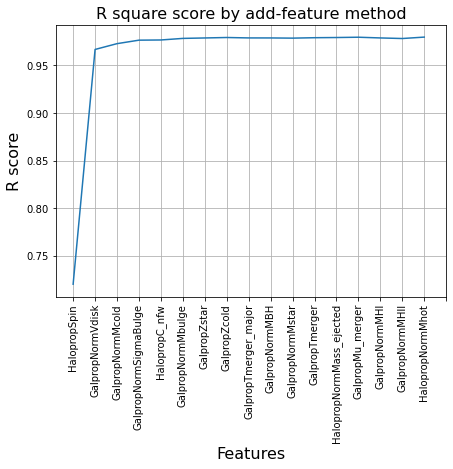

Elapsed time to run RF func on Group 2: 6081.748 seconds


In [19]:
# this code takes ~ 2 hrs to run when the dataset is Group 2 galaxies with ~13,000 entries
start_time = time.time()

RF_results_2 = functions.target_predicting_RF_function(X=X_2, y=y_2)

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func on Group 2: {elapsed_time:.3f} seconds")

#### The most important features for Group 2 galaxies are:  

     1 HalopropSpin 0.7203194243666542
	 2 GalpropNormVdisk 0.9668290610703568
	 3 GalpropNormMcold 0.9729153777669618
	 4 GalpropNormSigmaBulge 0.9765792026155179
	 5 HalopropC_nfw 0.9767776605364219
	 6 GalpropNormMbulge 0.9784292092316331
	 7 GalpropZstar 0.978892244506197
	 8 GalpropZcold 0.9793739691720847
	 9 GalpropTmerger_major 0.9789329217683745
	 10 GalpropNormMBH 0.9789102496741077
	 11 GalpropNormMstar 0.9787099638889933
	 12 GalpropTmerger 0.9791533190404017
	 13 HalopropNormMass_ejected 0.9793534347530888
	 14 GalpropMu_merger 0.9796679239540257
	 15 GalpropNormMHI 0.9789185205943657
	 16 GalpropNormMHII 0.9783069265352656
	 17 HalopropNormMhot 0.9797920795024747

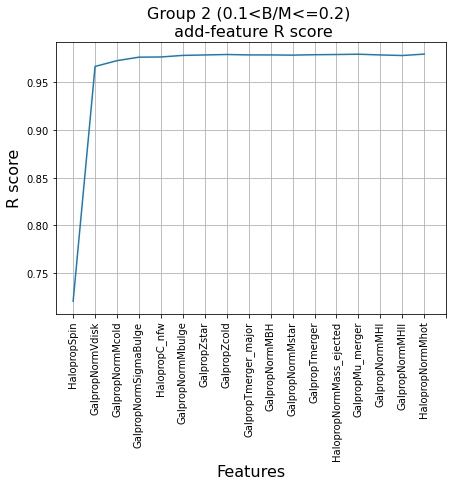

In [21]:
group2_fig_add_feature=RF_results_2[4].plot(x='features', y='r_sq_score', rot=90, figsize=(7,5), use_index=True,
                    legend=False, grid=True, 
                    xticks=range(0,18))
group2_fig_add_feature.set_title(label= 'Group 2 (0.1<B/M<=0.2) \n add-feature R score',fontsize=16)
group2_fig_add_feature.set_xlabel('Features',fontsize=16)
group2_fig_add_feature.set_ylabel('R score',fontsize=16)

# group2_fig_add_feature.get_figure().savefig('Group 2 R score by add-feature method.jpg', dpi=500)

plt.show()

In [22]:
# RF_results_2[4].to_csv('Group 2 Max r scores by add column method.csv', index=False)

group1 = pd.read_csv('Group 2 Max r scores by add column method.csv')

group2_fig = RF_results_2[1]
# group2_fig.savefig('Group 2 RF Prediction_vs_True.jpeg', dpi=500)
plt.show()

group2_fig_builtin_imp = RF_results_2[2]
# group2_fig_builtin_imp.savefig('Group 2 Built-in Feature Ranking.jpeg', dpi=500)
plt.show()

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9771 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
RF Accuracy: 0.98 (+/- 0.03)


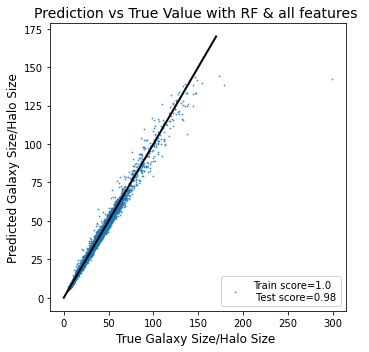

Elapsed time to compute the importances: 0.140 seconds
Elapsed time to compute the importances: 18.426 seconds


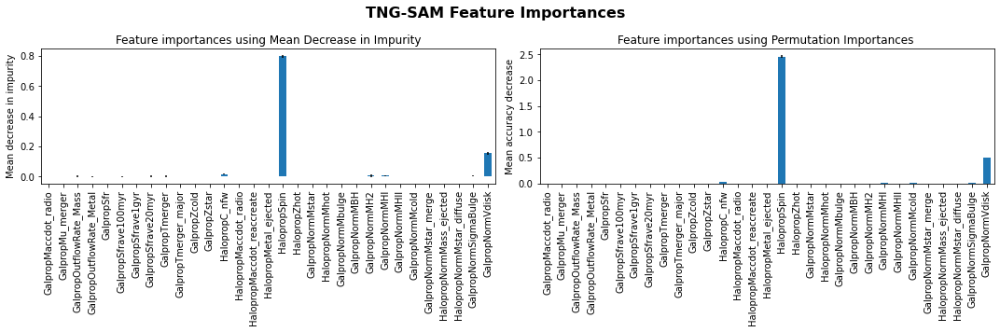

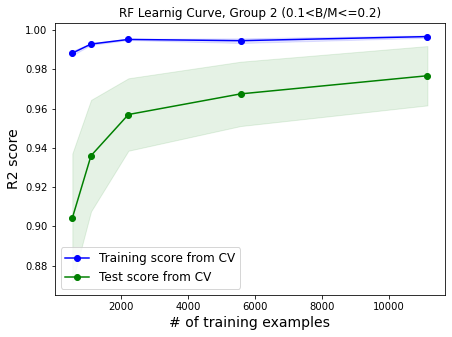

Elapsed time to run RF func and Learning Curves on Group 2 (0.1<B/M<=0.2): 396.742 seconds


In [19]:
# this code takes ~50min to run when the dataset is Group 1 galaxies with ~8,000 entries
start_time = time.time()

RF_lc_2 = tp_lc_functions.target_predicting_RF_function(X_2, y_2, 'RF Learnig Curve, Group 2 (0.1<B/M<=0.2)')

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func and Learning Curves on Group 2 (0.1<B/M<=0.2): {elapsed_time:.3f} seconds")

In [20]:
lc_2 = RF_lc_2[4]

# lc_2.savefig('RF Group 2 Learning Curve.jpeg', dpi=500)

## <font color='purple'> <a id =3> </a> <br>Group 3 Galaxies: 0.2< B/Mstar <=0.3

In [21]:
X_3 = df_3.drop(columns=['GalpropNormHalfRadius', 'BulgeMstar_ratio'])


y_3 = df_3.loc[:,'GalpropNormHalfRadius']

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9650 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 100}
RF Accuracy: 0.96 (+/- 0.01)


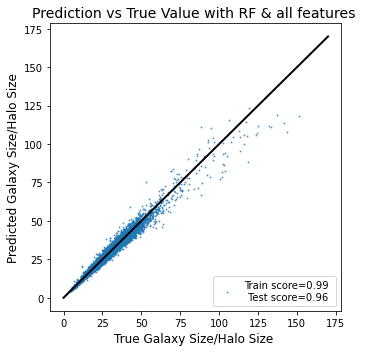

Elapsed time to compute the importances: 0.074 seconds
Elapsed time to compute the importances: 5.773 seconds


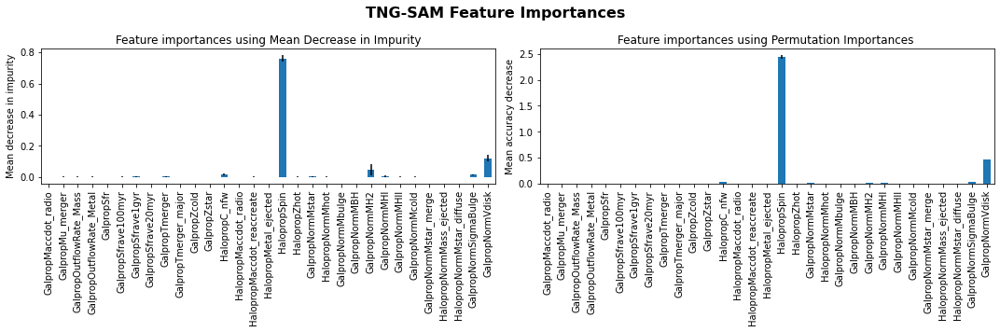

  0%|                                                    | 0/31 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/31 [00:00<00:24,  1.21it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 2/31 [00:02<00:32,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▎                                       | 3/31 [00:03<00:32,  1.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 4/31 [00:04<00:32,  1.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 5/31 [00:06<00:32,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▌                                   | 6/31 [00:07<00:31,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|█████████▉                                  | 7/31 [00:08<00:29,  1.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▎                                | 8/31 [00:09<00:29,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 9/31 [00:10<00:26,  1.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▊                             | 10/31 [00:11<00:23,  1.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                           | 11/31 [00:13<00:22,  1.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▋                          | 12/31 [00:14<00:22,  1.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████                         | 13/31 [00:15<00:21,  1.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▍                       | 14/31 [00:16<00:17,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 15/31 [00:17<00:17,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 16/31 [00:18<00:16,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▌                   | 17/31 [00:19<00:14,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 18/31 [00:20<00:13,  1.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 19/31 [00:21<00:13,  1.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▋               | 20/31 [00:22<00:11,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 21/31 [00:23<00:11,  1.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▌            | 22/31 [00:24<00:08,  1.09it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▉           | 23/31 [00:25<00:07,  1.05it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▎         | 24/31 [00:26<00:06,  1.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 25/31 [00:27<00:05,  1.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 26/31 [00:28<00:05,  1.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 27/31 [00:29<00:04,  1.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▊    | 28/31 [00:30<00:03,  1.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▏  | 29/31 [00:31<00:02,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 30/31 [00:33<00:01,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 31/31 [00:33<00:00,  1.09s/it]


1. iteration: 
	 1 HalopropSpin 0.7159659044826053


  0%|                                                    | 0/30 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/30 [00:01<00:45,  1.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 2/30 [00:03<00:48,  1.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 3/30 [00:05<00:47,  1.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 4/30 [00:07<00:46,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 5/30 [00:08<00:44,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 6/30 [00:10<00:41,  1.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▎                                 | 7/30 [00:12<00:40,  1.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 8/30 [00:14<00:39,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 9/30 [00:15<00:37,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▎                            | 10/30 [00:17<00:34,  1.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▊                           | 11/30 [00:19<00:34,  1.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 12/30 [00:21<00:33,  1.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 13/30 [00:23<00:30,  1.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████                       | 14/30 [00:25<00:29,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 15/30 [00:27<00:28,  1.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▉                    | 16/30 [00:28<00:26,  1.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 17/30 [00:30<00:24,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 18/30 [00:32<00:22,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 19/30 [00:34<00:21,  1.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 20/30 [00:36<00:19,  1.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 21/30 [00:38<00:16,  1.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 22/30 [00:40<00:14,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|████████████████████████████████▉          | 23/30 [00:41<00:12,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 24/30 [00:43<00:11,  1.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 25/30 [00:45<00:09,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 26/30 [00:47<00:07,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 27/30 [00:49<00:05,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 28/30 [00:51<00:03,  1.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 29/30 [00:53<00:01,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 30/30 [00:55<00:00,  1.84s/it]


2. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485


  0%|                                                    | 0/29 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▌                                          | 1/29 [00:02<01:13,  2.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███                                         | 2/29 [00:05<01:13,  2.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▌                                       | 3/29 [00:08<01:13,  2.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 4/29 [00:10<01:03,  2.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▌                                    | 5/29 [00:12<00:57,  2.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████                                   | 6/29 [00:15<00:56,  2.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 7/29 [00:17<00:55,  2.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 8/29 [00:20<00:53,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▋                              | 9/29 [00:22<00:50,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 34%|██████████████▊                            | 10/29 [00:25<00:48,  2.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▎                          | 11/29 [00:28<00:50,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▊                         | 12/29 [00:31<00:47,  2.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▎                       | 13/29 [00:34<00:43,  2.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 14/29 [00:36<00:40,  2.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 15/29 [00:38<00:34,  2.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 16/29 [00:41<00:31,  2.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▏                 | 17/29 [00:43<00:30,  2.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▋                | 18/29 [00:46<00:28,  2.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 66%|████████████████████████████▏              | 19/29 [00:49<00:26,  2.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▋             | 20/29 [00:52<00:24,  2.68s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████▏           | 21/29 [00:54<00:21,  2.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▌          | 22/29 [00:57<00:18,  2.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 23/29 [00:59<00:15,  2.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 24/29 [01:02<00:13,  2.63s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████      | 25/29 [01:05<00:10,  2.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▌    | 26/29 [01:08<00:08,  2.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████   | 27/29 [01:10<00:05,  2.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 28/29 [01:13<00:02,  2.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 29/29 [01:15<00:00,  2.62s/it]


3. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647


  0%|                                                    | 0/28 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▌                                          | 1/28 [00:03<01:24,  3.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▏                                        | 2/28 [00:06<01:22,  3.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 3/28 [00:09<01:20,  3.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 4/28 [00:12<01:17,  3.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 5/28 [00:15<01:10,  3.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▍                                  | 6/28 [00:18<01:08,  3.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 7/28 [00:21<01:05,  3.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 8/28 [00:25<01:03,  3.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████▏                             | 9/28 [00:28<01:00,  3.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▎                           | 10/28 [00:31<00:55,  3.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▉                          | 11/28 [00:34<00:53,  3.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▍                        | 12/28 [00:37<00:50,  3.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▉                       | 13/28 [00:41<00:47,  3.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 14/28 [00:43<00:42,  3.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████                    | 15/28 [00:46<00:40,  3.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 16/28 [00:50<00:37,  3.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████                 | 17/28 [00:53<00:35,  3.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▋               | 18/28 [00:56<00:32,  3.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 19/28 [00:59<00:28,  3.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 20/28 [01:02<00:24,  3.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 21/28 [01:05<00:21,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▊         | 22/28 [01:08<00:18,  3.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▎       | 23/28 [01:12<00:16,  3.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 24/28 [01:15<00:12,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 25/28 [01:18<00:09,  3.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▉   | 26/28 [01:20<00:05,  3.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 27/28 [01:24<00:03,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 28/28 [01:27<00:00,  3.12s/it]


4. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139


  0%|                                                    | 0/27 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/27 [00:03<01:38,  3.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▎                                        | 2/27 [00:07<01:36,  3.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 3/27 [00:11<01:35,  3.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 4/27 [00:15<01:32,  4.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▏                                   | 5/27 [00:19<01:28,  4.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 6/27 [00:24<01:25,  4.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 7/27 [00:28<01:21,  4.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████                               | 8/27 [00:32<01:17,  4.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 9/27 [00:36<01:13,  4.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▉                           | 10/27 [00:39<01:07,  3.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▌                         | 11/27 [00:44<01:03,  3.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████                        | 12/27 [00:48<01:00,  4.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 13/27 [00:52<00:56,  4.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 14/27 [00:56<00:51,  3.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 15/27 [01:00<00:48,  4.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 16/27 [01:04<00:44,  4.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████                | 17/27 [01:08<00:40,  4.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 18/27 [01:12<00:36,  4.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████▎            | 19/27 [01:16<00:32,  4.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 20/27 [01:20<00:27,  3.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 21/27 [01:23<00:22,  3.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|███████████████████████████████████        | 22/27 [01:27<00:19,  3.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▋      | 23/27 [01:32<00:16,  4.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 24/27 [01:36<00:12,  4.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▊   | 25/27 [01:40<00:08,  4.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 26/27 [01:44<00:04,  4.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 27/27 [01:48<00:00,  4.03s/it]


5. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105


  0%|                                                    | 0/26 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/26 [00:04<02:04,  4.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▍                                        | 2/26 [00:11<02:23,  5.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████                                       | 3/26 [00:16<02:07,  5.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▊                                     | 4/26 [00:21<01:57,  5.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 5/26 [00:26<01:49,  5.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▏                                 | 6/26 [00:31<01:42,  5.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▊                                | 7/26 [00:36<01:36,  5.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▌                              | 8/26 [00:41<01:31,  5.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▏                            | 9/26 [00:46<01:26,  5.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                          | 10/26 [00:51<01:19,  5.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▏                        | 11/26 [00:56<01:14,  4.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.040, test=-0.016) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.063, test=-0.032) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.068, test=-0.077) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.066, test=-0.042) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.034, test=-0.002) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.044, test=-0.005) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.474, test=-0.262) total time=   0.1s
[CV 

 46%|███████████████████▊                       | 12/26 [01:01<01:09,  4.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 13/26 [01:06<01:05,  5.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.051, test=-0.048) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.063, test=-0.034) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.032, test=-0.004) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.133, test=-0.014) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.159, test=-0.037) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.480, test=-0.193) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.210, test=0.132) total time=   0.1s
[CV 2/3] E

 54%|███████████████████████▏                   | 14/26 [01:11<00:59,  4.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▊                  | 15/26 [01:16<00:54,  4.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.035, test=-0.006) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.040, test=-0.013) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.060, test=-0.038) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.070, test=-0.076) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.035, test=-0.002) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.148, test=-0.037) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.131, test=-0.008) total time=   0.4s
[CV 1

 62%|██████████████████████████▍                | 16/26 [01:21<00:49,  4.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 17/26 [01:26<00:45,  5.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.040, test=-0.015) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.057, test=-0.028) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.062, test=-0.051) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.068, test=-0.072) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.037, test=-0.005) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.125, test=-0.012) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.133, test=-0.009) total time=   0.2s
[CV 3/3] E

[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.049, test=-0.049) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.067, test=-0.075) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.063, test=-0.050) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.063, test=-0.045) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.036, test=-0.002) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.159, test=-0.034) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.215, test=0.124) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estim

 69%|█████████████████████████████▊             | 18/26 [01:31<00:40,  5.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▍           | 19/26 [01:36<00:35,  5.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.051, test=-0.046) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.070, test=-0.077) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.067, test=-0.052) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.043, test=-0.006) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.135, test=-0.010) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.508, test=-0.324) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.217, test=0.125) total time=   0.3s
[C

[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.979, test=0.963) total time=   1.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.989, test=0.949) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.935, test=0.925) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.980, test=0.952) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.979, test=0.957) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.989, test=0.951) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.926) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimat

 77%|█████████████████████████████████          | 20/26 [01:41<00:29,  5.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 21/26 [01:46<00:24,  4.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.040, test=-0.015) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.063, test=-0.055) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.066, test=-0.055) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.035, test=-0.003) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.472, test=-0.198) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.494, test=-0.254) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.217, test=0.125) total time=   0.3s
[

 85%|████████████████████████████████████▍      | 22/26 [01:51<00:19,  4.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.040, test=-0.011) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.069, test=-0.073) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.066, test=-0.039) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.032, test=-0.003) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.130, test=-0.009) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.488, test=-0.252) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.216, test=0.125) total time=   0.1s
[CV 3/3] 

 88%|██████████████████████████████████████     | 23/26 [01:56<00:14,  4.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▋   | 24/26 [02:01<00:09,  4.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 25/26 [02:05<00:04,  4.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 26/26 [02:10<00:00,  5.02s/it]


6. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402


  0%|                                                    | 0/25 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/25 [00:05<02:10,  5.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▌                                        | 2/25 [00:10<01:53,  4.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▎                                      | 3/25 [00:15<01:54,  5.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 4/25 [00:21<01:52,  5.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 5/25 [00:26<01:49,  5.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 6/25 [00:32<01:44,  5.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▎                               | 7/25 [00:38<01:39,  5.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 8/25 [00:43<01:33,  5.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▊                            | 9/25 [00:49<01:28,  5.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 10/25 [00:54<01:23,  5.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|██████████████████▉                        | 11/25 [01:00<01:17,  5.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 12/25 [01:05<01:12,  5.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 13/25 [01:11<01:06,  5.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████                   | 14/25 [01:17<01:01,  5.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 15/25 [01:22<00:56,  5.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▌               | 16/25 [01:28<00:51,  5.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 17/25 [01:34<00:46,  5.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|██████████████████████████████▉            | 18/25 [01:40<00:40,  5.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▋          | 19/25 [01:45<00:32,  5.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 20/25 [01:50<00:27,  5.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 21/25 [01:56<00:22,  5.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▊     | 22/25 [02:02<00:16,  5.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▌   | 23/25 [02:07<00:11,  5.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 24/25 [02:13<00:05,  5.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 25/25 [02:19<00:00,  5.57s/it]


7. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318


  0%|                                                    | 0/24 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/24 [00:06<02:27,  6.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▋                                        | 2/24 [00:12<02:19,  6.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 3/24 [00:20<02:23,  6.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 4/24 [00:26<02:16,  6.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▏                                  | 5/24 [00:33<02:08,  6.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 6/24 [00:40<02:01,  6.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 7/24 [00:45<01:48,  6.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 8/24 [00:52<01:44,  6.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 9/24 [00:59<01:37,  6.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|█████████████████▉                         | 10/24 [01:04<01:25,  6.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▋                       | 11/24 [01:11<01:21,  6.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 12/24 [01:17<01:16,  6.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████▎                   | 13/24 [01:24<01:10,  6.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|█████████████████████████                  | 14/24 [01:30<01:04,  6.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 15/24 [01:37<00:57,  6.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 16/24 [01:42<00:48,  6.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▍            | 17/24 [01:48<00:41,  5.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 18/24 [01:54<00:36,  6.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 19/24 [02:01<00:31,  6.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 20/24 [02:07<00:25,  6.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 21/24 [02:14<00:18,  6.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▍   | 22/24 [02:20<00:12,  6.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 23/24 [02:25<00:05,  5.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 24/24 [02:32<00:00,  6.33s/it]


8. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063


  0%|                                                    | 0/23 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▉                                          | 1/23 [00:07<02:36,  7.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|███▊                                        | 2/23 [00:14<02:35,  7.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 3/23 [00:23<02:38,  7.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▋                                    | 4/23 [00:30<02:26,  7.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▌                                  | 5/23 [00:39<02:28,  8.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 6/23 [00:45<02:08,  7.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▍                              | 7/23 [00:53<01:59,  7.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                            | 8/23 [01:00<01:51,  7.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████▏                          | 9/23 [01:07<01:43,  7.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 10/23 [01:14<01:34,  7.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▌                      | 11/23 [01:22<01:27,  7.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▍                    | 12/23 [01:29<01:20,  7.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 13/23 [01:36<01:12,  7.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▏                | 14/23 [01:44<01:05,  7.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 15/23 [01:51<00:58,  7.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|█████████████████████████████▉             | 16/23 [01:58<00:50,  7.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 17/23 [02:05<00:43,  7.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▋         | 18/23 [02:12<00:36,  7.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 19/23 [02:20<00:28,  7.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 20/23 [02:27<00:21,  7.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████▎   | 21/23 [02:34<00:14,  7.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 22/23 [02:41<00:07,  7.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 23/23 [02:49<00:00,  7.36s/it]


9. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091


  0%|                                                    | 0/22 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/22 [00:07<02:47,  7.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|████                                        | 2/22 [00:16<02:41,  8.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 3/22 [00:25<02:43,  8.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|████████                                    | 4/22 [00:33<02:33,  8.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████                                  | 5/22 [00:41<02:22,  8.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|████████████                                | 6/22 [00:50<02:17,  8.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 7/22 [00:59<02:09,  8.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|████████████████                            | 8/22 [01:07<01:59,  8.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 9/22 [01:15<01:48,  8.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▌                       | 10/22 [01:22<01:34,  7.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 11/22 [01:30<01:26,  7.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▍                   | 12/22 [01:38<01:18,  7.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 13/22 [01:45<01:10,  7.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▎               | 14/22 [01:53<01:02,  7.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▎             | 15/22 [02:01<00:54,  7.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▎           | 16/22 [02:10<00:48,  8.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▏         | 17/22 [02:19<00:41,  8.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▏       | 18/22 [02:29<00:36,  9.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████▏     | 19/22 [02:39<00:27,  9.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████    | 20/22 [02:48<00:18,  9.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|█████████████████████████████████████████  | 21/22 [02:58<00:09,  9.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 22/22 [03:07<00:00,  8.52s/it]


10. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931


  0%|                                                    | 0/21 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/21 [00:12<04:04, 12.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▏                                       | 2/21 [00:22<03:35, 11.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 3/21 [00:33<03:16, 10.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 4/21 [00:41<02:48,  9.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▍                                 | 5/21 [00:53<02:49, 10.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 6/21 [01:03<02:36, 10.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 7/21 [01:13<02:25, 10.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▊                           | 8/21 [01:23<02:13, 10.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▊                         | 9/21 [01:33<02:00, 10.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▍                      | 10/21 [01:43<01:50, 10.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▌                    | 11/21 [01:53<01:40, 10.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 12/21 [02:03<01:29,  9.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▌                | 13/21 [02:13<01:20, 10.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 14/21 [02:24<01:11, 10.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 15/21 [02:34<01:01, 10.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▊          | 16/21 [02:45<00:51, 10.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▊        | 17/21 [02:55<00:41, 10.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 18/21 [03:05<00:30, 10.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▉    | 19/21 [03:16<00:20, 10.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▉  | 20/21 [03:27<00:10, 10.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 21/21 [03:36<00:00, 10.29s/it]


11. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931
	 11 GalpropTmerger_major 0.9660856064781648


  0%|                                                    | 0/20 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██▏                                         | 1/20 [00:10<03:25, 10.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 2/20 [00:22<03:21, 11.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 3/20 [00:33<03:11, 11.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 4/20 [00:45<03:01, 11.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 5/20 [00:56<02:49, 11.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 6/20 [01:07<02:37, 11.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▍                            | 7/20 [01:18<02:26, 11.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 8/20 [01:29<02:14, 11.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▊                        | 9/20 [01:41<02:03, 11.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 10/20 [01:53<01:54, 11.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 11/20 [02:04<01:42, 11.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 12/20 [02:15<01:31, 11.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▉               | 13/20 [02:27<01:20, 11.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 14/20 [02:39<01:09, 11.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.985, test=0.959) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.991, test=0.960) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.941, test=0.930) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.983, test=0.957) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.990, test=0.962) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.941, test=0.932) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.983, test=0.960) total time=   0.3s
[CV 2/3] END b

 75%|████████████████████████████████▎          | 15/20 [02:50<00:57, 11.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 16/20 [03:02<00:46, 11.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▌      | 17/20 [03:14<00:34, 11.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 18/20 [03:25<00:23, 11.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.991, test=0.963) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.937, test=0.927) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.938, test=0.924) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.990, test=0.954) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.990, test=0.957) total time=   1.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.941, test=0.930) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.981, test=0.960) total time=   0.2s
[CV 2/3] EN

 95%|████████████████████████████████████████▊  | 19/20 [03:37<00:11, 11.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 20/20 [03:48<00:00, 11.43s/it]


12. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931
	 11 GalpropTmerger_major 0.9660856064781648
	 12 GalpropMaccdot_radio 0.9656484552730555


  0%|                                                    | 0/19 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.941, test=0.926) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.942, test=0.927) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.989, test=0.955) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.990, test=0.957) total time=   1.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.942, test=0.934) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.985, test=0.953) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.983, test=0.967) total time=   1.4s
[CV 2/3] END

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.990, test=0.957) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.942, test=0.925) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.984, test=0.956) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.955) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.991, test=0.968) total time=   1.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.938, test=0.926) total time=   1.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.958) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_

  5%|██▎                                         | 1/19 [00:12<03:38, 12.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 2/19 [00:24<03:24, 12.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.983, test=0.955) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.985, test=0.955) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.991, test=0.957) total time=   0.8s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.938, test=0.926) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.984, test=0.959) total time=   1.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.991, test=0.960) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.932) total time=   0.2s
[CV 1/3] END b

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.944, test=0.924) total time=   1.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.962) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.992, test=0.968) total time=   2.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.943, test=0.926) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.986, test=0.959) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.964) total time=   2.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.960) total time=   2.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_esti

 16%|██████▉                                     | 3/19 [00:36<03:12, 12.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.945, test=0.928) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.985, test=0.957) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.985, test=0.963) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.990, test=0.960) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.992, test=0.964) total time=   1.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.939, test=0.934) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.985, test=0.957) total time=   1.4s
[CV 1/3] EN

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.945, test=0.927) total time=   1.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.964) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.963) total time=   1.9s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.944, test=0.931) total time=   1.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.960) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.992, test=0.959) total time=   1.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.946, test=0.925) total time=   1.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_

[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.988, test=0.960) total time=   2.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.941, test=0.935) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.945, test=0.930) total time=   1.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.969) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.958) total time=   2.9s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.946, test=0.928) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.987, test=0.964) total time=   1.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estim

 21%|█████████▎                                  | 4/19 [00:48<03:01, 12.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▌                                | 5/19 [01:00<02:50, 12.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.992, test=0.962) total time=   1.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.941, test=0.930) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.984, test=0.960) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.985, test=0.954) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.984, test=0.963) total time=   1.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.944, test=0.922) total time=   0.9s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.990, test=0.963) total time=   0.4s
[CV 3/3] EN

[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.942, test=0.920) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.986, test=0.962) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.967) total time=   2.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.937) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.986, test=0.962) total time=   0.6s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.957) total time=   2.8s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.967) total time=   2.5s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimator

 32%|█████████████▉                              | 6/19 [01:12<02:38, 12.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|████████████████▏                           | 7/19 [01:25<02:26, 12.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.946, test=0.921) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.982, test=0.959) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.989, test=0.960) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.991, test=0.951) total time=   1.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.926) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.982, test=0.957) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.983, test=0.957) total time=   0.6s
[CV 3/3] END 

 42%|██████████████████▌                         | 8/19 [01:37<02:14, 12.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▊                       | 9/19 [01:49<02:01, 12.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▋                    | 10/19 [02:01<01:48, 12.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 11/19 [02:13<01:36, 12.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 12/19 [02:25<01:24, 12.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▍             | 13/19 [02:37<01:12, 12.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▋           | 14/19 [02:50<01:00, 12.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▉         | 15/19 [03:02<00:49, 12.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████▏      | 16/19 [03:15<00:36, 12.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 17/19 [03:27<00:24, 12.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▋  | 18/19 [03:39<00:12, 12.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 19/19 [03:52<00:00, 12.21s/it]


13. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931
	 11 GalpropTmerger_major 0.9660856064781648
	 12 GalpropMaccdot_radio 0.9656484552730555
	 13 HalopropMaccdot_reaccreate 0.9662625646247617


  0%|                                                    | 0/18 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▍                                         | 1/18 [00:13<03:46, 13.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 2/18 [00:26<03:33, 13.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 3/18 [00:39<03:19, 13.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 4/18 [00:53<03:05, 13.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 5/18 [01:06<02:51, 13.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 6/18 [01:19<02:38, 13.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████                           | 7/18 [01:32<02:25, 13.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▌                        | 8/18 [01:45<02:12, 13.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 9/18 [01:59<01:59, 13.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 10/18 [02:12<01:46, 13.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 11/18 [02:26<01:33, 13.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 12/18 [02:40<01:21, 13.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████            | 13/18 [02:54<01:08, 13.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 14/18 [03:07<00:54, 13.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 15/18 [03:21<00:40, 13.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 16/18 [03:35<00:27, 13.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▌  | 17/18 [03:48<00:13, 13.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 18/18 [04:02<00:00, 13.50s/it]


14. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931
	 11 GalpropTmerger_major 0.9660856064781648
	 12 GalpropMaccdot_radio 0.9656484552730555
	 13 HalopropMaccdot_reaccreate 0.9662625646247617
	 14 GalpropTmerger 0.9653437613803


  0%|                                                    | 0/17 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▌                                         | 1/17 [00:15<04:03, 15.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▏                                      | 2/17 [00:30<03:45, 15.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 3/17 [00:44<03:26, 14.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▎                                 | 4/17 [00:58<03:10, 14.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▉                               | 5/17 [01:13<02:54, 14.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▌                            | 6/17 [01:27<02:39, 14.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 7/17 [01:42<02:24, 14.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▋                       | 8/17 [01:56<02:09, 14.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▎                    | 9/17 [02:10<01:55, 14.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▎                 | 10/17 [02:25<01:40, 14.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▊               | 11/17 [02:39<01:26, 14.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▎            | 12/17 [02:53<01:11, 14.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▉          | 13/17 [03:08<00:57, 14.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▍       | 14/17 [03:22<00:43, 14.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▉     | 15/17 [03:37<00:28, 14.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▍  | 16/17 [03:51<00:14, 14.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 17/17 [04:06<00:00, 14.47s/it]


15. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931
	 11 GalpropTmerger_major 0.9660856064781648
	 12 GalpropMaccdot_radio 0.9656484552730555
	 13 HalopropMaccdot_reaccreate 0.9662625646247617
	 14 GalpropTmerger 0.9653437613803
	 15 GalpropSfrave20myr 0.9658838839299726


  0%|                                                    | 0/16 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 1/16 [00:15<03:49, 15.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 2/16 [00:31<03:38, 15.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▎                                   | 3/16 [00:47<03:29, 16.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 4/16 [01:03<03:10, 15.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▊                              | 5/16 [01:18<02:53, 15.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 6/16 [01:34<02:37, 15.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▎                        | 7/16 [01:49<02:20, 15.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 8/16 [02:02<01:57, 14.68s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████▊                   | 9/16 [02:17<01:43, 14.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 10/16 [02:33<01:30, 15.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▌             | 11/16 [02:48<01:15, 15.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 12/16 [03:03<01:00, 15.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▉        | 13/16 [03:19<00:45, 15.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 14/16 [03:35<00:30, 15.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▎  | 15/16 [03:48<00:14, 14.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 16/16 [04:04<00:00, 15.25s/it]


16. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931
	 11 GalpropTmerger_major 0.9660856064781648
	 12 GalpropMaccdot_radio 0.9656484552730555
	 13 HalopropMaccdot_reaccreate 0.9662625646247617
	 14 GalpropTmerger 0.9653437613803
	 15 GalpropSfrave20myr 0.9658838839299726
	 16 HalopropMetal_ejected 0.9662168712527475


  0%|                                                    | 0/15 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 1/15 [00:16<03:56, 16.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 2/15 [00:33<03:40, 16.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 3/15 [00:50<03:20, 16.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 4/15 [01:07<03:06, 16.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 5/15 [01:28<03:05, 18.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 6/15 [01:47<02:46, 18.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▌                       | 7/15 [02:01<02:17, 17.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▍                    | 8/15 [02:15<01:53, 16.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|██████████████████████████▍                 | 9/15 [02:31<01:35, 15.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 10/15 [02:45<01:17, 15.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 11/15 [02:59<00:59, 14.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 12/15 [03:13<00:44, 14.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 13/15 [03:28<00:29, 14.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 14/15 [03:42<00:14, 14.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 15/15 [03:56<00:00, 15.78s/it]

17. iteration: 
	 1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931
	 11 GalpropTmerger_major 0.9660856064781648
	 12 GalpropMaccdot_radio 0.9656484552730555
	 13 HalopropMaccdot_reaccreate 0.9662625646247617
	 14 GalpropTmerger 0.9653437613803
	 15 GalpropSfrave20myr 0.9658838839299726
	 16 HalopropMetal_ejected 0.9662168712527475
	 17 HalopropNormMstar_diffuse 0.9655948840922693


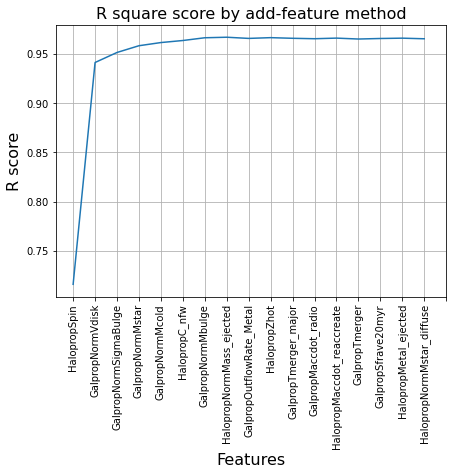

Elapsed time to run RF func on Group 3: 2930.658 seconds
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.964) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.961) total time=   3.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.945, test=0.928) total time=   2.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.965) total time=   3.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.924) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.986, test=0.959) total time=   0.7s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.987, test=0.956) total time=   2.0s
[CV 1/3] END b

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.963) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.964) total time=   3.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.929) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.986, test=0.965) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.988, test=0.956) total time=   3.8s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.966) total time=   2.9s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.941, test=0.931) total time=   1.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_esti

[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.987, test=0.965) total time=   1.6s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.991, test=0.964) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.956) total time=   3.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.943, test=0.936) total time=   2.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.964) total time=   3.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.945, test=0.920) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.987, test=0.964) total time=   1.6s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_esti

[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.963) total time=   3.4s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.966) total time=   2.8s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.942, test=0.924) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.988, test=0.957) total time=   2.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.955) total time=   0.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.960) total time=   3.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.947, test=0.922) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_esti

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.945, test=0.927) total time=   1.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.987, test=0.961) total time=   1.8s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.992, test=0.960) total time=   0.9s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.964) total time=   3.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.942, test=0.936) total time=   1.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.987, test=0.964) total time=   1.8s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.992, test=0.966) total time=   2.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimat

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.992, test=0.969) total time=   2.9s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.945, test=0.933) total time=   1.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.986, test=0.960) total time=   1.9s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.987, test=0.962) total time=   6.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.993, test=0.965) total time=   5.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.929) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.987, test=0.959) total time=   1.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimat

In [24]:
# this code takes ~50min to run when the dataset is Group 3 galaxies with ~7,000 entries
start_time = time.time()

RF_results_3 = functions.target_predicting_RF_function(X=X_3, y=y_3)

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func on Group 3: {elapsed_time:.3f} seconds")

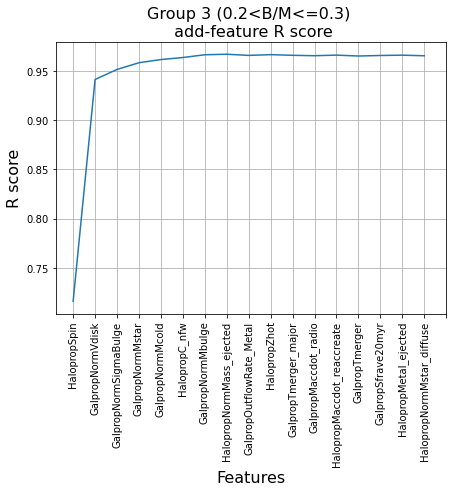

In [25]:
group3_fig_add_feature=RF_results_3[4].plot(x='features', y='r_sq_score', rot=90, figsize=(7,5), use_index=True,
                    legend=False, grid=True, 
                    xticks=range(0,18))
group3_fig_add_feature.set_title(label= 'Group 3 (0.2<B/M<=0.3) \n add-feature R score',fontsize=16)
group3_fig_add_feature.set_xlabel('Features',fontsize=16)
group3_fig_add_feature.set_ylabel('R score',fontsize=16)

# group3_fig_add_feature.get_figure().savefig('Group 3 R score by add-feature method.jpg', dpi=500)

plt.show()

In [26]:
# RF_results_3[4].to_csv('Group 3 Max r scores by add column method.csv', index=False)

group3 = pd.read_csv('Group 3 Max r scores by add column method.csv')

group3_fig = RF_results_3[1]
# group3_fig.savefig('Group 3 RF Prediction_vs_True.jpeg', dpi=500)
plt.show()

group3_fig_builtin_imp = RF_results_3[2]
# group3_fig_builtin_imp.savefig('Group 3 Built-in Feature Ranking.jpeg', dpi=500)
plt.show()

#### The most important features for Group 3 (and their corresponding add-on R scores) are:

     1 HalopropSpin 0.7159659044826053
	 2 GalpropNormVdisk 0.9414866525707485
	 3 GalpropNormSigmaBulge 0.9516762943269647
	 4 GalpropNormMstar 0.9585285354150139
	 5 GalpropNormMcold 0.9617476756183105
	 6 HalopropC_nfw 0.9638310775572402
	 7 GalpropNormMbulge 0.9666220195183318
	 8 HalopropNormMass_ejected 0.9671660664748063
	 9 GalpropOutflowRate_Metal 0.965969965226091
	 10 HalopropZhot 0.9667363677123931
	 11 GalpropTmerger_major 0.9660856064781648
	 12 GalpropMaccdot_radio 0.9656484552730555
	 13 HalopropMaccdot_reaccreate 0.9662625646247617
	 14 GalpropTmerger 0.9653437613803
	 15 GalpropSfrave20myr 0.9658838839299726
	 16 HalopropMetal_ejected 0.9662168712527475
	 17 HalopropNormMstar_diffuse 0.9655948840922693

Correlation of GalpropNormMcold with GalpropNormMHI is 0.97, so 5th most important feature for Bulgy Disks can be considered GalpropNormMHI. For comparison, GalpropNormMHI is the 3rd most important feature for Disks.

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9654 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
RF Accuracy: 0.96 (+/- 0.01)


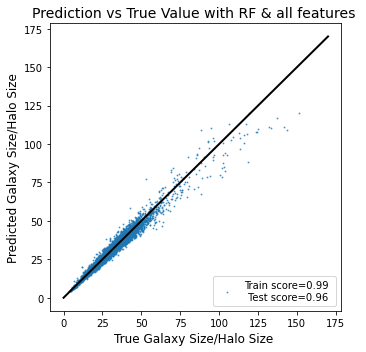

Elapsed time to compute the importances: 0.080 seconds
Elapsed time to compute the importances: 8.716 seconds


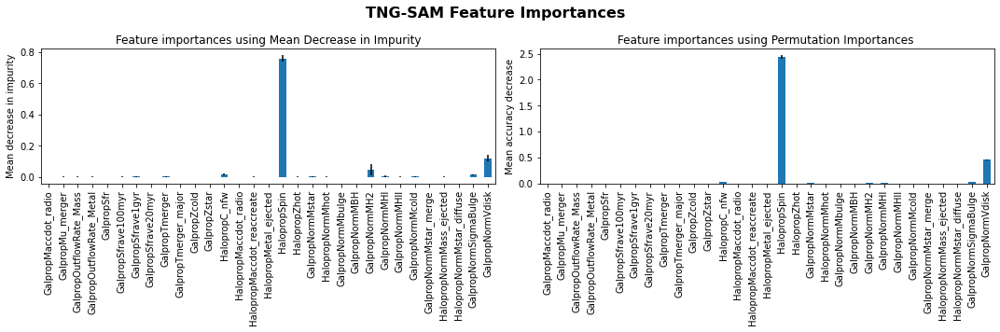

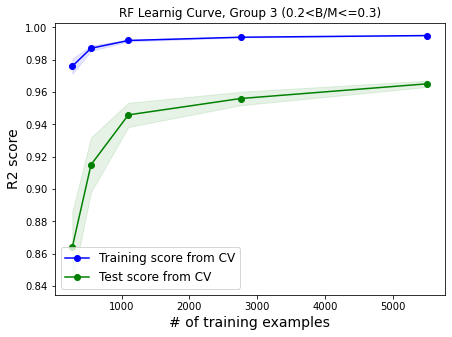

Elapsed time to run RF func and Learning Curves on Group 3 (0.2<B/M<=0.3): 167.243 seconds


In [22]:
# this code takes ~3min to run when the dataset is Group 1 galaxies with ~7,000 entries
start_time = time.time()

RF_lc_3 = tp_lc_functions.target_predicting_RF_function(X_3, y_3, 'RF Learnig Curve, Group 3 (0.2<B/M<=0.3)')

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func and Learning Curves on Group 3 (0.2<B/M<=0.3): {elapsed_time:.3f} seconds")

In [23]:
lc_3 = RF_lc_3[4]

# lc_3.savefig('RF Group 3 Learning Curve.jpeg', dpi=500)

## <font color='purple'> <a id =4> </a> <br>Group 4: 0.3< B/Mstar <=0.4

In [24]:
X_4 = df_4.drop(columns=['GalpropNormHalfRadius', 'BulgeMstar_ratio'])


y_4 = df_4.loc[:,'GalpropNormHalfRadius']

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9031 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 100}
RF Accuracy: 0.91 (+/- 0.01)


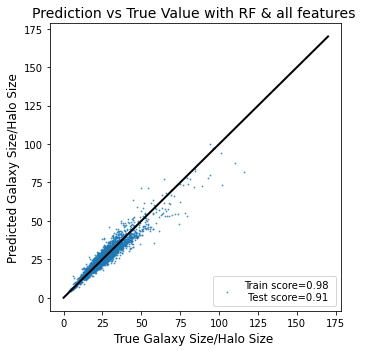

Elapsed time to compute the importances: 0.015 seconds
Elapsed time to compute the importances: 2.601 seconds


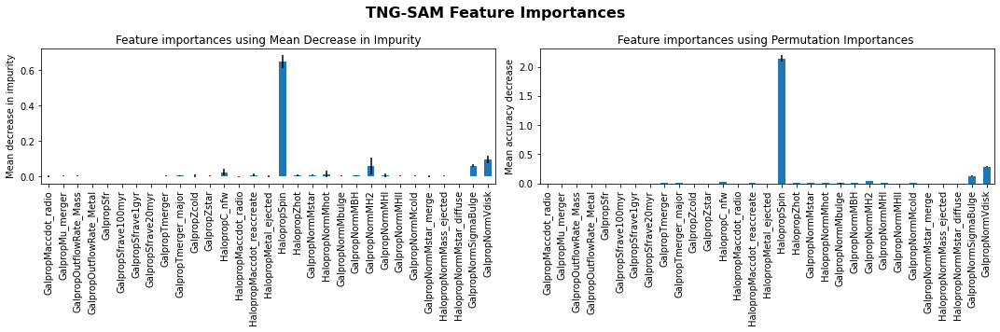

  0%|                                                    | 0/31 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/31 [00:00<00:12,  2.49it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 2/31 [00:00<00:13,  2.12it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▎                                       | 3/31 [00:01<00:13,  2.11it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 4/31 [00:01<00:12,  2.10it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 5/31 [00:02<00:13,  1.99it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▌                                   | 6/31 [00:02<00:12,  1.93it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|█████████▉                                  | 7/31 [00:03<00:12,  1.90it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▎                                | 8/31 [00:03<00:11,  1.96it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 9/31 [00:04<00:10,  2.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▊                             | 10/31 [00:04<00:10,  2.04it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                           | 11/31 [00:05<00:09,  2.03it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▋                          | 12/31 [00:05<00:09,  2.05it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████                         | 13/31 [00:06<00:08,  2.02it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▍                       | 14/31 [00:06<00:07,  2.19it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 15/31 [00:07<00:07,  2.12it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 16/31 [00:07<00:07,  2.05it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▌                   | 17/31 [00:08<00:06,  2.15it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 18/31 [00:08<00:05,  2.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 19/31 [00:09<00:05,  2.13it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▋               | 20/31 [00:09<00:05,  2.15it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 21/31 [00:10<00:04,  2.09it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▌            | 22/31 [00:10<00:04,  2.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▉           | 23/31 [00:10<00:03,  2.20it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▎         | 24/31 [00:11<00:03,  2.16it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 25/31 [00:11<00:02,  2.14it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 26/31 [00:12<00:02,  2.22it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 27/31 [00:12<00:01,  2.19it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▊    | 28/31 [00:13<00:01,  2.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▏  | 29/31 [00:13<00:00,  2.10it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 30/31 [00:14<00:00,  2.07it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 31/31 [00:14<00:00,  2.10it/s]


1. iteration: 
	 1 HalopropSpin 0.6130939593447412


  0%|                                                    | 0/30 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/30 [00:00<00:20,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 2/30 [00:01<00:19,  1.43it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 3/30 [00:02<00:19,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 4/30 [00:02<00:18,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 5/30 [00:03<00:17,  1.42it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 6/30 [00:04<00:17,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▎                                 | 7/30 [00:04<00:16,  1.40it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 8/30 [00:05<00:15,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 9/30 [00:06<00:15,  1.38it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▎                            | 10/30 [00:07<00:14,  1.40it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▊                           | 11/30 [00:07<00:13,  1.42it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 12/30 [00:08<00:13,  1.37it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 13/30 [00:09<00:12,  1.35it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████                       | 14/30 [00:10<00:11,  1.40it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 15/30 [00:10<00:10,  1.37it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▉                    | 16/30 [00:11<00:10,  1.34it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 17/30 [00:12<00:09,  1.33it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 18/30 [00:13<00:08,  1.37it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 19/30 [00:13<00:07,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 20/30 [00:14<00:07,  1.43it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 21/30 [00:15<00:06,  1.46it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 22/30 [00:15<00:05,  1.42it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|████████████████████████████████▉          | 23/30 [00:16<00:05,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 24/30 [00:17<00:04,  1.40it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 25/30 [00:18<00:03,  1.37it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 26/30 [00:18<00:02,  1.33it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 27/30 [00:19<00:02,  1.32it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 28/30 [00:20<00:01,  1.35it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 29/30 [00:21<00:00,  1.34it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 30/30 [00:21<00:00,  1.38it/s]


2. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125


  0%|                                                    | 0/29 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▌                                          | 1/29 [00:00<00:25,  1.11it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███                                         | 2/29 [00:01<00:26,  1.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▌                                       | 3/29 [00:02<00:26,  1.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 4/29 [00:04<00:25,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▌                                    | 5/29 [00:05<00:24,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████                                   | 6/29 [00:06<00:24,  1.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 7/29 [00:07<00:23,  1.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 8/29 [00:08<00:22,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▋                              | 9/29 [00:09<00:21,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 34%|██████████████▊                            | 10/29 [00:10<00:19,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▎                          | 11/29 [00:11<00:18,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▊                         | 12/29 [00:12<00:17,  1.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▎                       | 13/29 [00:13<00:15,  1.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 14/29 [00:14<00:15,  1.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 15/29 [00:15<00:14,  1.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 16/29 [00:16<00:13,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▏                 | 17/29 [00:17<00:13,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▋                | 18/29 [00:18<00:11,  1.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 66%|████████████████████████████▏              | 19/29 [00:19<00:10,  1.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▋             | 20/29 [00:20<00:09,  1.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████▏           | 21/29 [00:21<00:08,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▌          | 22/29 [00:22<00:07,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 23/29 [00:23<00:06,  1.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 24/29 [00:24<00:04,  1.00it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████      | 25/29 [00:25<00:04,  1.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▌    | 26/29 [00:26<00:02,  1.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████   | 27/29 [00:27<00:02,  1.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 28/29 [00:28<00:01,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 29/29 [00:30<00:00,  1.04s/it]


3. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676


  0%|                                                    | 0/28 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▌                                          | 1/28 [00:01<00:29,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▏                                        | 2/28 [00:02<00:32,  1.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 3/28 [00:03<00:31,  1.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 4/28 [00:05<00:30,  1.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 5/28 [00:06<00:29,  1.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▍                                  | 6/28 [00:07<00:27,  1.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 7/28 [00:08<00:26,  1.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 8/28 [00:10<00:25,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████▏                             | 9/28 [00:11<00:24,  1.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▎                           | 10/28 [00:12<00:22,  1.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▉                          | 11/28 [00:13<00:21,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▍                        | 12/28 [00:15<00:20,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▉                       | 13/28 [00:16<00:19,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 14/28 [00:17<00:18,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████                    | 15/28 [00:19<00:16,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 16/28 [00:20<00:15,  1.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████                 | 17/28 [00:21<00:14,  1.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▋               | 18/28 [00:22<00:12,  1.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 19/28 [00:23<00:10,  1.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 20/28 [00:25<00:09,  1.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 21/28 [00:26<00:08,  1.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▊         | 22/28 [00:27<00:07,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▎       | 23/28 [00:29<00:06,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 24/28 [00:30<00:05,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 25/28 [00:31<00:03,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▉   | 26/28 [00:32<00:02,  1.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 27/28 [00:34<00:01,  1.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 28/28 [00:35<00:00,  1.27s/it]


4. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754


  0%|                                                    | 0/27 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/27 [00:01<00:33,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▎                                        | 2/27 [00:02<00:35,  1.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 3/27 [00:04<00:38,  1.61s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 4/27 [00:05<00:34,  1.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▏                                   | 5/27 [00:07<00:31,  1.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 6/27 [00:08<00:31,  1.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 7/27 [00:10<00:30,  1.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████                               | 8/27 [00:12<00:29,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 9/27 [00:13<00:28,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▉                           | 10/27 [00:15<00:26,  1.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▌                         | 11/27 [00:16<00:25,  1.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████                        | 12/27 [00:18<00:23,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 13/27 [00:19<00:21,  1.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 14/27 [00:21<00:20,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 15/27 [00:23<00:18,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 16/27 [00:24<00:17,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████                | 17/27 [00:26<00:15,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 18/27 [00:27<00:14,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████▎            | 19/27 [00:29<00:12,  1.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 20/27 [00:30<00:10,  1.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 21/27 [00:32<00:09,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|███████████████████████████████████        | 22/27 [00:34<00:07,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▋      | 23/27 [00:35<00:06,  1.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 24/27 [00:37<00:04,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▊   | 25/27 [00:38<00:03,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 26/27 [00:40<00:01,  1.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 27/27 [00:41<00:00,  1.55s/it]


5. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146


  0%|                                                    | 0/26 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/26 [00:01<00:45,  1.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▍                                        | 2/26 [00:03<00:44,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████                                       | 3/26 [00:05<00:42,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▊                                     | 4/26 [00:07<00:38,  1.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 5/26 [00:08<00:37,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▏                                 | 6/26 [00:10<00:35,  1.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▊                                | 7/26 [00:12<00:34,  1.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▌                              | 8/26 [00:14<00:32,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▏                            | 9/26 [00:16<00:31,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                          | 10/26 [00:18<00:29,  1.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▏                        | 11/26 [00:19<00:27,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▊                       | 12/26 [00:21<00:25,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 13/26 [00:23<00:23,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.085, test=-0.050) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.120, test=-0.018) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.149, test=-0.070) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.145, test=-0.082) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.137, test=-0.011) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.289, test=-0.084) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.282, test=-0.028) total time=   0.1s
[CV 3

[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.119, test=-0.045) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.113, test=-0.019) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.126, test=0.021) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.441, test=-0.276) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.454, test=-0.258) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.190, test=0.109) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.520, test=-0.148) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_le

[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.955, test=0.872) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.899, test=0.858) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.899, test=0.855) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.969, test=0.880) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.972, test=0.876) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.959, test=0.859) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.953, test=0.882) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_esti

 54%|███████████████████████▏                   | 14/26 [00:25<00:21,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▊                  | 15/26 [00:27<00:20,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.083, test=-0.018) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.085, test=-0.042) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.171, test=-0.117) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.090, test=0.008) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.087, test=0.010) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.489, test=-0.313) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.510, test=-0.213) total time=   0.1s
[CV 3/3

 62%|██████████████████████████▍                | 16/26 [00:29<00:18,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 17/26 [00:31<00:16,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.071, test=-0.004) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.073, test=0.001) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.140, test=-0.074) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.091, test=0.011) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.298, test=-0.064) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.502, test=-0.224) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.511, test=-0.277) total time=   0.2s
[CV 3/3

[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.147, test=-0.082) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.125, test=-0.008) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.151, test=-0.080) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.080, test=0.006) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.287, test=-0.040) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.263, test=-0.027) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.279, test=-0.027) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_e

 69%|█████████████████████████████▊             | 18/26 [00:32<00:14,  1.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.086, test=-0.048) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.138, test=-0.077) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.134, test=-0.014) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.103, test=-0.018) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.105, test=-0.015) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.263, test=-0.031) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.123, test=0.061) total time=   0.0s
[CV 2/3] E

 73%|███████████████████████████████▍           | 19/26 [00:34<00:12,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████          | 20/26 [00:36<00:11,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.083, test=-0.016) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.123, test=-0.011) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.129, test=-0.016) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.171, test=-0.119) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.085, test=0.005) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.497, test=-0.209) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.291, test=-0.036) total time=   0.0s
[CV 

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.717, test=0.639) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.890, test=0.537) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.884, test=0.603) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.838, test=0.673) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.841, test=0.678) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.882, test=0.662) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.892, test=0.662) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_est

[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.818, test=0.653) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.885, test=0.616) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.681, test=0.663) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.817, test=0.562) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.821, test=0.578) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.778, test=0.734) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.905, test=0.710) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_est

 81%|██████████████████████████████████▋        | 21/26 [00:38<00:09,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.085, test=-0.021) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.165, test=-0.128) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.151, test=-0.084) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.084, test=0.008) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.297, test=-0.056) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.501, test=-0.215) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.169, test=0.028) total time=   0.0s
[CV 1

 85%|████████████████████████████████████▍      | 22/26 [00:40<00:07,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|██████████████████████████████████████     | 23/26 [00:42<00:05,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▋   | 24/26 [00:43<00:03,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 25/26 [00:45<00:01,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 26/26 [00:47<00:00,  1.83s/it]


6. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555


  0%|                                                    | 0/25 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/25 [00:02<00:49,  2.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▌                                        | 2/25 [00:04<00:47,  2.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▎                                      | 3/25 [00:06<00:45,  2.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 4/25 [00:08<00:44,  2.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 5/25 [00:10<00:42,  2.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 6/25 [00:12<00:38,  2.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▎                               | 7/25 [00:14<00:36,  2.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 8/25 [00:16<00:35,  2.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▊                            | 9/25 [00:18<00:33,  2.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 10/25 [00:20<00:31,  2.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|██████████████████▉                        | 11/25 [00:22<00:29,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 12/25 [00:24<00:27,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 13/25 [00:27<00:25,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████                   | 14/25 [00:29<00:22,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 15/25 [00:31<00:20,  2.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▌               | 16/25 [00:33<00:19,  2.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 17/25 [00:35<00:16,  2.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|██████████████████████████████▉            | 18/25 [00:37<00:14,  2.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▋          | 19/25 [00:39<00:12,  2.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 20/25 [00:41<00:10,  2.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 21/25 [00:43<00:08,  2.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▊     | 22/25 [00:45<00:06,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▌   | 23/25 [00:48<00:04,  2.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 24/25 [00:50<00:02,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 25/25 [00:52<00:00,  2.09s/it]


7. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998


  0%|                                                    | 0/24 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/24 [00:02<00:52,  2.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▋                                        | 2/24 [00:04<00:51,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 3/24 [00:06<00:45,  2.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 4/24 [00:08<00:44,  2.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▏                                  | 5/24 [00:11<00:43,  2.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 6/24 [00:13<00:41,  2.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 7/24 [00:15<00:39,  2.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 8/24 [00:18<00:37,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 9/24 [00:20<00:34,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|█████████████████▉                         | 10/24 [00:22<00:32,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▋                       | 11/24 [00:25<00:30,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 12/24 [00:27<00:27,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████▎                   | 13/24 [00:29<00:25,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|█████████████████████████                  | 14/24 [00:32<00:23,  2.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 15/24 [00:34<00:20,  2.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 16/24 [00:37<00:18,  2.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▍            | 17/24 [00:39<00:16,  2.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 18/24 [00:41<00:14,  2.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 19/24 [00:44<00:11,  2.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 20/24 [00:46<00:09,  2.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 21/24 [00:48<00:07,  2.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▍   | 22/24 [00:51<00:04,  2.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 23/24 [00:53<00:02,  2.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 24/24 [00:55<00:00,  2.33s/it]


8. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511


  0%|                                                    | 0/23 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▉                                          | 1/23 [00:02<00:55,  2.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|███▊                                        | 2/23 [00:05<00:53,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 3/23 [00:07<00:50,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▋                                    | 4/23 [00:10<00:48,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▌                                  | 5/23 [00:12<00:45,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 6/23 [00:15<00:43,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▍                              | 7/23 [00:17<00:38,  2.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                            | 8/23 [00:19<00:36,  2.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████▏                          | 9/23 [00:22<00:35,  2.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 10/23 [00:25<00:32,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▌                      | 11/23 [00:27<00:30,  2.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▍                    | 12/23 [00:30<00:28,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 13/23 [00:32<00:25,  2.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▏                | 14/23 [00:35<00:23,  2.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 15/23 [00:38<00:20,  2.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|█████████████████████████████▉             | 16/23 [00:40<00:17,  2.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 17/23 [00:42<00:14,  2.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▋         | 18/23 [00:45<00:12,  2.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 19/23 [00:47<00:10,  2.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 20/23 [00:50<00:07,  2.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████▎   | 21/23 [00:52<00:05,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 22/23 [00:55<00:02,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 23/23 [00:58<00:00,  2.53s/it]


9. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126


  0%|                                                    | 0/22 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/22 [00:02<00:58,  2.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|████                                        | 2/22 [00:05<00:55,  2.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 3/22 [00:08<00:52,  2.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|████████                                    | 4/22 [00:11<00:50,  2.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████                                  | 5/22 [00:14<00:47,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|████████████                                | 6/22 [00:16<00:44,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 7/22 [00:19<00:42,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|████████████████                            | 8/22 [00:22<00:39,  2.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 9/22 [00:24<00:34,  2.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▌                       | 10/22 [00:27<00:32,  2.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 11/22 [00:30<00:30,  2.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▍                   | 12/22 [00:33<00:27,  2.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 13/22 [00:35<00:24,  2.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▎               | 14/22 [00:38<00:22,  2.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▎             | 15/22 [00:41<00:19,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▎           | 16/22 [00:44<00:16,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▏         | 17/22 [00:47<00:14,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▏       | 18/22 [00:50<00:11,  2.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████▏     | 19/22 [00:52<00:08,  2.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████    | 20/22 [00:55<00:05,  2.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|█████████████████████████████████████████  | 21/22 [00:58<00:02,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 22/22 [01:01<00:00,  2.79s/it]


10. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432


  0%|                                                    | 0/21 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/21 [00:02<00:59,  3.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▏                                       | 2/21 [00:06<00:57,  3.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 3/21 [00:09<00:55,  3.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 4/21 [00:12<00:52,  3.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▍                                 | 5/21 [00:15<00:48,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 6/21 [00:18<00:45,  3.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 7/21 [00:21<00:42,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▊                           | 8/21 [00:24<00:39,  3.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▊                         | 9/21 [00:27<00:36,  3.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▍                      | 10/21 [00:30<00:33,  3.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▌                    | 11/21 [00:33<00:30,  3.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 12/21 [00:36<00:27,  3.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▌                | 13/21 [00:39<00:23,  2.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 14/21 [00:42<00:20,  2.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 15/21 [00:45<00:17,  2.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▊          | 16/21 [00:48<00:15,  3.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▊        | 17/21 [00:51<00:12,  3.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 18/21 [00:54<00:09,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▉    | 19/21 [00:57<00:06,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▉  | 20/21 [01:00<00:03,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 21/21 [01:03<00:00,  3.03s/it]


11. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432
	 11 GalpropSfr 0.9127960588957698


  0%|                                                    | 0/20 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██▏                                         | 1/20 [00:03<01:02,  3.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 2/20 [00:06<00:58,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 3/20 [00:09<00:55,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 4/20 [00:13<00:52,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 5/20 [00:16<00:49,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 6/20 [00:19<00:45,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▍                            | 7/20 [00:22<00:42,  3.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 8/20 [00:26<00:39,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▊                        | 9/20 [00:29<00:35,  3.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 10/20 [00:32<00:32,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 11/20 [00:35<00:29,  3.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 12/20 [00:39<00:26,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▉               | 13/20 [00:42<00:22,  3.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 14/20 [00:45<00:19,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.903, test=0.847) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.977, test=0.891) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.905) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.894, test=0.861) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.963, test=0.889) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.966, test=0.892) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.976, test=0.891) total time=   0.3s
[CV 3/3] E

 75%|████████████████████████████████▎          | 15/20 [00:49<00:16,  3.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 16/20 [00:52<00:13,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▌      | 17/20 [00:55<00:09,  3.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 18/20 [00:58<00:06,  3.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▊  | 19/20 [01:02<00:03,  3.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 20/20 [01:05<00:00,  3.27s/it]


12. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432
	 11 GalpropSfr 0.9127960588957698
	 12 HalopropMetal_ejected 0.913548921688228


  0%|                                                    | 0/19 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.980, test=0.908) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.970, test=0.907) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.973, test=0.899) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.896, test=0.868) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.971, test=0.892) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.973, test=0.898) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.977, test=0.910) total time=   0.1s
[CV 2/3] EN

[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.900) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.980, test=0.903) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.899, test=0.866) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.972, test=0.908) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.899) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.980, test=0.914) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.899, test=0.861) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estim

[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.972, test=0.909) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.979, test=0.911) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.979, test=0.907) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.902, test=0.857) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.969, test=0.899) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.970, test=0.908) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.974, test=0.899) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimat

  5%|██▎                                         | 1/19 [00:02<00:53,  2.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.967, test=0.899) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.968, test=0.889) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.970, test=0.897) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.970, test=0.907) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.979, test=0.898) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.894, test=0.881) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.905, test=0.859) total time=   0.3s
[CV 1/3] END b

[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.971, test=0.894) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.901) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.897, test=0.867) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.971, test=0.904) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.903) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.978, test=0.910) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.898, test=0.885) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_est

 11%|████▋                                       | 2/19 [00:06<00:56,  3.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|██████▉                                     | 3/19 [00:10<00:54,  3.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.905, test=0.855) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.967, test=0.893) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.979, test=0.889) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.896, test=0.856) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.885) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.975, test=0.894) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.900, test=0.850) total time=   0.3s
[CV 3/3] 

[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.977, test=0.912) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.908, test=0.851) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.907) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.981, test=0.926) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.898, test=0.844) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.900, test=0.871) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.905) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estima

[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.981, test=0.913) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.900, test=0.862) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.903, test=0.870) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.979, test=0.910) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.981, test=0.912) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.905, test=0.860) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.978, test=0.914) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_e

 21%|█████████▎                                  | 4/19 [00:13<00:51,  3.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▌                                | 5/19 [00:17<00:48,  3.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.967, test=0.885) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.969, test=0.902) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.977, test=0.888) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.892, test=0.863) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.899, test=0.866) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.976, test=0.901) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.978, test=0.908) total time=   0.3s
[CV 3/3] EN

 32%|█████████████▉                              | 6/19 [00:20<00:45,  3.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|████████████████▏                           | 7/19 [00:24<00:42,  3.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▌                         | 8/19 [00:27<00:38,  3.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▊                       | 9/19 [00:31<00:35,  3.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▋                    | 10/19 [00:34<00:31,  3.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 11/19 [00:38<00:28,  3.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 12/19 [00:41<00:24,  3.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▍             | 13/19 [00:45<00:21,  3.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▋           | 14/19 [00:48<00:17,  3.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▉         | 15/19 [00:52<00:14,  3.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████▏      | 16/19 [00:55<00:10,  3.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 17/19 [00:59<00:07,  3.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▋  | 18/19 [01:03<00:03,  3.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 19/19 [01:06<00:00,  3.50s/it]


13. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432
	 11 GalpropSfr 0.9127960588957698
	 12 HalopropMetal_ejected 0.913548921688228
	 13 GalpropMu_merger 0.915299700364244


  0%|                                                    | 0/18 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▍                                         | 1/18 [00:03<01:03,  3.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 2/18 [00:07<00:59,  3.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 3/18 [00:11<00:56,  3.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 4/18 [00:15<00:53,  3.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 5/18 [00:18<00:49,  3.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 6/18 [00:22<00:45,  3.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████                           | 7/18 [00:26<00:41,  3.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▌                        | 8/18 [00:30<00:37,  3.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 9/18 [00:33<00:33,  3.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 10/18 [00:37<00:30,  3.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 11/18 [00:41<00:26,  3.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 12/18 [00:45<00:22,  3.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████            | 13/18 [00:48<00:17,  3.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 14/18 [00:52<00:14,  3.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 15/18 [00:56<00:11,  3.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 16/18 [00:59<00:07,  3.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▌  | 17/18 [01:03<00:03,  3.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 18/18 [01:07<00:00,  3.74s/it]


14. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432
	 11 GalpropSfr 0.9127960588957698
	 12 HalopropMetal_ejected 0.913548921688228
	 13 GalpropMu_merger 0.915299700364244
	 14 GalpropNormMBH 0.9125693196106126


  0%|                                                    | 0/17 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▌                                         | 1/17 [00:03<01:03,  3.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▏                                      | 2/17 [00:07<00:58,  3.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 3/17 [00:11<00:51,  3.66s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▎                                 | 4/17 [00:15<00:49,  3.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▉                               | 5/17 [00:19<00:46,  3.88s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▌                            | 6/17 [00:23<00:43,  3.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 7/17 [00:27<00:39,  3.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▋                       | 8/17 [00:30<00:33,  3.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▎                    | 9/17 [00:34<00:30,  3.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▎                 | 10/17 [00:38<00:27,  3.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▊               | 11/17 [00:42<00:23,  3.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▎            | 12/17 [00:46<00:18,  3.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▉          | 13/17 [00:50<00:15,  3.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▍       | 14/17 [00:54<00:11,  3.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▉     | 15/17 [00:57<00:07,  3.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▍  | 16/17 [01:01<00:03,  3.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 17/17 [01:05<00:00,  3.84s/it]


15. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432
	 11 GalpropSfr 0.9127960588957698
	 12 HalopropMetal_ejected 0.913548921688228
	 13 GalpropMu_merger 0.915299700364244
	 14 GalpropNormMBH 0.9125693196106126
	 15 GalpropNormMcold 0.9126912241830096


  0%|                                                    | 0/16 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 1/16 [00:04<01:03,  4.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 2/16 [00:07<00:53,  3.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▎                                   | 3/16 [00:12<00:52,  4.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 4/16 [00:16<00:49,  4.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▊                              | 5/16 [00:20<00:45,  4.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 6/16 [00:24<00:42,  4.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▎                        | 7/16 [00:29<00:38,  4.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 8/16 [00:33<00:33,  4.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████▊                   | 9/16 [00:37<00:29,  4.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 10/16 [00:41<00:25,  4.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▌             | 11/16 [00:46<00:21,  4.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 12/16 [00:50<00:17,  4.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▉        | 13/16 [00:54<00:12,  4.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 14/16 [00:58<00:08,  4.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▎  | 15/16 [01:03<00:04,  4.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 16/16 [01:07<00:00,  4.22s/it]


16. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432
	 11 GalpropSfr 0.9127960588957698
	 12 HalopropMetal_ejected 0.913548921688228
	 13 GalpropMu_merger 0.915299700364244
	 14 GalpropNormMBH 0.9125693196106126
	 15 GalpropNormMcold 0.9126912241830096
	 16 GalpropSfrave20myr 0.9121569650013232


  0%|                                                    | 0/15 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 1/15 [00:04<01:00,  4.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 2/15 [00:08<00:57,  4.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 3/15 [00:13<00:52,  4.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 4/15 [00:17<00:48,  4.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 5/15 [00:22<00:44,  4.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 6/15 [00:26<00:40,  4.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▌                       | 7/15 [00:31<00:35,  4.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▍                    | 8/15 [00:35<00:31,  4.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|██████████████████████████▍                 | 9/15 [00:40<00:26,  4.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 10/15 [00:44<00:22,  4.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 11/15 [00:48<00:16,  4.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 12/15 [00:52<00:12,  4.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 13/15 [00:57<00:08,  4.38s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 14/15 [01:00<00:04,  4.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 15/15 [01:05<00:00,  4.37s/it]

17. iteration: 
	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432
	 11 GalpropSfr 0.9127960588957698
	 12 HalopropMetal_ejected 0.913548921688228
	 13 GalpropMu_merger 0.915299700364244
	 14 GalpropNormMBH 0.9125693196106126
	 15 GalpropNormMcold 0.9126912241830096
	 16 GalpropSfrave20myr 0.9121569650013232
	 17 HalopropMaccdot_reaccreate 0.9127351223207757


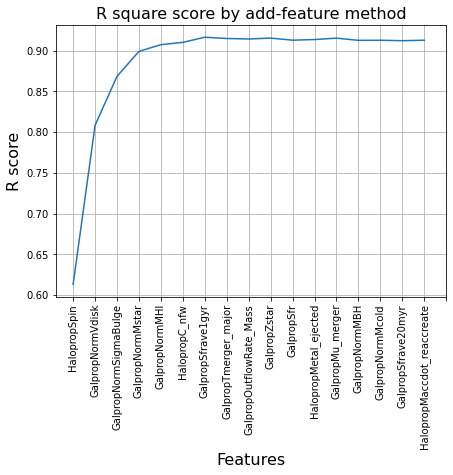

Elapsed time to run RF func on Group 4: 932.498 seconds


In [28]:
# this code takes ~ 15.5 min to run when the dataset is Group 4 galaxies with ~3,000 entries
start_time = time.time()

RF_results_4 = functions.target_predicting_RF_function(X=X_4, y=y_4)

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func on Group 4: {elapsed_time:.3f} seconds")

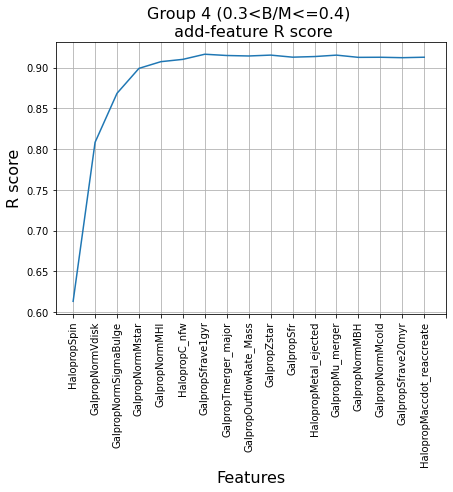

In [29]:
group4_fig_add_feature=RF_results_4[4].plot(x='features', y='r_sq_score', rot=90, figsize=(7,5), use_index=True,
                    legend=False, grid=True, 
                    xticks=range(0,18))
group4_fig_add_feature.set_title(label= 'Group 4 (0.3<B/M<=0.4) \n add-feature R score',fontsize=16)
group4_fig_add_feature.set_xlabel('Features',fontsize=16)
group4_fig_add_feature.set_ylabel('R score',fontsize=16)

# group4_fig_add_feature.get_figure().savefig('Group 4 R score by add-feature method.jpg', dpi=500)

plt.show()

In [31]:
# RF_results_4[4].to_csv('Group 4 Max r scores by add column method.csv', index=False)

group4 = pd.read_csv('Group 4 Max r scores by add column method.csv')

group4_fig = RF_results_4[1]
# group4_fig.savefig('Group 4 RF Prediction_vs_True.jpeg', dpi=500)
plt.show()

group4_fig_builtin_imp = RF_results_4[2]
# group4_fig_builtin_imp.savefig('Group 4 Built-in Feature Ranking.jpeg', dpi=500)
plt.show()

#### The most important features for Group 4 (and their add-on corresponding R scores) are:

	 1 HalopropSpin 0.6130939593447412
	 2 GalpropNormVdisk 0.8082691968789125
	 3 GalpropNormSigmaBulge 0.8684348103751676
	 4 GalpropNormMstar 0.8990379396871754
	 5 GalpropNormMHI 0.907276300144146
	 6 HalopropC_nfw 0.9101055052246555
	 7 GalpropSfrave1gyr 0.9164052721050998
	 8 GalpropTmerger_major 0.9148470837834511
	 9 GalpropOutflowRate_Mass 0.9142546575913126
	 10 GalpropZstar 0.9153270227944432
	 11 GalpropSfr 0.9127960588957698
	 12 HalopropMetal_ejected 0.913548921688228
	 13 GalpropMu_merger 0.915299700364244
	 14 GalpropNormMBH 0.9125693196106126
	 15 GalpropNormMcold 0.9126912241830096
	 16 GalpropSfrave20myr 0.9121569650013232
	 17 HalopropMaccdot_reaccreate 0.9127351223207757


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.9029 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
RF Accuracy: 0.90 (+/- 0.02)


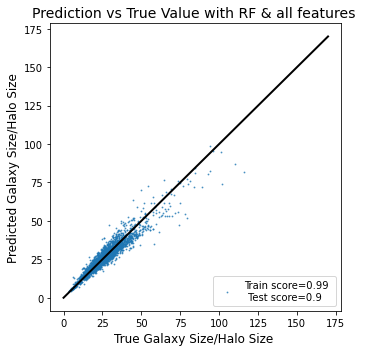

Elapsed time to compute the importances: 0.017 seconds
Elapsed time to compute the importances: 3.535 seconds


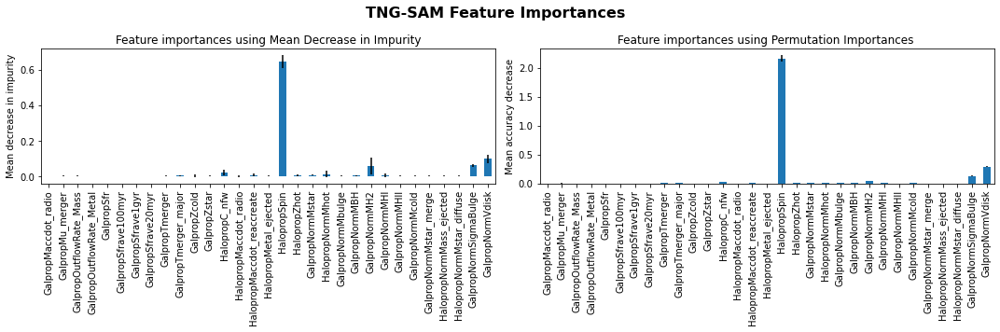

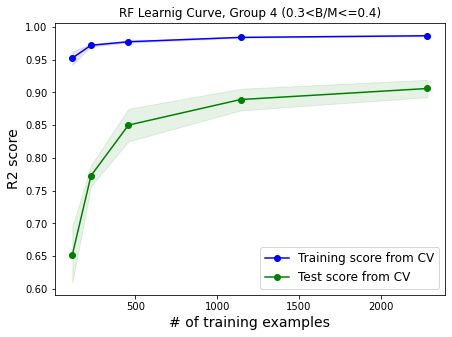

Elapsed time to run RF func and Learning Curves on Group 4 (0.3<B/M<=0.4): 62.487 seconds


In [25]:
# this code takes ~1min to run when the dataset is Group 4 galaxies with ~3,000 entries
start_time = time.time()

RF_lc_4 = tp_lc_functions.target_predicting_RF_function(X_4, y_4, 'RF Learnig Curve, Group 4 (0.3<B/M<=0.4)')

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func and Learning Curves on Group 4 (0.3<B/M<=0.4): {elapsed_time:.3f} seconds")

In [26]:
lc_4 = RF_lc_4[4]

# lc_4.savefig('RF Group 4 Learning Curve.jpeg', dpi=500)

## <font color='purple'> <a id =5> </a> <br>Group 5: 0.4< B/Mstar <=0.5

In [27]:
X_5 = df_5.drop(columns=['GalpropNormHalfRadius', 'BulgeMstar_ratio'])


y_5 = df_5.loc[:,'GalpropNormHalfRadius']

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.7607 {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 1, 'n_estimators': 50}
RF Accuracy: 0.74 (+/- 0.05)


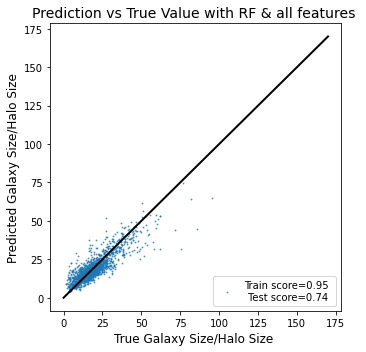

Elapsed time to compute the importances: 0.008 seconds
Elapsed time to compute the importances: 0.690 seconds


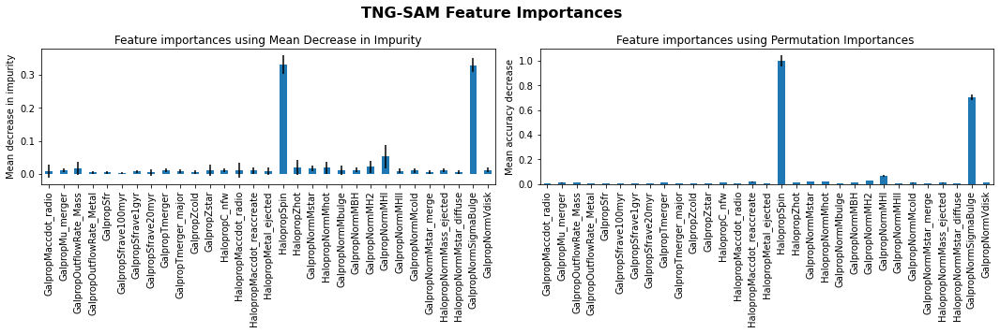

  0%|                                                    | 0/31 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/31 [00:00<00:11,  2.69it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 2/31 [00:00<00:11,  2.58it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▎                                       | 3/31 [00:01<00:10,  2.65it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 4/31 [00:01<00:09,  2.82it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 5/31 [00:01<00:09,  2.67it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▌                                   | 6/31 [00:02<00:08,  2.80it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|█████████▉                                  | 7/31 [00:02<00:09,  2.53it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▎                                | 8/31 [00:03<00:09,  2.52it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 9/31 [00:03<00:09,  2.40it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▊                             | 10/31 [00:03<00:08,  2.41it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                           | 11/31 [00:04<00:08,  2.42it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▋                          | 12/31 [00:04<00:08,  2.37it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████                         | 13/31 [00:05<00:07,  2.36it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▍                       | 14/31 [00:05<00:06,  2.64it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 15/31 [00:05<00:05,  2.72it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 16/31 [00:06<00:05,  2.86it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▌                   | 17/31 [00:06<00:04,  2.95it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 18/31 [00:06<00:04,  3.02it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 19/31 [00:07<00:04,  2.81it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▋               | 20/31 [00:07<00:04,  2.72it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 21/31 [00:07<00:03,  2.81it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▌            | 22/31 [00:08<00:03,  2.99it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▉           | 23/31 [00:08<00:02,  2.98it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▎         | 24/31 [00:08<00:02,  2.92it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 25/31 [00:09<00:01,  3.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 26/31 [00:09<00:01,  3.03it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 27/31 [00:09<00:01,  3.12it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▊    | 28/31 [00:10<00:00,  3.04it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▏  | 29/31 [00:10<00:00,  3.05it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 30/31 [00:10<00:00,  3.21it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 31/31 [00:11<00:00,  2.80it/s]


1. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515


  0%|                                                    | 0/30 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/30 [00:00<00:13,  2.11it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 2/30 [00:00<00:12,  2.28it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 3/30 [00:01<00:12,  2.22it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 4/30 [00:01<00:11,  2.29it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 5/30 [00:02<00:10,  2.33it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 6/30 [00:02<00:10,  2.36it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▎                                 | 7/30 [00:03<00:09,  2.30it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 8/30 [00:03<00:09,  2.33it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 9/30 [00:03<00:09,  2.28it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▎                            | 10/30 [00:04<00:08,  2.27it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▊                           | 11/30 [00:04<00:08,  2.24it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 12/30 [00:05<00:08,  2.13it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 13/30 [00:05<00:08,  2.06it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████                       | 14/30 [00:06<00:08,  1.93it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 15/30 [00:06<00:07,  2.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▉                    | 16/30 [00:07<00:06,  2.06it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 17/30 [00:07<00:06,  2.11it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 18/30 [00:08<00:05,  2.13it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 19/30 [00:08<00:05,  2.16it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 20/30 [00:09<00:04,  2.17it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 21/30 [00:09<00:04,  2.17it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 22/30 [00:10<00:03,  2.17it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|████████████████████████████████▉          | 23/30 [00:10<00:03,  2.27it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 24/30 [00:10<00:02,  2.28it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 25/30 [00:11<00:02,  2.27it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 26/30 [00:11<00:01,  2.24it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 27/30 [00:12<00:01,  2.21it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 28/30 [00:12<00:00,  2.27it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 29/30 [00:13<00:00,  2.25it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 30/30 [00:13<00:00,  2.21it/s]


2. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668


  0%|                                                    | 0/29 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▌                                          | 1/29 [00:00<00:14,  1.88it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███                                         | 2/29 [00:01<00:16,  1.61it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▌                                       | 3/29 [00:01<00:16,  1.60it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 4/29 [00:02<00:15,  1.61it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▌                                    | 5/29 [00:03<00:14,  1.62it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████                                   | 6/29 [00:03<00:13,  1.68it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 7/29 [00:04<00:12,  1.74it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 8/29 [00:04<00:11,  1.76it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▋                              | 9/29 [00:05<00:11,  1.79it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 34%|██████████████▊                            | 10/29 [00:05<00:10,  1.81it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▎                          | 11/29 [00:06<00:09,  1.82it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▊                         | 12/29 [00:06<00:09,  1.87it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▎                       | 13/29 [00:07<00:08,  1.86it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 14/29 [00:07<00:08,  1.86it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 15/29 [00:08<00:07,  1.85it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 16/29 [00:09<00:07,  1.80it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▏                 | 17/29 [00:09<00:06,  1.72it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▋                | 18/29 [00:10<00:06,  1.68it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 66%|████████████████████████████▏              | 19/29 [00:10<00:06,  1.66it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▋             | 20/29 [00:11<00:05,  1.65it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████▏           | 21/29 [00:12<00:04,  1.61it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▌          | 22/29 [00:12<00:04,  1.63it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 23/29 [00:13<00:03,  1.66it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 24/29 [00:13<00:02,  1.76it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████      | 25/29 [00:14<00:02,  1.76it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▌    | 26/29 [00:14<00:01,  1.78it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████   | 27/29 [00:15<00:01,  1.86it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 28/29 [00:16<00:00,  1.85it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 29/29 [00:16<00:00,  1.76it/s]


3. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953


  0%|                                                    | 0/28 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▌                                          | 1/28 [00:00<00:18,  1.48it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▏                                        | 2/28 [00:01<00:17,  1.48it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 3/28 [00:02<00:17,  1.45it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 4/28 [00:02<00:16,  1.45it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 5/28 [00:03<00:15,  1.52it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▍                                  | 6/28 [00:04<00:14,  1.49it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 7/28 [00:04<00:14,  1.48it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 8/28 [00:05<00:13,  1.48it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████▏                             | 9/28 [00:06<00:12,  1.47it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▎                           | 10/28 [00:06<00:12,  1.46it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▉                          | 11/28 [00:07<00:11,  1.45it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▍                        | 12/28 [00:08<00:11,  1.45it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▉                       | 13/28 [00:08<00:10,  1.45it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 14/28 [00:09<00:09,  1.46it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████                    | 15/28 [00:10<00:08,  1.51it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 16/28 [00:10<00:08,  1.48it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████                 | 17/28 [00:11<00:07,  1.46it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▋               | 18/28 [00:12<00:06,  1.43it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 19/28 [00:13<00:06,  1.36it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 20/28 [00:13<00:05,  1.38it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 21/28 [00:14<00:05,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▊         | 22/28 [00:15<00:04,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▎       | 23/28 [00:15<00:03,  1.38it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 24/28 [00:16<00:02,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 25/28 [00:17<00:02,  1.38it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▉   | 26/28 [00:18<00:01,  1.38it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 27/28 [00:18<00:00,  1.38it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 28/28 [00:19<00:00,  1.43it/s]


4. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315


  0%|                                                    | 0/27 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/27 [00:00<00:18,  1.40it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▎                                        | 2/27 [00:01<00:19,  1.27it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 3/27 [00:02<00:19,  1.24it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 4/27 [00:03<00:18,  1.23it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▏                                   | 5/27 [00:03<00:17,  1.27it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 6/27 [00:04<00:17,  1.22it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 7/27 [00:05<00:16,  1.21it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████                               | 8/27 [00:06<00:14,  1.30it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 9/27 [00:07<00:14,  1.24it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▉                           | 10/27 [00:08<00:13,  1.23it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▌                         | 11/27 [00:08<00:13,  1.19it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████                        | 12/27 [00:09<00:12,  1.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 13/27 [00:10<00:11,  1.22it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 14/27 [00:11<00:10,  1.20it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 15/27 [00:12<00:09,  1.26it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 16/27 [00:12<00:08,  1.24it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████                | 17/27 [00:13<00:07,  1.26it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 18/27 [00:14<00:07,  1.23it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████▎            | 19/27 [00:15<00:06,  1.23it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 20/27 [00:16<00:05,  1.22it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 21/27 [00:17<00:04,  1.21it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|███████████████████████████████████        | 22/27 [00:17<00:04,  1.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▋      | 23/27 [00:18<00:03,  1.16it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 24/27 [00:19<00:02,  1.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▊   | 25/27 [00:20<00:01,  1.20it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 26/27 [00:21<00:00,  1.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 27/27 [00:22<00:00,  1.22it/s]


5. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295


  0%|                                                    | 0/26 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/26 [00:00<00:23,  1.06it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▍                                        | 2/26 [00:01<00:21,  1.13it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████                                       | 3/26 [00:02<00:21,  1.07it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▊                                     | 4/26 [00:03<00:20,  1.08it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 5/26 [00:04<00:19,  1.07it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▏                                 | 6/26 [00:05<00:20,  1.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▊                                | 7/26 [00:06<00:20,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▌                              | 8/26 [00:07<00:18,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▏                            | 9/26 [00:08<00:17,  1.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                          | 10/26 [00:09<00:16,  1.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.221, test=0.189) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.275, test=0.119) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.361, test=0.073) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.173, test=-0.011) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.355, test=-0.068) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.382, test=-0.084) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.543, test=-0.371) total time=   0.1s
[CV 3/3] EN

 42%|██████████████████▏                        | 11/26 [00:10<00:14,  1.01it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▊                       | 12/26 [00:11<00:13,  1.02it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 13/26 [00:12<00:11,  1.09it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.296, test=0.149) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.297, test=0.161) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.313, test=0.138) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.373, test=0.061) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.174, test=0.012) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.496, test=-0.118) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.517, test=-0.210) total time=   0.1s
[CV 2/

 54%|███████████████████████▏                   | 14/26 [00:13<00:11,  1.09it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▊                  | 15/26 [00:14<00:10,  1.06it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.274, test=0.110) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.368, test=0.023) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.360, test=0.069) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.369, test=0.060) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.322, test=0.145) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.156, test=0.018) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.396, test=-0.171) total time=   0.0s
[CV 2/3] END

 62%|██████████████████████████▍                | 16/26 [00:15<00:09,  1.05it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.283, test=0.093) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.387, test=0.020) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.167, test=0.015) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.502, test=-0.192) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.510, test=-0.127) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.202, test=0.065) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.413, test=-0.037) total time=   0.0s
[CV 1/3

 65%|████████████████████████████               | 17/26 [00:16<00:08,  1.09it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.221, test=0.199) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.284, test=0.089) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.299, test=0.158) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.166, test=0.011) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.186, test=-0.003) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.384, test=-0.083) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.229, test=0.049) total time=   0.1s
[CV 3/3] END bo

[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.923, test=0.725) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.934, test=0.694) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.928, test=0.730) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.932, test=0.734) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.943, test=0.735) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.816, test=0.704) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.934, test=0.697) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimator

 69%|█████████████████████████████▊             | 18/26 [00:17<00:07,  1.06it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▍           | 19/26 [00:18<00:06,  1.03it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████          | 20/26 [00:19<00:05,  1.02it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 21/26 [00:20<00:04,  1.00it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.220, test=0.191) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.318, test=0.149) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.174, test=0.008) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.367, test=-0.079) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.374, test=-0.064) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.196, test=0.059) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.237, test=0.041) total time=   0.1s
[CV 3/3] END b

 85%|████████████████████████████████████▍      | 22/26 [00:21<00:03,  1.05it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.278, test=0.078) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.355, test=0.064) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.372, test=0.048) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.374, test=0.064) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.186, test=-0.009) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.368, test=-0.067) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.530, test=-0.370) total time=   0.0s
[CV 2/3] 

[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.918, test=0.699) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.933, test=0.721) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.810, test=0.710) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.812, test=0.708) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.929, test=0.718) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.937, test=0.719) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.929, test=0.658) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_est

 88%|██████████████████████████████████████     | 23/26 [00:22<00:02,  1.02it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▋   | 24/26 [00:23<00:01,  1.07it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 25/26 [00:24<00:00,  1.06it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.273, test=0.119) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.372, test=0.041) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.382, test=0.008) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.387, test=0.026) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.165, test=0.013) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.411, test=-0.159) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.352, test=-0.030) total time=   0.0s
[CV 2/3] E

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.941, test=0.757) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.812, test=0.697) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.926, test=0.724) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.918, test=0.763) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.923, test=0.733) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.820, test=0.720) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.817, test=0.714) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimat

100%|███████████████████████████████████████████| 26/26 [00:25<00:00,  1.03it/s]


6. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981


  0%|                                                    | 0/25 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/25 [00:01<00:27,  1.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▌                                        | 2/25 [00:02<00:25,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▎                                      | 3/25 [00:03<00:24,  1.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 4/25 [00:04<00:23,  1.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 5/25 [00:05<00:20,  1.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 6/25 [00:06<00:20,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▎                               | 7/25 [00:07<00:18,  1.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 8/25 [00:08<00:17,  1.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▊                            | 9/25 [00:09<00:16,  1.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 10/25 [00:10<00:15,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|██████████████████▉                        | 11/25 [00:11<00:14,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 12/25 [00:12<00:13,  1.05s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 13/25 [00:13<00:13,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████                   | 14/25 [00:15<00:12,  1.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 15/25 [00:16<00:11,  1.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▌               | 16/25 [00:17<00:09,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 17/25 [00:18<00:08,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|██████████████████████████████▉            | 18/25 [00:19<00:07,  1.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▋          | 19/25 [00:20<00:06,  1.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 20/25 [00:21<00:05,  1.08s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 21/25 [00:22<00:04,  1.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▊     | 22/25 [00:23<00:03,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▌   | 23/25 [00:24<00:02,  1.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 24/25 [00:25<00:01,  1.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 25/25 [00:26<00:00,  1.08s/it]


7. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204


  0%|                                                    | 0/24 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/24 [00:01<00:25,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▋                                        | 2/24 [00:02<00:22,  1.04s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 3/24 [00:03<00:23,  1.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 4/24 [00:04<00:21,  1.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▏                                  | 5/24 [00:05<00:20,  1.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 6/24 [00:06<00:19,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 7/24 [00:07<00:18,  1.07s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 8/24 [00:08<00:17,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 9/24 [00:09<00:17,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|█████████████████▉                         | 10/24 [00:11<00:16,  1.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▋                       | 11/24 [00:12<00:15,  1.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 12/24 [00:13<00:14,  1.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████▎                   | 13/24 [00:14<00:12,  1.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|█████████████████████████                  | 14/24 [00:15<00:11,  1.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 15/24 [00:17<00:10,  1.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 16/24 [00:18<00:09,  1.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▍            | 17/24 [00:19<00:08,  1.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 18/24 [00:20<00:07,  1.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 19/24 [00:22<00:06,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 20/24 [00:23<00:05,  1.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 21/24 [00:24<00:03,  1.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▍   | 22/24 [00:26<00:02,  1.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 23/24 [00:27<00:01,  1.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 24/24 [00:28<00:00,  1.18s/it]


8. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962


  0%|                                                    | 0/23 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▉                                          | 1/23 [00:01<00:28,  1.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|███▊                                        | 2/23 [00:02<00:27,  1.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 3/23 [00:03<00:26,  1.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▋                                    | 4/23 [00:05<00:24,  1.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▌                                  | 5/23 [00:06<00:23,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 6/23 [00:07<00:22,  1.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▍                              | 7/23 [00:09<00:21,  1.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                            | 8/23 [00:10<00:19,  1.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████▏                          | 9/23 [00:11<00:18,  1.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 10/23 [00:13<00:17,  1.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▌                      | 11/23 [00:14<00:15,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▍                    | 12/23 [00:15<00:13,  1.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 13/23 [00:16<00:12,  1.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▏                | 14/23 [00:17<00:11,  1.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 15/23 [00:19<00:10,  1.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|█████████████████████████████▉             | 16/23 [00:20<00:08,  1.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 17/23 [00:21<00:07,  1.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▋         | 18/23 [00:22<00:06,  1.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 19/23 [00:24<00:04,  1.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 20/23 [00:25<00:03,  1.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████▎   | 21/23 [00:26<00:02,  1.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 22/23 [00:28<00:01,  1.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 23/23 [00:29<00:00,  1.28s/it]


9. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638


  0%|                                                    | 0/22 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/22 [00:01<00:28,  1.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|████                                        | 2/22 [00:02<00:24,  1.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 3/22 [00:03<00:24,  1.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|████████                                    | 4/22 [00:05<00:23,  1.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████                                  | 5/22 [00:06<00:23,  1.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|████████████                                | 6/22 [00:08<00:22,  1.38s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 7/22 [00:09<00:20,  1.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|████████████████                            | 8/22 [00:10<00:19,  1.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 9/22 [00:12<00:18,  1.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▌                       | 10/22 [00:13<00:15,  1.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 11/22 [00:14<00:14,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▍                   | 12/22 [00:16<00:13,  1.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 13/22 [00:17<00:12,  1.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▎               | 14/22 [00:18<00:10,  1.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▎             | 15/22 [00:20<00:09,  1.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▎           | 16/22 [00:21<00:08,  1.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▏         | 17/22 [00:23<00:06,  1.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▏       | 18/22 [00:24<00:05,  1.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████▏     | 19/22 [00:25<00:04,  1.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████    | 20/22 [00:27<00:02,  1.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|█████████████████████████████████████████  | 21/22 [00:28<00:01,  1.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 22/22 [00:30<00:00,  1.37s/it]


10. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338


  0%|                                                    | 0/21 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/21 [00:01<00:29,  1.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▏                                       | 2/21 [00:02<00:28,  1.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 3/21 [00:04<00:26,  1.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 4/21 [00:05<00:25,  1.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▍                                 | 5/21 [00:07<00:23,  1.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 6/21 [00:08<00:22,  1.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 7/21 [00:10<00:20,  1.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▊                           | 8/21 [00:11<00:19,  1.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▊                         | 9/21 [00:13<00:18,  1.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▍                      | 10/21 [00:14<00:16,  1.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▌                    | 11/21 [00:16<00:15,  1.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 12/21 [00:18<00:13,  1.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▌                | 13/21 [00:19<00:11,  1.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 14/21 [00:20<00:10,  1.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 15/21 [00:22<00:08,  1.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▊          | 16/21 [00:23<00:07,  1.42s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▊        | 17/21 [00:25<00:05,  1.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 18/21 [00:26<00:04,  1.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▉    | 19/21 [00:28<00:02,  1.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▉  | 20/21 [00:29<00:01,  1.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 21/21 [00:31<00:00,  1.49s/it]


11. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338
	 11 GalpropNormMBH 0.7696595087150465


  0%|                                                    | 0/20 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██▏                                         | 1/20 [00:01<00:30,  1.63s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 2/20 [00:03<00:29,  1.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 3/20 [00:04<00:27,  1.62s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 4/20 [00:06<00:27,  1.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 5/20 [00:08<00:26,  1.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 6/20 [00:10<00:24,  1.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▍                            | 7/20 [00:11<00:22,  1.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 8/20 [00:13<00:20,  1.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▊                        | 9/20 [00:15<00:19,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 10/20 [00:17<00:17,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 11/20 [00:19<00:16,  1.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 12/20 [00:20<00:14,  1.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.937, test=0.707) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.940, test=0.745) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.790, test=0.703) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.928, test=0.656) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.931, test=0.711) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.821, test=0.736) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.919, test=0.751) total time=   0.3s
[CV 1/3] E

 65%|███████████████████████████▉               | 13/20 [00:22<00:12,  1.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 14/20 [00:24<00:10,  1.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 15/20 [00:25<00:08,  1.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 16/20 [00:27<00:06,  1.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▌      | 17/20 [00:29<00:04,  1.65s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 18/20 [00:30<00:03,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.940, test=0.680) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.814, test=0.716) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.815, test=0.661) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.939, test=0.684) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.941, test=0.759) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.925, test=0.703) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.929, test=0.713) total time=   0.1s
[CV 1/3] EN

 95%|████████████████████████████████████████▊  | 19/20 [00:31<00:01,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.926, test=0.741) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.935, test=0.750) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.921, test=0.736) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.925, test=0.742) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.941, test=0.669) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.941, test=0.776) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.840, test=0.644) total time=   0.1s
[CV 3/3]

100%|███████████████████████████████████████████| 20/20 [00:33<00:00,  1.68s/it]


12. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338
	 11 GalpropNormMBH 0.7696595087150465
	 12 HalopropNormMass_ejected 0.7674512218643478


  0%|                                                    | 0/19 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██▎                                         | 1/19 [00:01<00:23,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 2/19 [00:03<00:27,  1.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|██████▉                                     | 3/19 [00:04<00:26,  1.63s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.934, test=0.766) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.827, test=0.724) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.942, test=0.740) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.945, test=0.750) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.812, test=0.727) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.927, test=0.766) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.947, test=0.744) total time=   0.2s
[CV 3/3] 

[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.936, test=0.771) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.951, test=0.701) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.823, test=0.764) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.945, test=0.751) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.950, test=0.718) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.825, test=0.729) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.937, test=0.765) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_esti

 21%|█████████▎                                  | 4/19 [00:06<00:25,  1.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▌                                | 5/19 [00:08<00:23,  1.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.808, test=0.713) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.932, test=0.701) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.945, test=0.698) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.821, test=0.725) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.817, test=0.754) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.941, test=0.777) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.943, test=0.766) total time=   0.3s
[CV 2/3] EN

[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.952, test=0.700) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.811, test=0.745) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.926, test=0.690) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.936, test=0.772) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.924, test=0.771) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.929, test=0.789) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.943, test=0.772) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimato

 32%|█████████████▉                              | 6/19 [00:10<00:22,  1.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|████████████████▏                           | 7/19 [00:11<00:21,  1.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▌                         | 8/19 [00:13<00:19,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▊                       | 9/19 [00:15<00:18,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▋                    | 10/19 [00:17<00:16,  1.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 11/19 [00:19<00:14,  1.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 12/19 [00:21<00:12,  1.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▍             | 13/19 [00:22<00:10,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▋           | 14/19 [00:24<00:08,  1.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▉         | 15/19 [00:26<00:06,  1.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████▏      | 16/19 [00:27<00:05,  1.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 17/19 [00:29<00:03,  1.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▋  | 18/19 [00:31<00:01,  1.71s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 19/19 [00:32<00:00,  1.74s/it]


13. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338
	 11 GalpropNormMBH 0.7696595087150465
	 12 HalopropNormMass_ejected 0.7674512218643478
	 13 GalpropNormMH2 0.7682836365417107


  0%|                                                    | 0/18 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▍                                         | 1/18 [00:01<00:30,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 2/18 [00:03<00:28,  1.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 3/18 [00:05<00:26,  1.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 4/18 [00:07<00:25,  1.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 5/18 [00:08<00:23,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 6/18 [00:10<00:20,  1.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████                           | 7/18 [00:12<00:19,  1.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▌                        | 8/18 [00:14<00:17,  1.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 9/18 [00:15<00:15,  1.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 10/18 [00:17<00:14,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 11/18 [00:19<00:12,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 12/18 [00:21<00:10,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████            | 13/18 [00:23<00:08,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 14/18 [00:24<00:07,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 15/18 [00:26<00:05,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 16/18 [00:28<00:03,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▌  | 17/18 [00:30<00:01,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 18/18 [00:31<00:00,  1.78s/it]


14. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338
	 11 GalpropNormMBH 0.7696595087150465
	 12 HalopropNormMass_ejected 0.7674512218643478
	 13 GalpropNormMH2 0.7682836365417107
	 14 HalopropNormMhot 0.767039627623156


  0%|                                                    | 0/17 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▌                                         | 1/17 [00:01<00:30,  1.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▏                                      | 2/17 [00:03<00:28,  1.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 3/17 [00:05<00:26,  1.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▎                                 | 4/17 [00:07<00:24,  1.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▉                               | 5/17 [00:09<00:22,  1.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▌                            | 6/17 [00:11<00:19,  1.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 7/17 [00:12<00:18,  1.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▋                       | 8/17 [00:14<00:16,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▎                    | 9/17 [00:16<00:14,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▎                 | 10/17 [00:18<00:12,  1.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▊               | 11/17 [00:20<00:11,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▎            | 12/17 [00:22<00:08,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▉          | 13/17 [00:23<00:07,  1.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▍       | 14/17 [00:25<00:05,  1.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▉     | 15/17 [00:27<00:03,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▍  | 16/17 [00:29<00:01,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 17/17 [00:31<00:00,  1.84s/it]


15. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338
	 11 GalpropNormMBH 0.7696595087150465
	 12 HalopropNormMass_ejected 0.7674512218643478
	 13 GalpropNormMH2 0.7682836365417107
	 14 HalopropNormMhot 0.767039627623156
	 15 HalopropMaccdot_reaccreate 0.7627278552558132


  0%|                                                    | 0/16 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 1/16 [00:01<00:29,  1.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 2/16 [00:03<00:27,  1.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▎                                   | 3/16 [00:05<00:25,  1.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 4/16 [00:07<00:23,  1.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▊                              | 5/16 [00:09<00:21,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 6/16 [00:11<00:19,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▎                        | 7/16 [00:13<00:17,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 8/16 [00:15<00:16,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████▊                   | 9/16 [00:17<00:13,  1.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 10/16 [00:19<00:11,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▌             | 11/16 [00:21<00:09,  1.98s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 12/16 [00:23<00:07,  1.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▉        | 13/16 [00:25<00:05,  1.99s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 14/16 [00:27<00:03,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▎  | 15/16 [00:29<00:02,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 16/16 [00:31<00:00,  1.99s/it]


16. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338
	 11 GalpropNormMBH 0.7696595087150465
	 12 HalopropNormMass_ejected 0.7674512218643478
	 13 GalpropNormMH2 0.7682836365417107
	 14 HalopropNormMhot 0.767039627623156
	 15 HalopropMaccdot_reaccreate 0.7627278552558132
	 16 HalopropZhot 0.7649186282820836


  0%|                                                    | 0/15 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 1/15 [00:02<00:28,  2.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 2/15 [00:04<00:27,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 3/15 [00:06<00:26,  2.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 4/15 [00:08<00:25,  2.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 5/15 [00:11<00:22,  2.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 6/15 [00:13<00:19,  2.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▌                       | 7/15 [00:15<00:17,  2.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▍                    | 8/15 [00:17<00:14,  2.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|██████████████████████████▍                 | 9/15 [00:19<00:12,  2.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 10/15 [00:21<00:10,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 11/15 [00:23<00:08,  2.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 12/15 [00:25<00:05,  1.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 13/15 [00:27<00:03,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 14/15 [00:29<00:02,  2.02s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 15/15 [00:31<00:00,  2.10s/it]

17. iteration: 
	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338
	 11 GalpropNormMBH 0.7696595087150465
	 12 HalopropNormMass_ejected 0.7674512218643478
	 13 GalpropNormMH2 0.7682836365417107
	 14 HalopropNormMhot 0.767039627623156
	 15 HalopropMaccdot_reaccreate 0.7627278552558132
	 16 HalopropZhot 0.7649186282820836
	 17 GalpropNormMstar_merge 0.7637749362514251


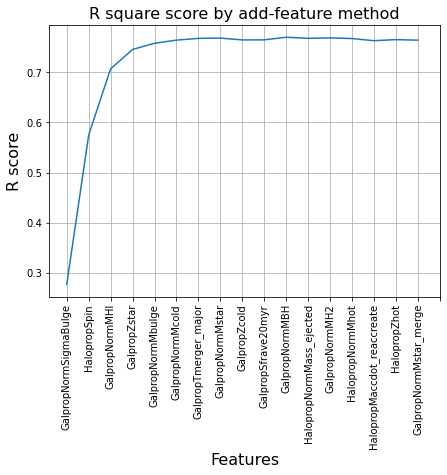

Elapsed time to run RF func on Group 5: 464.830 seconds


In [33]:
# this code takes ~ 8 min to run when the dataset is Group 5 galaxies with ~1,400 entries
start_time = time.time()

RF_results_5 = functions.target_predicting_RF_function(X=X_5, y=y_5)

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func on Group 5: {elapsed_time:.3f} seconds")

#### The most important features for Group 5 are:

	 1 GalpropNormSigmaBulge 0.27712519423458515
	 2 HalopropSpin 0.5748614869584668
	 3 GalpropNormMHI 0.7067278037999953
	 4 GalpropZstar 0.7453424346793315
	 5 GalpropNormMbulge 0.7575518789701295
	 6 GalpropNormMcold 0.7638919992953981
	 7 GalpropTmerger_major 0.7673997329999204
	 8 GalpropNormMstar 0.7679703387552962
	 9 GalpropZcold 0.7642874816734638
	 10 GalpropSfrave20myr 0.7644498029187338
	 11 GalpropNormMBH 0.7696595087150465
	 12 HalopropNormMass_ejected 0.7674512218643478
	 13 GalpropNormMH2 0.7682836365417107
	 14 HalopropNormMhot 0.767039627623156
	 15 HalopropMaccdot_reaccreate 0.7627278552558132
	 16 HalopropZhot 0.7649186282820836
	 17 GalpropNormMstar_merge 0.7637749362514251

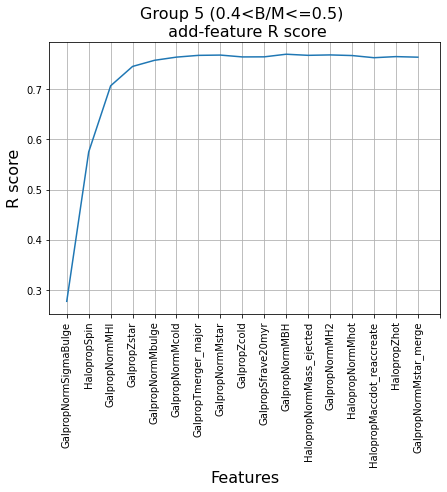

In [34]:
group5_fig_add_feature=RF_results_5[4].plot(x='features', y='r_sq_score', rot=90, figsize=(7,5), use_index=True,
                    legend=False, grid=True, 
                    xticks=range(0,18))
group5_fig_add_feature.set_title(label= 'Group 5 (0.4<B/M<=0.5) \n add-feature R score',fontsize=16)
group5_fig_add_feature.set_xlabel('Features',fontsize=16)
group5_fig_add_feature.set_ylabel('R score',fontsize=16)

group5_fig_add_feature.get_figure().savefig('Group 5 R score by add-feature method.jpg', dpi=500)

plt.show()

In [35]:
RF_results_5[4].to_csv('Group 5 Max r scores by add column method.csv', index=False)

group5 = pd.read_csv('Group 5 Max r scores by add column method.csv')

group5_fig = RF_results_5[1]
group5_fig.savefig('Group 5 RF Prediction_vs_True.jpeg', dpi=500)
plt.show()

group5_fig_builtin_imp = RF_results_5[2]
group5_fig_builtin_imp.savefig('Group 5 Built-in Feature Ranking.jpeg', dpi=500)
plt.show()

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.7571 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
RF Accuracy: 0.74 (+/- 0.05)


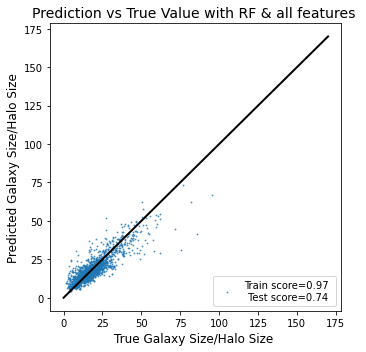

Elapsed time to compute the importances: 0.006 seconds
Elapsed time to compute the importances: 1.748 seconds


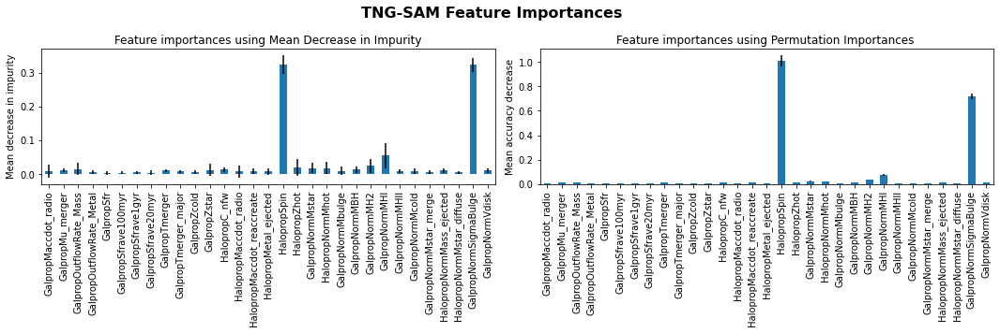

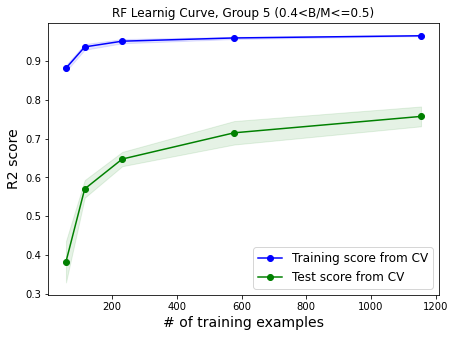

Elapsed time to run RF func and Learning Curves on Group 5 (0.4<B/M<=0.5): 27.820 seconds


In [28]:
# this code takes ~27 seconds to run when the dataset is Group 5 galaxies with ~1,400 entries
start_time = time.time()

RF_lc_5 = tp_lc_functions.target_predicting_RF_function(X_5, y_5, 'RF Learnig Curve, Group 5 (0.4<B/M<=0.5)')

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func and Learning Curves on Group 5 (0.4<B/M<=0.5): {elapsed_time:.3f} seconds")

In [10]:
lc_5 = RF_lc_5[4]

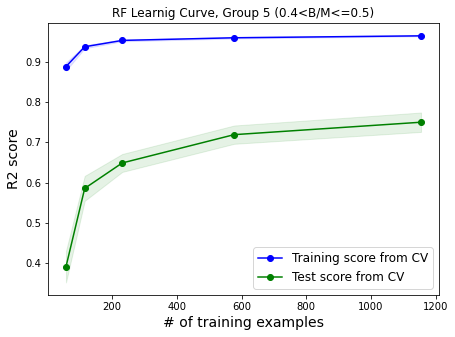

In [11]:
lc_5

In [12]:
lc_5 = RF_lc_5[4]

# lc_5.savefig('RF Group 5 Learning Curve.jpeg', dpi=500)


## <font color='purple'> <a id =6> </a> <br> Group 6 (Elliptical) Galaxies:  B/Mstar > 0.5

In [29]:
X_6 = df_6.drop(columns=['GalpropNormHalfRadius', 'BulgeMstar_ratio'])


y_6 = df_6.loc[:,'GalpropNormHalfRadius']

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.7970 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 100}
RF Accuracy: 0.78 (+/- 0.05)


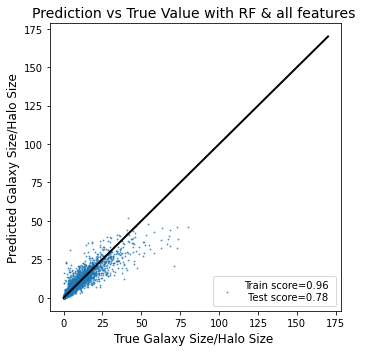

Elapsed time to compute the importances: 0.005 seconds
Elapsed time to compute the importances: 1.893 seconds


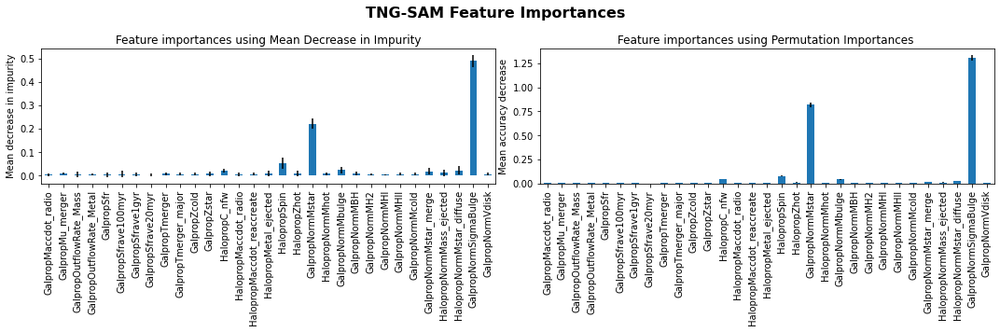

  0%|                                                    | 0/31 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/31 [00:00<00:14,  2.12it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▊                                         | 2/31 [00:00<00:12,  2.27it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▎                                       | 3/31 [00:01<00:12,  2.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 4/31 [00:01<00:12,  2.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 5/31 [00:02<00:12,  2.12it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▌                                   | 6/31 [00:02<00:11,  2.15it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|█████████▉                                  | 7/31 [00:03<00:11,  2.17it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▎                                | 8/31 [00:03<00:10,  2.17it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 9/31 [00:04<00:10,  2.15it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▊                             | 10/31 [00:04<00:09,  2.15it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                           | 11/31 [00:05<00:08,  2.23it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▋                          | 12/31 [00:05<00:08,  2.19it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████                         | 13/31 [00:06<00:08,  2.15it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▍                       | 14/31 [00:06<00:07,  2.22it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 15/31 [00:06<00:07,  2.17it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 16/31 [00:07<00:06,  2.20it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▌                   | 17/31 [00:07<00:06,  2.22it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 18/31 [00:08<00:05,  2.24it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 19/31 [00:08<00:05,  2.20it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▋               | 20/31 [00:09<00:05,  2.16it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 21/31 [00:09<00:04,  2.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▌            | 22/31 [00:09<00:03,  2.32it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▉           | 23/31 [00:10<00:03,  2.26it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▎         | 24/31 [00:10<00:03,  2.32it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 25/31 [00:11<00:02,  2.26it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 26/31 [00:11<00:02,  2.19it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 27/31 [00:12<00:01,  2.14it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▊    | 28/31 [00:12<00:01,  2.11it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▏  | 29/31 [00:13<00:00,  2.08it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 30/31 [00:13<00:00,  2.08it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 31/31 [00:14<00:00,  2.20it/s]


1. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826


  0%|                                                    | 0/30 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▍                                          | 1/30 [00:00<00:20,  1.45it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 2/30 [00:01<00:19,  1.42it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 3/30 [00:02<00:19,  1.42it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 4/30 [00:02<00:18,  1.41it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 5/30 [00:03<00:18,  1.39it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 6/30 [00:04<00:17,  1.38it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▎                                 | 7/30 [00:04<00:15,  1.46it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 8/30 [00:05<00:15,  1.44it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 9/30 [00:06<00:14,  1.43it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▎                            | 10/30 [00:07<00:13,  1.43it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▊                           | 11/30 [00:07<00:13,  1.45it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 12/30 [00:08<00:12,  1.43it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 13/30 [00:09<00:11,  1.48it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████                       | 14/30 [00:09<00:10,  1.47it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 15/30 [00:10<00:10,  1.45it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▉                    | 16/30 [00:11<00:09,  1.43it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.943, test=0.689) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.826, test=0.675) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.932, test=0.741) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.936, test=0.746) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.947, test=0.723) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.949, test=0.779) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.820, test=0.768) total time=   0.1s
[CV 1/3] END

 57%|████████████████████████▎                  | 17/30 [00:11<00:08,  1.46it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 18/30 [00:12<00:08,  1.44it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 19/30 [00:13<00:07,  1.46it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 20/30 [00:13<00:06,  1.48it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 21/30 [00:14<00:06,  1.46it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 22/30 [00:15<00:05,  1.51it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|████████████████████████████████▉          | 23/30 [00:15<00:04,  1.54it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 24/30 [00:16<00:03,  1.50it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 25/30 [00:17<00:03,  1.54it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 26/30 [00:17<00:02,  1.54it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 27/30 [00:18<00:02,  1.50it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.948, test=0.680) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.948, test=0.773) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.817, test=0.756) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.934, test=0.751) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.934, test=0.802) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.946, test=0.803) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.820, test=0.719) total time=   0.1s
[CV 3/3] EN

 93%|████████████████████████████████████████▏  | 28/30 [00:19<00:01,  1.48it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 29/30 [00:19<00:00,  1.50it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.809, test=0.755) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.924, test=0.789) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.951, test=0.724) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.823, test=0.694) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.935, test=0.769) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.821, test=0.735) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.938, test=0.768) total time=   0.3s
[CV 3/3] END bo

100%|███████████████████████████████████████████| 30/30 [00:20<00:00,  1.46it/s]


2. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163


  0%|                                                    | 0/29 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  3%|█▌                                          | 1/29 [00:00<00:26,  1.04it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.832, test=0.739) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.926, test=0.754) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.936, test=0.695) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.939, test=0.771) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.832, test=0.692) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.940, test=0.723) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.948, test=0.747) total time=   0.3s
[CV 3/3] END bo

  7%|███                                         | 2/29 [00:01<00:23,  1.15it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.940, test=0.782) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.952, test=0.767) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.824, test=0.742) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.936, test=0.768) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.947, test=0.782) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.817, test=0.768) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.936, test=0.794) total time=   0.3s
[CV 3/3] E

[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.378, test=0.267) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.529, test=0.206) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.535, test=0.217) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.658, test=0.074) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.646, test=0.128) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.106, test=0.007) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.279, test=-0.037) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estim

 10%|████▌                                       | 3/29 [00:02<00:22,  1.14it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 4/29 [00:03<00:22,  1.13it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.953, test=0.748) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.822, test=0.656) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.932, test=0.740) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.929, test=0.699) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.940, test=0.755) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.826, test=0.749) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.946, test=0.751) total time=   0.2s
[CV 3/3] EN

 17%|███████▌                                    | 5/29 [00:04<00:20,  1.18it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████                                   | 6/29 [00:05<00:19,  1.15it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 7/29 [00:06<00:18,  1.16it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 8/29 [00:06<00:18,  1.16it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▋                              | 9/29 [00:07<00:17,  1.14it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 34%|██████████████▊                            | 10/29 [00:08<00:17,  1.11it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▎                          | 11/29 [00:09<00:15,  1.16it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▊                         | 12/29 [00:10<00:14,  1.17it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▎                       | 13/29 [00:11<00:14,  1.12it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▊                      | 14/29 [00:12<00:13,  1.10it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▏                    | 15/29 [00:13<00:13,  1.07it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 16/29 [00:14<00:13,  1.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▏                 | 17/29 [00:15<00:12,  1.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▋                | 18/29 [00:16<00:10,  1.00it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 66%|████████████████████████████▏              | 19/29 [00:17<00:09,  1.05it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▋             | 20/29 [00:18<00:08,  1.04it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████▏           | 21/29 [00:19<00:07,  1.03it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▌          | 22/29 [00:20<00:06,  1.06it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 23/29 [00:21<00:05,  1.07it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 24/29 [00:22<00:04,  1.05it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████      | 25/29 [00:22<00:03,  1.08it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▌    | 26/29 [00:23<00:02,  1.07it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████   | 27/29 [00:24<00:01,  1.13it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 97%|█████████████████████████████████████████▌ | 28/29 [00:25<00:00,  1.11it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 29/29 [00:26<00:00,  1.10it/s]


3. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301


  0%|                                                    | 0/28 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▌                                          | 1/28 [00:01<00:31,  1.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▏                                        | 2/28 [00:02<00:31,  1.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 3/28 [00:03<00:29,  1.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 4/28 [00:04<00:28,  1.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 5/28 [00:05<00:27,  1.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▍                                  | 6/28 [00:07<00:26,  1.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 7/28 [00:08<00:23,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 8/28 [00:09<00:22,  1.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████▏                             | 9/28 [00:10<00:21,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▎                           | 10/28 [00:11<00:20,  1.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|████████████████▉                          | 11/28 [00:12<00:19,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▍                        | 12/28 [00:13<00:18,  1.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▉                       | 13/28 [00:14<00:16,  1.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 14/28 [00:16<00:15,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████                    | 15/28 [00:17<00:14,  1.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 16/28 [00:18<00:13,  1.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████                 | 17/28 [00:19<00:12,  1.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▋               | 18/28 [00:20<00:11,  1.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 19/28 [00:21<00:10,  1.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 20/28 [00:23<00:09,  1.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 21/28 [00:24<00:08,  1.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▊         | 22/28 [00:25<00:06,  1.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▎       | 23/28 [00:26<00:05,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 24/28 [00:27<00:04,  1.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 25/28 [00:28<00:03,  1.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▉   | 26/28 [00:29<00:02,  1.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 27/28 [00:30<00:01,  1.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 28/28 [00:32<00:00,  1.15s/it]


4. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713


  0%|                                                    | 0/27 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/27 [00:01<00:35,  1.38s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|███▎                                        | 2/27 [00:02<00:34,  1.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 3/27 [00:04<00:33,  1.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 4/27 [00:05<00:31,  1.38s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▏                                   | 5/27 [00:06<00:30,  1.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 6/27 [00:08<00:27,  1.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 7/27 [00:09<00:26,  1.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████                               | 8/27 [00:10<00:25,  1.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 9/27 [00:12<00:24,  1.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|███████████████▉                           | 10/27 [00:13<00:23,  1.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|█████████████████▌                         | 11/27 [00:15<00:21,  1.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████                        | 12/27 [00:16<00:20,  1.38s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 13/27 [00:17<00:18,  1.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 14/27 [00:18<00:16,  1.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 15/27 [00:20<00:15,  1.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 16/27 [00:21<00:14,  1.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████                | 17/27 [00:22<00:13,  1.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 18/27 [00:24<00:11,  1.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████▎            | 19/27 [00:25<00:10,  1.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 20/27 [00:26<00:08,  1.28s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 21/27 [00:27<00:07,  1.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|███████████████████████████████████        | 22/27 [00:29<00:06,  1.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▋      | 23/27 [00:30<00:05,  1.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 24/27 [00:32<00:04,  1.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|███████████████████████████████████████▊   | 25/27 [00:33<00:02,  1.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▍ | 26/27 [00:34<00:01,  1.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 27/27 [00:36<00:00,  1.34s/it]


5. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034


  0%|                                                    | 0/26 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▋                                          | 1/26 [00:01<00:39,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▍                                        | 2/26 [00:02<00:34,  1.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████                                       | 3/26 [00:04<00:34,  1.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▊                                     | 4/26 [00:06<00:34,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 5/26 [00:07<00:32,  1.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████▏                                 | 6/26 [00:09<00:31,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▊                                | 7/26 [00:10<00:29,  1.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▌                              | 8/26 [00:12<00:28,  1.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▏                            | 9/26 [00:14<00:26,  1.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                          | 10/26 [00:15<00:25,  1.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▏                        | 11/26 [00:17<00:23,  1.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 46%|███████████████████▊                       | 12/26 [00:18<00:22,  1.58s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 13/26 [00:20<00:20,  1.59s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 54%|███████████████████████▏                   | 14/26 [00:21<00:17,  1.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▊                  | 15/26 [00:22<00:15,  1.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▍                | 16/26 [00:24<00:14,  1.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 17/26 [00:26<00:13,  1.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▊             | 18/26 [00:27<00:11,  1.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▍           | 19/26 [00:29<00:10,  1.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████          | 20/26 [00:30<00:09,  1.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▋        | 21/26 [00:31<00:07,  1.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▍      | 22/26 [00:33<00:06,  1.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|██████████████████████████████████████     | 23/26 [00:35<00:04,  1.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▋   | 24/26 [00:36<00:02,  1.43s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 25/26 [00:37<00:01,  1.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 26/26 [00:39<00:00,  1.52s/it]


6. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921


  0%|                                                    | 0/25 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/25 [00:01<00:42,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▌                                        | 2/25 [00:03<00:41,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▎                                      | 3/25 [00:05<00:39,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|███████                                     | 4/25 [00:07<00:37,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 5/25 [00:08<00:35,  1.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▌                                 | 6/25 [00:10<00:33,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▎                               | 7/25 [00:12<00:31,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 8/25 [00:14<00:30,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|███████████████▊                            | 9/25 [00:16<00:28,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▏                         | 10/25 [00:17<00:26,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|██████████████████▉                        | 11/25 [00:19<00:24,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▋                      | 12/25 [00:21<00:23,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▎                    | 13/25 [00:23<00:21,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████                   | 14/25 [00:24<00:19,  1.77s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 15/25 [00:26<00:18,  1.84s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▌               | 16/25 [00:28<00:16,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▏             | 17/25 [00:30<00:14,  1.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|██████████████████████████████▉            | 18/25 [00:32<00:12,  1.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▋          | 19/25 [00:34<00:10,  1.80s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.481, test=0.377) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.583, test=0.356) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.702, test=0.224) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.112, test=0.077) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.137, test=0.062) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.127, test=0.087) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.525, test=0.502) total time=   0.1s
[CV 3/3] END b

 80%|██████████████████████████████████▍        | 20/25 [00:35<00:08,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████       | 21/25 [00:37<00:07,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▊     | 22/25 [00:39<00:05,  1.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▌   | 23/25 [00:41<00:03,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▎ | 24/25 [00:42<00:01,  1.79s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 25/25 [00:44<00:00,  1.79s/it]


7. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165


  0%|                                                    | 0/24 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▊                                          | 1/24 [00:01<00:45,  1.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  8%|███▋                                        | 2/24 [00:03<00:43,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 3/24 [00:05<00:41,  1.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 4/24 [00:07<00:39,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▏                                  | 5/24 [00:09<00:35,  1.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 6/24 [00:11<00:33,  1.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▊                               | 7/24 [00:13<00:32,  1.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 8/24 [00:15<00:30,  1.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.740, test=0.416) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.745, test=0.416) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.827, test=0.432) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.820, test=0.387) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.514, test=0.410) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.710, test=0.346) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.797, test=0.346) total time=   0.2s
[CV 2/3]

 38%|████████████████▌                           | 9/24 [00:17<00:29,  1.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|█████████████████▉                         | 10/24 [00:19<00:27,  1.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.521, test=0.452) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.815, test=0.327) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.802, test=0.406) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.552, test=0.436) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.733, test=0.409) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.829, test=0.380) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.504, test=0.433) total time=   0.1s
[CV 3/3] EN

 46%|███████████████████▋                       | 11/24 [00:21<00:25,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.807, test=0.413) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.825, test=0.461) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.858, test=0.613) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.866, test=0.618) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.867, test=0.621) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.526, test=0.444) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.718, test=0.430) total time=   0.1s
[CV 1/3] END

[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.828, test=0.434) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.514, test=0.405) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.505, test=0.434) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.716, test=0.374) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.562, test=0.414) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.818, test=0.361) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.817, test=0.391) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estim

 50%|█████████████████████▌                     | 12/24 [00:23<00:23,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.732, test=0.388) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.713, test=0.407) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.709, test=0.490) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.700, test=0.453) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.742, test=0.442) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.828, test=0.414) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.551, test=0.496) total time=   0.0s
[CV 1/3] END b

 54%|███████████████████████▎                   | 13/24 [00:25<00:21,  1.97s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.815, test=0.393) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.825, test=0.403) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.521, test=0.411) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.724, test=0.304) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.707, test=0.366) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.710, test=0.393) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.572, test=0.504) total time=   0.1s
[CV 3/3] END

 58%|█████████████████████████                  | 14/24 [00:26<00:18,  1.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.546, test=0.524) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.549, test=0.531) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.840, test=0.364) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.823, test=0.445) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.734, test=0.621) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.868, test=0.619) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.876, test=0.680) total time=   0.1s
[CV 3/3] EN

[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.949, test=0.788) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.956, test=0.815) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.792, test=0.750) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.956, test=0.840) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.952, test=0.746) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.791, test=0.700) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.959, test=0.803) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, 

 62%|██████████████████████████▉                | 15/24 [00:28<00:17,  1.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 16/24 [00:30<00:15,  1.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▍            | 17/24 [00:32<00:13,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 18/24 [00:34<00:11,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|██████████████████████████████████         | 19/24 [00:36<00:09,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 20/24 [00:38<00:07,  1.96s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 21/24 [00:40<00:05,  1.82s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 92%|███████████████████████████████████████▍   | 22/24 [00:42<00:03,  1.86s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 23/24 [00:44<00:01,  1.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 24/24 [00:46<00:00,  1.92s/it]


8. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047


  0%|                                                    | 0/23 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  4%|█▉                                          | 1/23 [00:01<00:40,  1.83s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|███▊                                        | 2/23 [00:03<00:42,  2.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▋                                      | 3/23 [00:06<00:41,  2.10s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▋                                    | 4/23 [00:08<00:37,  2.00s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▌                                  | 5/23 [00:10<00:37,  2.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▍                                | 6/23 [00:12<00:35,  2.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▍                              | 7/23 [00:14<00:34,  2.13s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▎                            | 8/23 [00:16<00:32,  2.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████▏                          | 9/23 [00:18<00:30,  2.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▋                        | 10/23 [00:21<00:28,  2.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▌                      | 11/23 [00:23<00:25,  2.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▍                    | 12/23 [00:25<00:23,  2.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▎                  | 13/23 [00:27<00:21,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▏                | 14/23 [00:29<00:19,  2.16s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|████████████████████████████               | 15/23 [00:31<00:17,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|█████████████████████████████▉             | 16/23 [00:34<00:15,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▊           | 17/23 [00:36<00:13,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▋         | 18/23 [00:38<00:10,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▌       | 19/23 [00:40<00:08,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▍     | 20/23 [00:42<00:06,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████▎   | 21/23 [00:44<00:04,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 96%|█████████████████████████████████████████▏ | 22/23 [00:47<00:02,  2.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 23/23 [00:49<00:00,  2.14s/it]


9. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543


  0%|                                                    | 0/22 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/22 [00:02<00:48,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  9%|████                                        | 2/22 [00:04<00:47,  2.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████                                      | 3/22 [00:06<00:41,  2.19s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|████████                                    | 4/22 [00:09<00:40,  2.27s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 23%|██████████                                  | 5/22 [00:11<00:39,  2.30s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|████████████                                | 6/22 [00:13<00:37,  2.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|██████████████                              | 7/22 [00:16<00:34,  2.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 36%|████████████████                            | 8/22 [00:18<00:32,  2.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 9/22 [00:20<00:30,  2.36s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▌                       | 10/22 [00:23<00:28,  2.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 11/22 [00:25<00:26,  2.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▍                   | 12/22 [00:28<00:23,  2.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 59%|█████████████████████████▍                 | 13/22 [00:30<00:21,  2.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 64%|███████████████████████████▎               | 14/22 [00:32<00:18,  2.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▎             | 15/22 [00:34<00:15,  2.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▎           | 16/22 [00:36<00:13,  2.18s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 77%|█████████████████████████████████▏         | 17/22 [00:39<00:11,  2.25s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▏       | 18/22 [00:41<00:09,  2.29s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|█████████████████████████████████████▏     | 19/22 [00:43<00:06,  2.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 91%|███████████████████████████████████████    | 20/22 [00:46<00:04,  2.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|█████████████████████████████████████████  | 21/22 [00:49<00:02,  2.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 22/22 [00:51<00:00,  2.34s/it]


10. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836


  0%|                                                    | 0/21 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██                                          | 1/21 [00:02<00:50,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▏                                       | 2/21 [00:05<00:48,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 14%|██████▎                                     | 3/21 [00:07<00:46,  2.57s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▍                                   | 4/21 [00:10<00:43,  2.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 24%|██████████▍                                 | 5/21 [00:12<00:40,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▌                               | 6/21 [00:14<00:36,  2.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 7/21 [00:17<00:34,  2.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▊                           | 8/21 [00:20<00:32,  2.50s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 43%|██████████████████▊                         | 9/21 [00:22<00:28,  2.39s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 48%|████████████████████▍                      | 10/21 [00:24<00:26,  2.44s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 52%|██████████████████████▌                    | 11/21 [00:27<00:24,  2.46s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 57%|████████████████████████▌                  | 12/21 [00:29<00:22,  2.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▌                | 13/21 [00:32<00:20,  2.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 14/21 [00:34<00:17,  2.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▋            | 15/21 [00:37<00:15,  2.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 76%|████████████████████████████████▊          | 16/21 [00:40<00:12,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▊        | 17/21 [00:42<00:10,  2.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 86%|████████████████████████████████████▊      | 18/21 [00:45<00:07,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▉    | 19/21 [00:47<00:05,  2.55s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▉  | 20/21 [00:50<00:02,  2.56s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 21/21 [00:52<00:00,  2.52s/it]


11. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836
	 11 GalpropNormMHI 0.8115025369545151


  0%|                                                    | 0/20 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██▏                                         | 1/20 [00:02<00:52,  2.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 10%|████▍                                       | 2/20 [00:05<00:49,  2.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 15%|██████▌                                     | 3/20 [00:08<00:46,  2.76s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 4/20 [00:11<00:44,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 5/20 [00:13<00:41,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 30%|█████████████▏                              | 6/20 [00:16<00:38,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 35%|███████████████▍                            | 7/20 [00:19<00:35,  2.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 8/20 [00:21<00:32,  2.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 45%|███████████████████▊                        | 9/20 [00:24<00:30,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|█████████████████████▌                     | 10/20 [00:27<00:27,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 55%|███████████████████████▋                   | 11/20 [00:30<00:24,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|█████████████████████████▊                 | 12/20 [00:33<00:22,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▉               | 13/20 [00:35<00:19,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 70%|██████████████████████████████             | 14/20 [00:38<00:16,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 15/20 [00:41<00:13,  2.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 16/20 [00:43<00:10,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 85%|████████████████████████████████████▌      | 17/20 [00:46<00:08,  2.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 90%|██████████████████████████████████████▋    | 18/20 [00:49<00:05,  2.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▊  | 19/20 [00:52<00:02,  2.74s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 20/20 [00:54<00:00,  2.75s/it]


12. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836
	 11 GalpropNormMHI 0.8115025369545151
	 12 HalopropMetal_ejected 0.8045457739236381


  0%|                                                    | 0/19 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  5%|██▎                                         | 1/19 [00:02<00:52,  2.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▋                                       | 2/19 [00:05<00:50,  2.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 16%|██████▉                                     | 3/19 [00:08<00:46,  2.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 21%|█████████▎                                  | 4/19 [00:11<00:43,  2.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 26%|███████████▌                                | 5/19 [00:14<00:40,  2.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 32%|█████████████▉                              | 6/19 [00:17<00:38,  2.94s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 37%|████████████████▏                           | 7/19 [00:20<00:35,  2.93s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 42%|██████████████████▌                         | 8/19 [00:22<00:29,  2.69s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▊                       | 9/19 [00:25<00:27,  2.78s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|██████████████████████▋                    | 10/19 [00:28<00:24,  2.68s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 58%|████████████████████████▉                  | 11/19 [00:31<00:22,  2.75s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 63%|███████████████████████████▏               | 12/19 [00:33<00:19,  2.81s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 68%|█████████████████████████████▍             | 13/19 [00:36<00:17,  2.85s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 74%|███████████████████████████████▋           | 14/19 [00:39<00:14,  2.87s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 79%|█████████████████████████████████▉         | 15/19 [00:42<00:11,  2.89s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 84%|████████████████████████████████████▏      | 16/19 [00:45<00:08,  2.90s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▍    | 17/19 [00:48<00:05,  2.91s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 95%|████████████████████████████████████████▋  | 18/19 [00:51<00:02,  2.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 19/19 [00:54<00:00,  2.87s/it]


13. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836
	 11 GalpropNormMHI 0.8115025369545151
	 12 HalopropMetal_ejected 0.8045457739236381
	 13 GalpropTmerger 0.8055410406473985


  0%|                                                    | 0/18 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▍                                         | 1/18 [00:03<00:53,  3.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 11%|████▉                                       | 2/18 [00:06<00:50,  3.15s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 17%|███████▎                                    | 3/18 [00:08<00:43,  2.92s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 22%|█████████▊                                  | 4/18 [00:12<00:42,  3.01s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 28%|████████████▏                               | 5/18 [00:15<00:39,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 6/18 [00:18<00:37,  3.11s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 39%|█████████████████                           | 7/18 [00:22<00:37,  3.37s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▌                        | 8/18 [00:25<00:33,  3.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.944, test=0.785) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.950, test=0.796) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.957, test=0.825) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.783, test=0.735) total time=   0.0s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.788, test=0.734) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.946, test=0.766) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.952, test=0.781) total time=   0.5s
[CV 2/3] END bo

 50%|██████████████████████                      | 9/18 [00:28<00:29,  3.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|███████████████████████▉                   | 10/18 [00:31<00:25,  3.23s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 61%|██████████████████████████▎                | 11/18 [00:35<00:22,  3.21s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 12/18 [00:38<00:19,  3.20s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 72%|███████████████████████████████            | 13/18 [00:40<00:15,  3.03s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 78%|█████████████████████████████████▍         | 14/18 [00:43<00:12,  3.06s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 83%|███████████████████████████████████▊       | 15/18 [00:47<00:09,  3.09s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 89%|██████████████████████████████████████▏    | 16/18 [00:50<00:06,  3.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▌  | 17/18 [00:53<00:03,  3.14s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 18/18 [00:56<00:00,  3.14s/it]


14. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836
	 11 GalpropNormMHI 0.8115025369545151
	 12 HalopropMetal_ejected 0.8045457739236381
	 13 GalpropTmerger 0.8055410406473985
	 14 GalpropMaccdot_radio 0.8024170750044761


  0%|                                                    | 0/17 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  6%|██▌                                         | 1/17 [00:03<00:53,  3.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▏                                      | 2/17 [00:06<00:49,  3.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 18%|███████▊                                    | 3/17 [00:09<00:46,  3.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.958, test=0.826) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.804, test=0.717) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.955, test=0.791) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.958, test=0.780) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.789, test=0.721) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.785, test=0.717) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.953, test=0.806) total time=   0.1s
[CV 1/3] EN

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.963, test=0.789) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.787, test=0.703) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.945, test=0.765) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.957, test=0.816) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.788, test=0.716) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.946, test=0.800) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.947, test=0.766) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estima

 24%|██████████▎                                 | 4/17 [00:13<00:43,  3.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 29%|████████████▉                               | 5/17 [00:16<00:39,  3.32s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.952, test=0.818) total time=   0.6s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.794, test=0.690) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.948, test=0.773) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.945, test=0.816) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.957, test=0.770) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.961, test=0.775) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.795, test=0.716) total time=   0.4s
[CV 1/3] EN

[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.787, test=0.732) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.953, test=0.803) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.958, test=0.797) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.803, test=0.703) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.800, test=0.710) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.943, test=0.761) total time=   0.2s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.960, test=0.808) total time=   0.6s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimat

[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.809, test=0.678) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.957, test=0.755) total time=   0.9s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.957, test=0.788) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.804, test=0.742) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.953, test=0.764) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.959, test=0.819) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.959, test=0.790) total time=   0.7s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estim

 35%|███████████████▌                            | 6/17 [00:20<00:36,  3.35s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 41%|██████████████████                          | 7/17 [00:23<00:33,  3.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▋                       | 8/17 [00:26<00:29,  3.33s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=100;, score=(train=0.946, test=0.830) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.960, test=0.822) total time=   0.4s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.781, test=0.705) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.949, test=0.819) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.951, test=0.775) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.946, test=0.795) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.959, test=0.820) total time=   0.5s
[CV 1/3]

[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.782, test=0.740) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.800, test=0.696) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.953, test=0.820) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.958, test=0.795) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.783, test=0.700) total time=   0.0s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.803, test=0.703) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.948, test=0.766) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estim

[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.960, test=0.812) total time=   0.7s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.800, test=0.709) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.949, test=0.740) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.960, test=0.796) total time=   0.5s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.808, test=0.725) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.950, test=0.814) total time=   0.5s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.955, test=0.782) total time=   0.2s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_esti

 53%|███████████████████████▎                    | 9/17 [00:30<00:26,  3.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.798, test=0.677) total time=   0.0s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.792, test=0.737) total time=   0.4s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.954, test=0.764) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.952, test=0.786) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.796, test=0.713) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=20;, score=(train=0.949, test=0.764) total time=   0.1s
[CV 2/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.952, test=0.781) total time=   0.2s
[CV 2/3] END b

 59%|█████████████████████████▎                 | 10/17 [00:33<00:23,  3.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 65%|███████████████████████████▊               | 11/17 [00:36<00:20,  3.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 71%|██████████████████████████████▎            | 12/17 [00:40<00:16,  3.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.786, test=0.716) total time=   0.4s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.957, test=0.792) total time=   0.1s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=100;, score=(train=0.956, test=0.782) total time=   0.5s
[CV 1/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.796, test=0.735) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.952, test=0.816) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.956, test=0.809) total time=   0.3s
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.787, test=0.695) total time=   0.2s
[CV 1/3] EN

 76%|████████████████████████████████▉          | 13/17 [00:43<00:13,  3.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 82%|███████████████████████████████████▍       | 14/17 [00:46<00:09,  3.17s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▉     | 15/17 [00:49<00:06,  3.22s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▍  | 16/17 [00:52<00:03,  3.26s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 17/17 [00:56<00:00,  3.30s/it]


15. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836
	 11 GalpropNormMHI 0.8115025369545151
	 12 HalopropMetal_ejected 0.8045457739236381
	 13 GalpropTmerger 0.8055410406473985
	 14 GalpropMaccdot_radio 0.8024170750044761
	 15 HalopropNormMass_ejected 0.7977475558747784


  0%|                                                    | 0/16 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 3/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=50;, score=(train=0.786, test=0.716) total time=   0.2s
[CV 3/3] END bootstrap=True, max_depth=10, min_samples_leaf=2, n_estimators=50;, score=(train=0.944, test=0.807) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.962, test=0.792) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=100;, score=(train=0.795, test=0.731) total time=   0.3s
[CV 1/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=20;, score=(train=0.950, test=0.821) total time=   0.1s
[CV 3/3] END bootstrap=True, max_depth=None, min_samples_leaf=2, n_estimators=50;, score=(train=0.959, test=0.817) total time=   0.3s
[CV 2/3] END bootstrap=True, max_depth=5, min_samples_leaf=2, n_estimators=20;, score=(train=0.787, test=0.743) total time=   0.1s
[CV 3/3] END

  6%|██▊                                         | 1/16 [00:02<00:44,  2.95s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 12%|█████▌                                      | 2/16 [00:06<00:46,  3.31s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 19%|████████▎                                   | 3/16 [00:10<00:44,  3.41s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 25%|███████████                                 | 4/16 [00:13<00:38,  3.24s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 31%|█████████████▊                              | 5/16 [00:16<00:36,  3.34s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 38%|████████████████▌                           | 6/16 [00:20<00:34,  3.40s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 44%|███████████████████▎                        | 7/16 [00:23<00:31,  3.45s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 50%|██████████████████████                      | 8/16 [00:27<00:27,  3.47s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 56%|████████████████████████▊                   | 9/16 [00:30<00:24,  3.49s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 62%|██████████████████████████▉                | 10/16 [00:34<00:21,  3.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 69%|█████████████████████████████▌             | 11/16 [00:37<00:17,  3.51s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 75%|████████████████████████████████▎          | 12/16 [00:41<00:14,  3.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 81%|██████████████████████████████████▉        | 13/16 [00:44<00:10,  3.52s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 88%|█████████████████████████████████████▋     | 14/16 [00:48<00:07,  3.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 94%|████████████████████████████████████████▎  | 15/16 [00:51<00:03,  3.53s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 16/16 [00:54<00:00,  3.40s/it]


16. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836
	 11 GalpropNormMHI 0.8115025369545151
	 12 HalopropMetal_ejected 0.8045457739236381
	 13 GalpropTmerger 0.8055410406473985
	 14 GalpropMaccdot_radio 0.8024170750044761
	 15 HalopropNormMass_ejected 0.7977475558747784
	 16 GalpropOutflowRate_Metal 0.802607285566415


  0%|                                                    | 0/15 [00:00<?, ?it/s]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


  7%|██▉                                         | 1/15 [00:03<00:43,  3.12s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 13%|█████▊                                      | 2/15 [00:06<00:45,  3.48s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 20%|████████▊                                   | 3/15 [00:10<00:43,  3.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 27%|███████████▋                                | 4/15 [00:14<00:40,  3.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 33%|██████████████▋                             | 5/15 [00:18<00:36,  3.67s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 40%|█████████████████▌                          | 6/15 [00:21<00:33,  3.70s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 47%|████████████████████▌                       | 7/15 [00:25<00:29,  3.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 53%|███████████████████████▍                    | 8/15 [00:29<00:26,  3.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 60%|██████████████████████████▍                 | 9/15 [00:33<00:22,  3.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 67%|████████████████████████████▋              | 10/15 [00:36<00:18,  3.73s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 73%|███████████████████████████████▌           | 11/15 [00:40<00:14,  3.72s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 80%|██████████████████████████████████▍        | 12/15 [00:43<00:10,  3.54s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 87%|█████████████████████████████████████▎     | 13/15 [00:47<00:07,  3.60s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


 93%|████████████████████████████████████████▏  | 14/15 [00:51<00:03,  3.64s/it]

Fitting 3 folds for each of 9 candidates, totalling 27 fits


100%|███████████████████████████████████████████| 15/15 [00:54<00:00,  3.65s/it]

17. iteration: 
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836
	 11 GalpropNormMHI 0.8115025369545151
	 12 HalopropMetal_ejected 0.8045457739236381
	 13 GalpropTmerger 0.8055410406473985
	 14 GalpropMaccdot_radio 0.8024170750044761
	 15 HalopropNormMass_ejected 0.7977475558747784
	 16 GalpropOutflowRate_Metal 0.802607285566415
	 17 HalopropNormMhot 0.7978087294872745


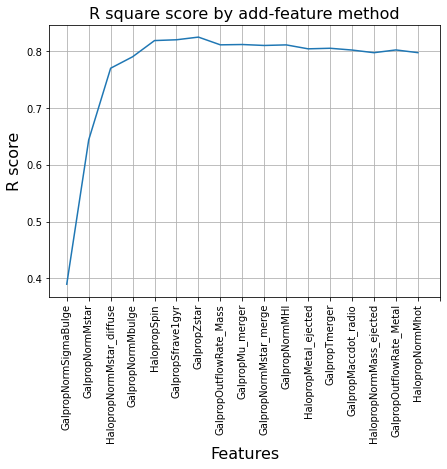

Elapsed time to run RF func on Group 6 Ellipticals: 787.384 seconds


In [37]:
# Note: It takes about ~12 min to run this block of code on ellipticals
start_time = time.time()

ellipticals_RF_results = functions.target_predicting_RF_function(X_6, y_6)

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func on Group 6 Ellipticals: {elapsed_time:.3f} seconds")

#### The most important features for Elliptical galaxies are:
	 1 GalpropNormSigmaBulge 0.38953212507114826
	 2 GalpropNormMstar 0.6439024752307163
	 3 HalopropNormMstar_diffuse 0.7703645379113301
	 4 GalpropNormMbulge 0.7905200833855713
	 5 HalopropSpin 0.8191281091964034
	 6 GalpropSfrave1gyr 0.8205197350291921
	 7 GalpropZstar 0.8252249659988165
	 8 GalpropOutflowRate_Mass 0.811592801238047
	 9 GalpropMu_merger 0.8121538685007543
	 10 GalpropNormMstar_merge 0.810490984763836

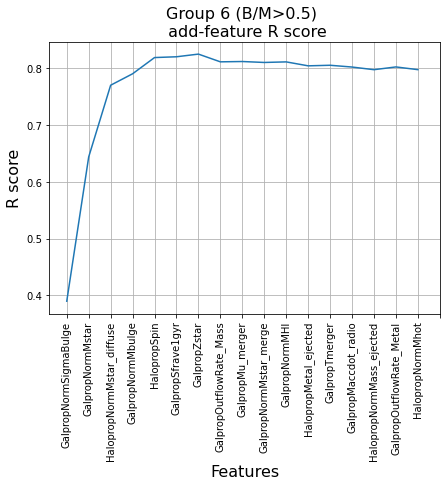

In [39]:
RF_results_6 = ellipticals_RF_results
group6_fig_add_feature=RF_results_6[4].plot(x='features', y='r_sq_score', rot=90, figsize=(7,5), use_index=True,
                    legend=False, grid=True, 
                    xticks=range(0,18))
group6_fig_add_feature.set_title(label= 'Group 6 (B/M>0.5) \n add-feature R score',fontsize=16)
group6_fig_add_feature.set_xlabel('Features',fontsize=16)
group6_fig_add_feature.set_ylabel('R score',fontsize=16)

group6_fig_add_feature.get_figure().savefig('Group 6 R score by add-feature method.jpg', dpi=500)

plt.show()

In [40]:
RF_results_6[4].to_csv('Group 6 Max r scores by add column method.csv', index=False)

group6 = pd.read_csv('Group 6 Max r scores by add column method.csv')

group6_fig = RF_results_6[1]
group6_fig.savefig('Group 6 RF Prediction_vs_True.jpeg', dpi=500)
plt.show()

group6_fig_builtin_imp = RF_results_6[2]
group6_fig_builtin_imp.savefig('Group 6 Built-in Feature Ranking.jpeg', dpi=500)
plt.show()

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best params, best score: 0.7946 {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
RF Accuracy: 0.78 (+/- 0.05)


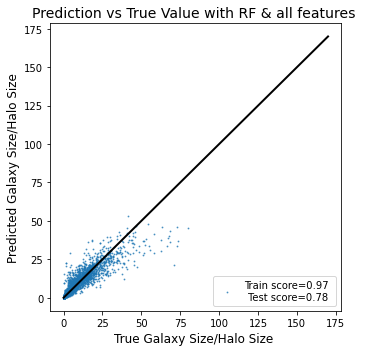

Elapsed time to compute the importances: 0.016 seconds
Elapsed time to compute the importances: 2.784 seconds


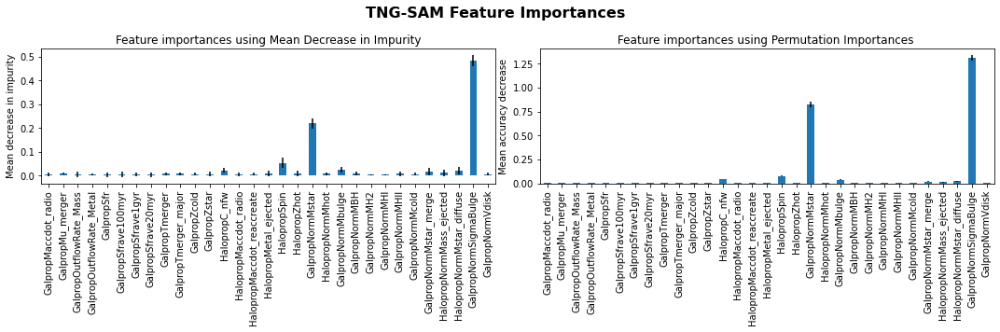

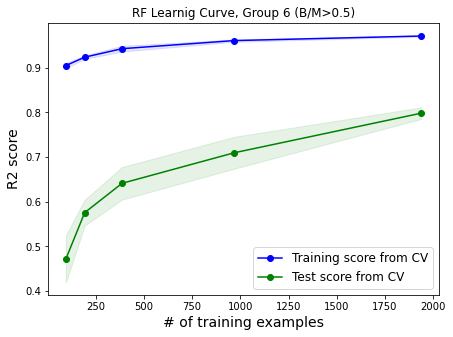

Elapsed time to run RF func and Learning Curves on Group 6 (B/M>0.5): 49.395 seconds


In [30]:
# this code takes ~50seconds to run when the dataset is Group 6 galaxies with ~2,400 entries
start_time = time.time()

RF_lc_6 = tp_lc_functions.target_predicting_RF_function(X_6, y_6, 'RF Learnig Curve, Group 6 (B/M>0.5)')

elapsed_time = time.time() - start_time

print(f"Elapsed time to run RF func and Learning Curves on Group 6 (B/M>0.5): {elapsed_time:.3f} seconds")

In [31]:
lc_6 = RF_lc_6[4]

# lc_6.savefig('RF Group 6 Learning Curve.jpeg', dpi=500)